In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# AML Transaction Detection — IBM Synthetic Dataset

Detecting money laundering in financial transaction data is a class imbalance problem at its core. 
Illicit transactions make up roughly 1 in 1,000 in this dataset, which means most standard models 
will simply learn to ignore them.

This notebook works through the full pipeline: data cleaning, feature engineering, handling class 
imbalance, model comparison, and interpreting results using SHAP. The goal was to find what actually 
moves the needle on minority class detection, not just overall accuracy.

➡ **IMPORTING DATA**

In [2]:
# Importing ground truth labels along with laundering pattern type labels
from azureml.core import Workspace, Dataset, Datastore
import os

subscription_id = os.environ.get('AZURE_SUBSCRIPTION_ID')
resource_group = os.environ.get('AZURE_RESOURCE_GROUP')
workspace_name = os.environ.get('AZURE_WORKSPACE_NAME')

workspace = Workspace(subscription_id, resource_group, workspace_name)

datastore = Datastore.get(workspace, "finalproject")
dataset = Dataset.Tabular.from_delimited_files(path=(datastore, 'HI-Small_Patterns_Processed.csv'))
launderingpatterns = dataset.to_pandas_dataframe()
launderingpatterns.head()

,Timestamp,From Bank,Account,To Bank,Account_1,Amount Received,Receiving Currency,Amount Paid,Payment Currency,Payment Format,Is Laundering,Laundering Type
0,2022/09/01 00:06,21174,800737690,12,80011F990,2848.96,Euro,2848.96,Euro,ACH,1,FAN-OUT
1,2022/09/01 04:33,21174,800737690,20,80020C5B0,8630.40,Euro,8630.40,Euro,ACH,1,FAN-OUT
2,2022/09/01 09:14,21174,800737690,20,80006A5E0,35642.49,Yuan,35642.49,Yuan,ACH,1,FAN-OUT
3,2022/09/01 09:56,21174,800737690,220,8007A5B70,5738987.96,US Dollar,5738987.96,US Dollar,ACH,1,FAN-OUT
4,2022/09/01 11:28,21174,800737690,1244,80093C0D0,7254.53,US Dollar,7254.53,US Dollar,ACH,1,FAN-OUT


In [3]:
# Importing the dataset from cloud storage
from azureml.core import Workspace, Dataset, Datastore
import os

subscription_id = os.environ.get('AZURE_SUBSCRIPTION_ID')
resource_group = os.environ.get('AZURE_RESOURCE_GROUP')
workspace_name = os.environ.get('AZURE_WORKSPACE_NAME')

workspace = Workspace(subscription_id, resource_group, workspace_name)

datastore = Datastore.get(workspace, "finalproject")
dataset = Dataset.Tabular.from_delimited_files(path=(datastore, 'HI-Small_Trans.csv'))
df = dataset.to_pandas_dataframe()
df.head()

,Timestamp,From Bank,Account,To Bank,Account_1,Amount Received,Receiving Currency,Amount Paid,Payment Currency,Payment Format,Is Laundering
0,2022/09/01 00:20,10,8000EBD30,10,8000EBD30,3697.34,US Dollar,3697.34,US Dollar,Reinvestment,0
1,2022/09/01 00:20,3208,8000F4580,1,8000F5340,0.01,US Dollar,0.01,US Dollar,Cheque,0
2,2022/09/01 00:00,3209,8000F4670,3209,8000F4670,14675.57,US Dollar,14675.57,US Dollar,Reinvestment,0
3,2022/09/01 00:02,12,8000F5030,12,8000F5030,2806.97,US Dollar,2806.97,US Dollar,Reinvestment,0
4,2022/09/01 00:06,10,8000F5200,10,8000F5200,36682.97,US Dollar,36682.97,US Dollar,Reinvestment,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5078345 entries, 0 to 5078344
Data columns (total 11 columns):
 #   Column              Dtype  
---  ------              -----  
 0   Timestamp           object 
 1   From Bank           int64  
 2   Account             object 
 3   To Bank             int64  
 4   Account_1           object 
 5   Amount Received     float64
 6   Receiving Currency  object 
 7   Amount Paid         float64
 8   Payment Currency    object 
 9   Payment Format      object 
 10  Is Laundering       int64  
dtypes: float64(2), int64(3), object(6)
memory usage: 426.2+ MB


## Data Loading and Initial Checks

Loading the dataset from Azure cloud storage. Starting with basic checks, data types, 
missing values, and getting a feel for the shape of the data before touching anything.

In [5]:
#checking stats for continous features
df[['Amount Received', 'Amount Paid']].describe()

,Amount Received,Amount Paid
count,5.078345e+06,5.078345e+06
mean,5.988726e+06,4.509273e+06
std,1.037183e+09,8.697728e+08
min,1.000000e-06,1.000000e-06
25%,1.833700e+02,1.844800e+02
50%,1.411010e+03,1.414540e+03
75%,1.234627e+04,1.229784e+04
max,1.046302e+12,1.046302e+12


➡ **PERFORMING EDA AND INITIAL DATA TRANSFORMATIONS**

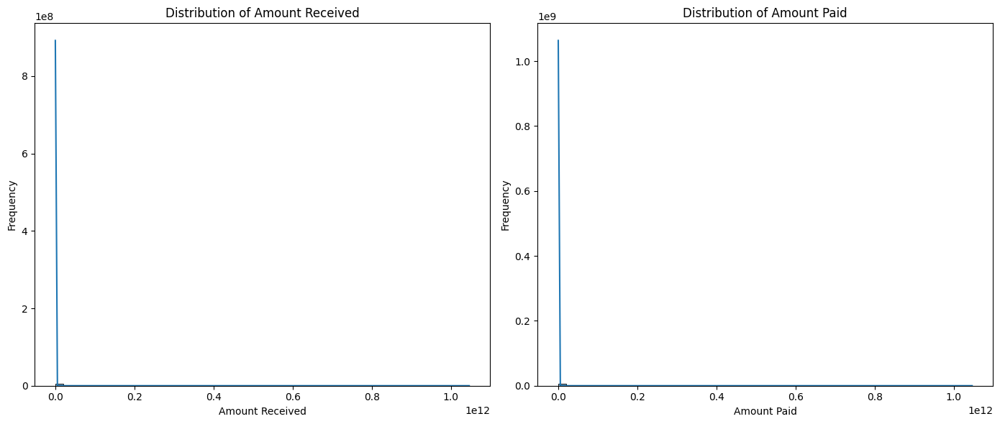

In [6]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set up the figure and axes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plotting the distribution of Amount Received
sns.histplot(df['Amount Received'], ax=ax[0], kde=True, bins=50)
ax[0].set_title('Distribution of Amount Received')
ax[0].set_xlabel('Amount Received')
ax[0].set_ylabel('Frequency')

# Plotting the distribution of Amount Paid
sns.histplot(df['Amount Paid'], ax=ax[1], kde=True, bins=50)
ax[1].set_title('Distribution of Amount Paid')
ax[1].set_xlabel('Amount Paid')
ax[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [7]:
# Checking for missing values in orignal data, although it is synthetic. Performing this step as standard practice
print(df.isnull().sum())


Timestamp             0
From Bank             0
Account               0
To Bank               0
Account_1             0
Amount Received       0
Receiving Currency    0
Amount Paid           0
Payment Currency      0
Payment Format        0
Is Laundering         0
dtype: int64


⦿ **Transforming datatypes to desired datatypes**

In [8]:
import pandas as pd
# Convert the Timestamp column to a datetime dtype
df['Timestamp'] = pd.to_datetime(df['Timestamp'])

# Convert the From Bank column to a category dtype
df['From Bank'] = df['From Bank'].astype('category')

# Convert the Account column to a string dtype
df['Account'] = df['Account'].astype('string')

# Convert the To Bank column to a category dtype
df['To Bank'] = df['To Bank'].astype('category')

# Convert the Account_1 column to a string dtype
df['Account_1'] = df['Account_1'].astype('string')

# Convert the Amount Received column to a float dtype
df['Amount Received'] = df['Amount Received'].astype('float')

# Convert the Receiving Currency column to a category dtype
df['Receiving Currency'] = df['Receiving Currency'].astype('category')

# Convert the Amount Paid column to a float dtype
df['Amount Paid'] = df['Amount Paid'].astype('float')

# Convert the Payment Currency column to a category dtype
df['Payment Currency'] = df['Payment Currency'].astype('category')

# Convert the Payment Format column to a category dtype
df['Payment Format'] = df['Payment Format'].astype('category')

# Convert the Is Laundering column to a category dtype
df['Is Laundering'] = df['Is Laundering'].astype('category')

In [9]:
#checking if transformations are successful 
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5078345 entries, 0 to 5078344
Data columns (total 11 columns):
 #   Column              Dtype         
---  ------              -----         
 0   Timestamp           datetime64[ns]
 1   From Bank           category      
 2   Account             string        
 3   To Bank             category      
 4   Account_1           string        
 5   Amount Received     float64       
 6   Receiving Currency  category      
 7   Amount Paid         float64       
 8   Payment Currency    category      
 9   Payment Format      category      
 10  Is Laundering       category      
dtypes: category(6), datetime64[ns](1), float64(2), string(2)
memory usage: 234.3 MB


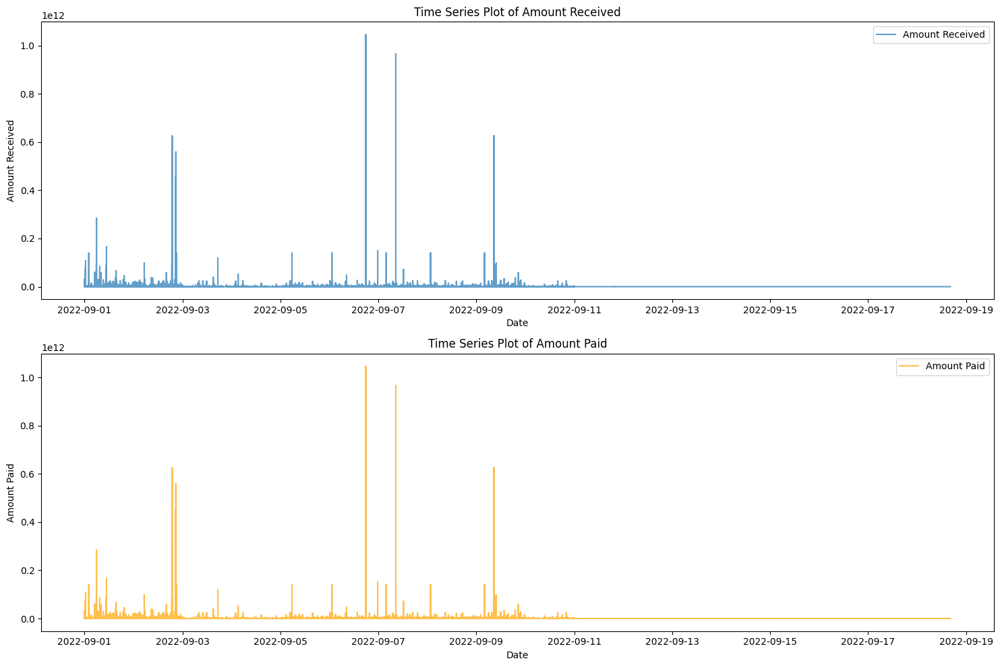

In [10]:
import matplotlib.pyplot as plt

df.sort_values(by=[ 'Timestamp','Account'], inplace=True)

# Creating a figure and a set of subplots
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(15, 10))

# Plotting Amount Received
axes[0].plot(df['Timestamp'], df['Amount Received'], label='Amount Received', alpha=0.7)
axes[0].set_title('Time Series Plot of Amount Received')
axes[0].set_xlabel('Date')
axes[0].set_ylabel('Amount Received')
axes[0].legend()

# Plotting Amount Paid
axes[1].plot(df['Timestamp'], df['Amount Paid'], label='Amount Paid', color='orange', alpha=0.7)
axes[1].set_title('Time Series Plot of Amount Paid')
axes[1].set_xlabel('Date')
axes[1].set_ylabel('Amount Paid')
axes[1].legend()

# Adjuting the layout
plt.tight_layout()
plt.show()


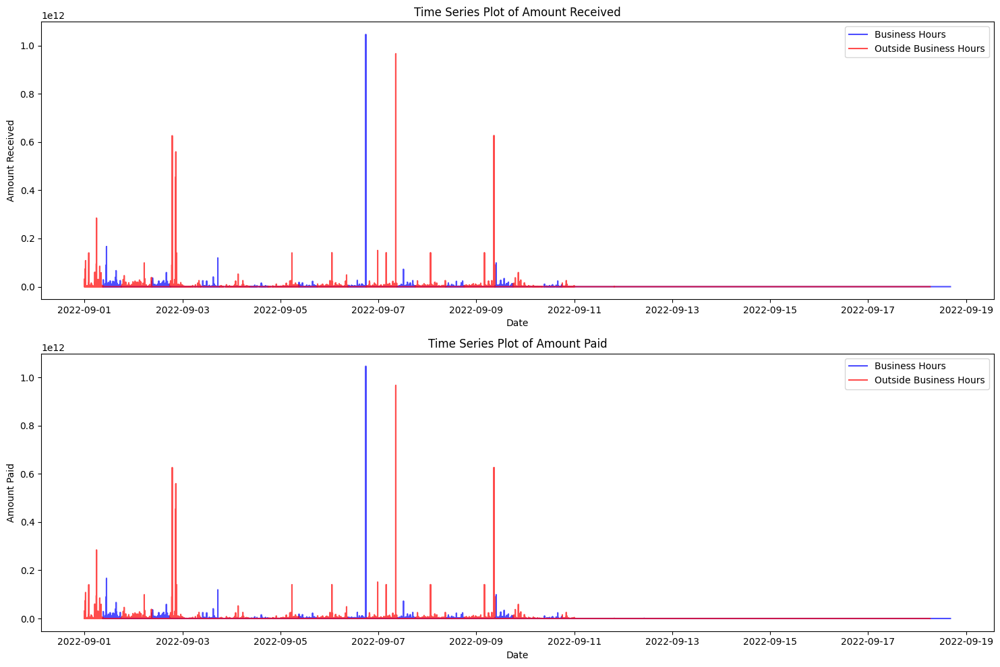

In [11]:
#Visualising distribution of transactions according to business hours

import matplotlib.pyplot as plt

# Extracting hour from the Timestamp
df['Hour'] = df['Timestamp'].dt.hour

df.sort_values(by=[ 'Timestamp','Account'], inplace=True)

# Defining business hours as 9 AM to 5 PM
business_hours = range(9, 18)

# Creating a mask for business hours
is_business_hours = df['Hour'].isin(business_hours)

# Plotting
plt.figure(figsize=(15, 10))

# Plot for Amount Received
plt.subplot(2, 1, 1)
plt.plot(df[is_business_hours]['Timestamp'], df[is_business_hours]['Amount Received'], label='Business Hours', color='blue', alpha=0.7)
plt.plot(df[~is_business_hours]['Timestamp'], df[~is_business_hours]['Amount Received'], label='Outside Business Hours', color='red', alpha=0.7)
plt.title('Time Series Plot of Amount Received')
plt.xlabel('Date')
plt.ylabel('Amount Received')
plt.legend()

# Plot for Amount Paid
plt.subplot(2, 1, 2)
plt.plot(df[is_business_hours]['Timestamp'], df[is_business_hours]['Amount Paid'], label='Business Hours', color='blue', alpha=0.7)
plt.plot(df[~is_business_hours]['Timestamp'], df[~is_business_hours]['Amount Paid'], label='Outside Business Hours', color='red', alpha=0.7)
plt.title('Time Series Plot of Amount Paid')
plt.xlabel('Date')
plt.ylabel('Amount Paid')
plt.legend()

plt.tight_layout()
plt.show()


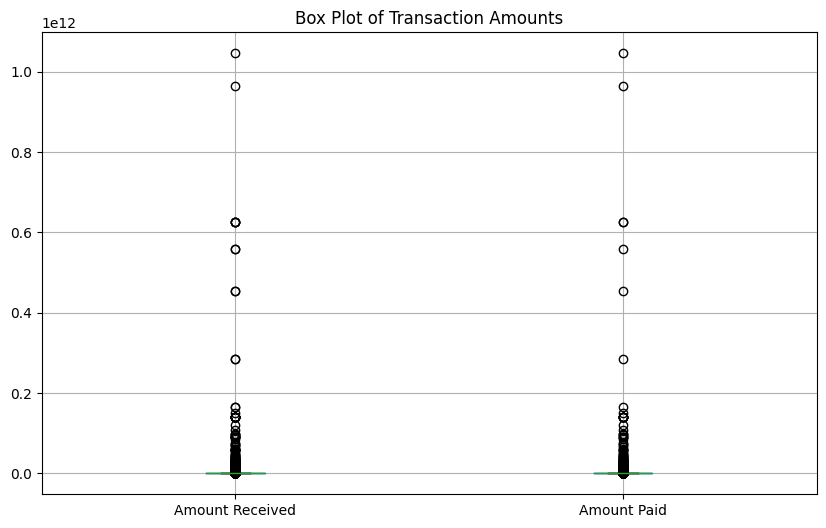

In [12]:
#Checking for outliers

plt.figure(figsize=(10, 6))
df[['Amount Received', 'Amount Paid']].boxplot()
plt.title('Box Plot of Transaction Amounts')
plt.show()


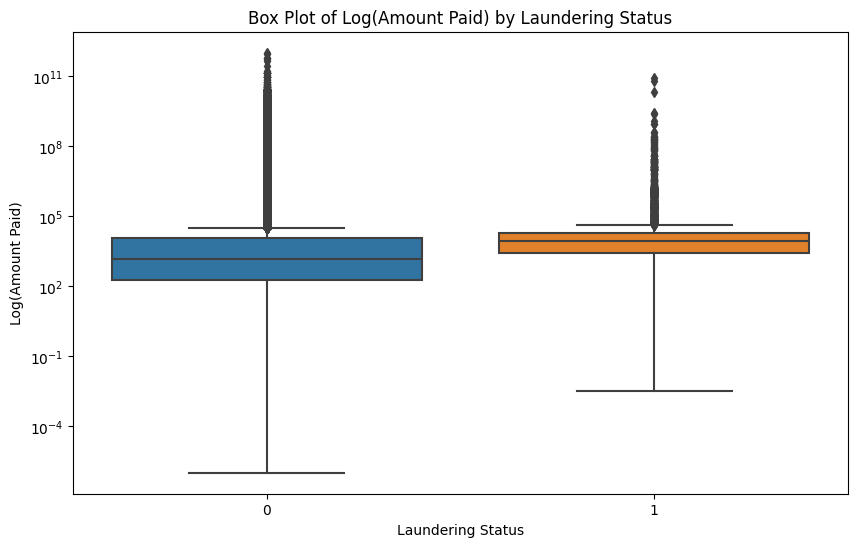

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Setting up the figure and axes
plt.figure(figsize=(10, 6))

# Create a box plot for Amount Received with a logarithmic y-scale as the values are extremed skewed
sns.boxplot(x='Is Laundering', y='Amount Paid', data=df)
plt.yscale('log')  # Set y-scale to logarithmic

# Set labels and title
plt.xlabel('Laundering Status')
plt.ylabel('Log(Amount Paid)')
plt.title('Box Plot of Log(Amount Paid) by Laundering Status')

# Show the plot
plt.show()


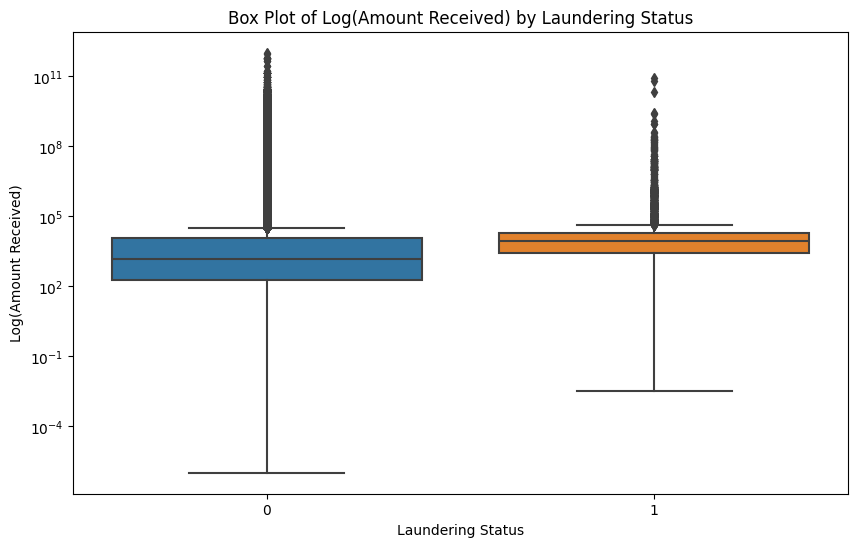

In [14]:
# Setting up the figure and axes
plt.figure(figsize=(10, 6))

# Creating a box plot for Amount Received with a logarithmic y-scale as the values are extremed skewed
sns.boxplot(x='Is Laundering', y='Amount Received', data=df)
plt.yscale('log')  # Set y-scale to logarithmic

# Set labels and title
plt.xlabel('Laundering Status')
plt.ylabel('Log(Amount Received)')
plt.title('Box Plot of Log(Amount Received) by Laundering Status')

# Show the plot
plt.show()


In [15]:
#Gathering some statistics

number_of_sending_banks = df['From Bank'].nunique()
number_of_sender_accounts= df['Account'].nunique()
number_of_sending_currencies=df['Payment Currency'].nunique()
number_of_receiving_banks = df['To Bank'].nunique()
number_of_receiving_accounts= df['Account_1'].nunique()
number_of_receiving_currencies=df['Receiving Currency'].nunique()

print('The number of banks sending money are:',number_of_sending_banks)
print('The number of accounts sending money are:',number_of_sender_accounts)
print('The number of currencies in which money is being sent:',number_of_sending_currencies)
print('The number of banks receiving money are:',number_of_receiving_banks)
print('The number of accounts receiving money are:',number_of_receiving_accounts)
print('The number of currencies in which money is being received:',number_of_receiving_currencies)

The number of banks sending money are: 30470
The number of accounts sending money are: 496995
The number of currencies in which money is being sent: 15
The number of banks receiving money are: 15811
The number of accounts receiving money are: 420636
The number of currencies in which money is being received: 15


In [16]:
column_names = df.columns.tolist()

print(column_names)

['Timestamp', 'From Bank', 'Account', 'To Bank', 'Account_1', 'Amount Received', 'Receiving Currency', 'Amount Paid', 'Payment Currency', 'Payment Format', 'Is Laundering', 'Hour']


In [17]:
a=df['Timestamp'].isnull().sum()
b=df['From Bank'].isnull().sum()
c=df['Account'].isnull().sum()
d=df['To Bank'].isnull().sum()
e=df['Account_1'].isnull().sum()
f=df['Amount Received'].isnull().sum()
g=df['Receiving Currency'].isnull().sum()
h=df['Amount Paid'].isnull().sum()
i=df['Payment Currency'].isnull().sum()
j=df['Payment Currency'].isnull().sum()
k=df['Is Laundering'].isnull().sum()

print(a,b,c,d,e,f,g,h,i,j,k)

0 0 0 0 0 0 0 0 0 0 0


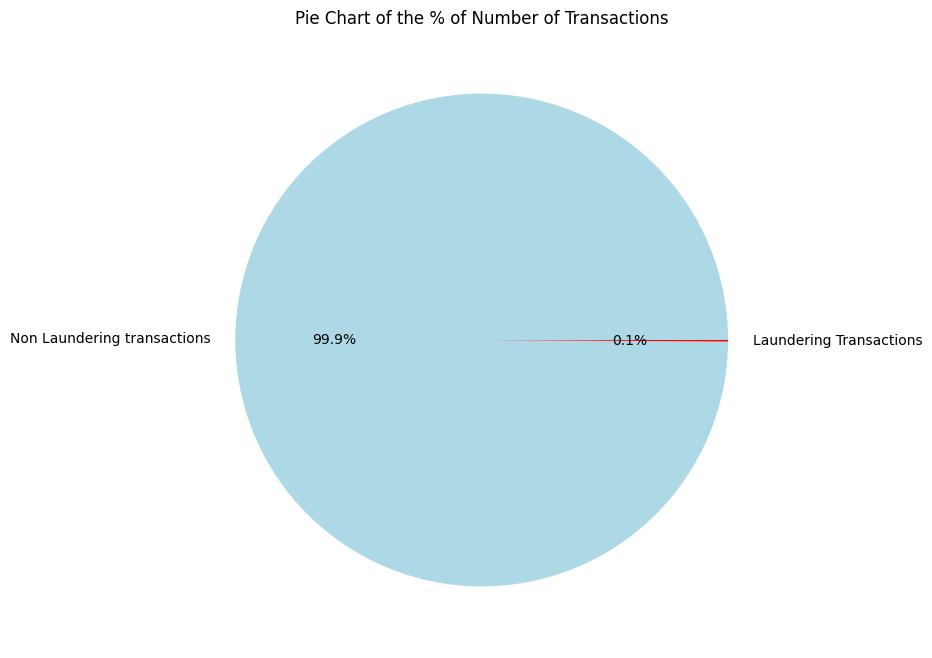

Non Laundering transactions: 5073168
Laundering Transactions: 5177


In [18]:
import matplotlib.pyplot as plt

# plot to display the number of transactions for each category in the Is Laundering column
n_transactions_per_category = df['Is Laundering'].value_counts().sort_values(ascending=False)

# Create a mapping for the labels
labels_map = {0: "Non Laundering transactions", 1: "Laundering Transactions"}
labels = [labels_map[label] for label in n_transactions_per_category.index]

# Specify colors for the pie chart slices
colors_map = {0: "lightblue", 1: "red"}
colors = [colors_map[label] for label in n_transactions_per_category.index]

# Create a pie chart of the % of number of transactions
plt.figure(figsize=(14, 8))
plt.pie(n_transactions_per_category.values, labels=labels, colors=colors, autopct="%1.1f%%")
plt.title("Pie Chart of the % of Number of Transactions")
plt.show()

# Print the number of transactions for each category with the new labels
for label, count in zip(labels, n_transactions_per_category.values):
    print(f"{label}: {count}")


In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5078345 entries, 3437 to 4962234
Data columns (total 12 columns):
 #   Column              Dtype         
---  ------              -----         
 0   Timestamp           datetime64[ns]
 1   From Bank           category      
 2   Account             string        
 3   To Bank             category      
 4   Account_1           string        
 5   Amount Received     float64       
 6   Receiving Currency  category      
 7   Amount Paid         float64       
 8   Payment Currency    category      
 9   Payment Format      category      
 10  Is Laundering       category      
 11  Hour                int32         
dtypes: category(6), datetime64[ns](1), float64(2), int32(1), string(2)
memory usage: 292.5 MB


In [20]:
def detect_outliers_iqr(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[column] < lower_bound) | (data[column] > upper_bound)]
    return outliers

# Detect outliers for 'Amount Received' and 'Amount Paid'
outliers_received = detect_outliers_iqr(df, 'Amount Received')
outliers_paid = detect_outliers_iqr(df, 'Amount Paid')

print(f"Number of outliers detected in 'Amount Received': {len(outliers_received)}")
print(f"Number of outliers detected in 'Amount Paid': {len(outliers_paid)}")


# Check how many of the outliers in 'Amount Received' are laundering transactions
laundering_received = outliers_received['Is Laundering'].value_counts()
print(f"Outliers in 'Amount Received':\n{laundering_received}\n")

# Check how many of the outliers in 'Amount Paid' are laundering transactions
laundering_paid = outliers_paid['Is Laundering'].value_counts()
print(f"Outliers in 'Amount Paid':\n{laundering_paid}")



Number of outliers detected in 'Amount Received': 884251
Number of outliers detected in 'Amount Paid': 881724
Outliers in 'Amount Received':
Is Laundering
0    883241
1      1010
Name: count, dtype: int64

Outliers in 'Amount Paid':
Is Laundering
0    880714
1      1010
Name: count, dtype: int64


In [21]:
df.rename(columns={'Account_1': 'To Account'}, inplace=True)

In [22]:
grouped_df = df.groupby('Account')

## Outlier Detection

Amount Paid and Amount Received are heavily skewed, a handful of very large transactions 
pull the distribution hard to the right. Tested three approaches: IQR, Z-Score, and 
Isolation Forest, to understand what each flags and whether removing outliers makes sense 
here.

Spoiler: it doesn't. Removing outliers risks losing legitimate laundering transactions that 
happen to involve large amounts. Applied log transformation instead to compress the scale 
without losing data.

In [23]:
from scipy.stats import zscore

def detect_outliers_zscore(data, column):
    z_scores = zscore(data[column])
    abs_z_scores = abs(z_scores)
    outliers = data[abs_z_scores > 3]
    return outliers

# Detect outliers for 'Amount Received' and 'Amount Paid'
outliers_received_z = detect_outliers_zscore(df, 'Amount Received')
outliers_paid_z = detect_outliers_zscore(df, 'Amount Paid')

print(f"Number of outliers detected in 'Amount Received' using Z-Score: {len(outliers_received_z)}")
print(f"Number of outliers detected in 'Amount Paid' using Z-Score: {len(outliers_paid_z)}")

# Check how many of the outliers in 'Amount Received' using Z-Score are laundering transactions
laundering_received_z = outliers_received_z['Is Laundering'].value_counts()
print(f"Outliers in 'Amount Received' using Z-Score:\n{laundering_received_z}\n")

# Check how many of the outliers in 'Amount Paid' using Z-Score are laundering transactions
laundering_paid_z = outliers_paid_z['Is Laundering'].value_counts()
print(f"Outliers in 'Amount Paid' using Z-Score:\n{laundering_paid_z}")



Number of outliers detected in 'Amount Received' using Z-Score: 1181
Number of outliers detected in 'Amount Paid' using Z-Score: 985
Outliers in 'Amount Received' using Z-Score:
Is Laundering
0    1178
1       3
Name: count, dtype: int64

Outliers in 'Amount Paid' using Z-Score:
Is Laundering
0    982
1      3
Name: count, dtype: int64


In [24]:
from sklearn.ensemble import IsolationForest
from sklearn.preprocessing import StandardScaler

def isolation_forest_outliers(data, columns):
    
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(data[columns])
    
    # Create the model
    iso_forest = IsolationForest(contamination=0.05, random_state=42)
    
    # Fit the model and predict outliers
    preds = iso_forest.fit_predict(scaled_data)
    
    # Identify the indices of the outliers
    outliers = np.where(preds == -1)
    
    return outliers

# Identify outliers
outliers_iso_forest = isolation_forest_outliers(df, ['Amount Received', 'Amount Paid'])

# Print the number of outliers
print(f"Number of multivariate outliers detected using Isolation Forest: {len(outliers_iso_forest[0])}")

# Filter the dataframe using the outlier indices
outliers_df_iso_forest = df.iloc[outliers_iso_forest[0]]

# Check how many of the multivariate outliers detected using Isolation Forest are laundering transactions
laundering_iso_forest = outliers_df_iso_forest['Is Laundering'].value_counts()
print(f"Multivariate outliers detected using Isolation Forest:\n{laundering_iso_forest}")



Number of multivariate outliers detected using Isolation Forest: 252978
Multivariate outliers detected using Isolation Forest:
Is Laundering
0    252655
1       323
Name: count, dtype: int64


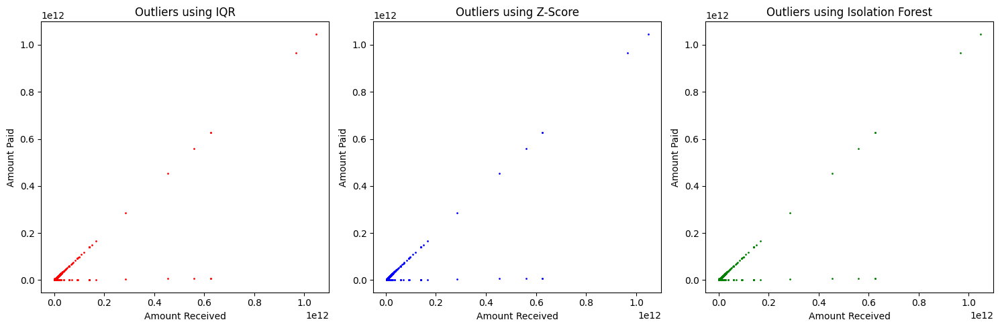

In [25]:
# Scatter plot for IQR method
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.scatter(outliers_received['Amount Received'], outliers_received['Amount Paid'], color='red', s=1)
plt.title('Outliers using IQR')
plt.xlabel('Amount Received')
plt.ylabel('Amount Paid')

# Scatter plot for Z-Score method
plt.subplot(1, 3, 2)
plt.scatter(outliers_received_z['Amount Received'], outliers_received_z['Amount Paid'], color='blue', s=1)
plt.title('Outliers using Z-Score')
plt.xlabel('Amount Received')
plt.ylabel('Amount Paid')

# Scatter plot for Isolation Forest
plt.subplot(1, 3, 3)
plt.scatter(df.iloc[outliers_iso_forest[0]]['Amount Received'], df.iloc[outliers_iso_forest[0]]['Amount Paid'], color='green', s=1)
plt.title('Outliers using Isolation Forest')
plt.xlabel('Amount Received')
plt.ylabel('Amount Paid')

plt.tight_layout()
plt.show()


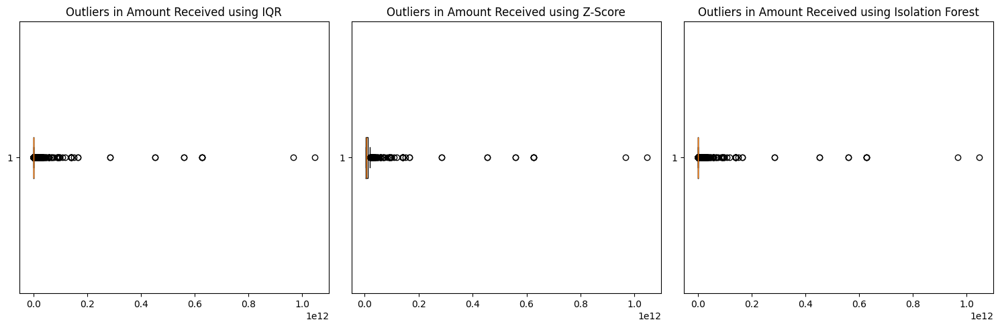

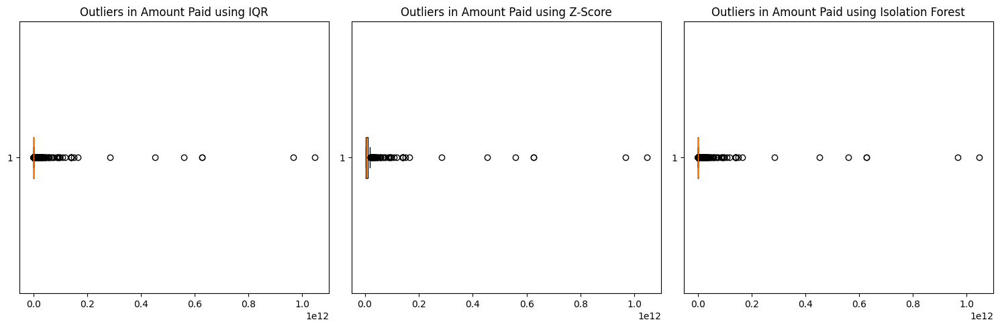

In [26]:
# Box plots for 'Amount Received'
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.boxplot(outliers_received['Amount Received'], vert=False)
plt.title('Outliers in Amount Received using IQR')

plt.subplot(1, 3, 2)
plt.boxplot(outliers_received_z['Amount Received'], vert=False)
plt.title('Outliers in Amount Received using Z-Score')

plt.subplot(1, 3, 3)
plt.boxplot(df.iloc[outliers_iso_forest[0]]['Amount Received'], vert=False)
plt.title('Outliers in Amount Received using Isolation Forest')

plt.tight_layout()
plt.show()

# Box plots for 'Amount Paid'
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.boxplot(outliers_paid['Amount Paid'], vert=False)
plt.title('Outliers in Amount Paid using IQR')

plt.subplot(1, 3, 2)
plt.boxplot(outliers_paid_z['Amount Paid'], vert=False)
plt.title('Outliers in Amount Paid using Z-Score')

plt.subplot(1, 3, 3)
plt.boxplot(df.iloc[outliers_iso_forest[0]]['Amount Paid'], vert=False)
plt.title('Outliers in Amount Paid using Isolation Forest')

plt.tight_layout()
plt.show()


⦿ **As the distribution of the features Amount Paid and Amount Received are extremely skewed two new features are created by applying log transformation to those features so that the distribution is more even**

In [27]:
df['log Amount Received'] = np.log(df['Amount Received'] + 1)  # +1 to handle zero values
df['log Amount Paid'] = np.log(df['Amount Paid'] + 1)

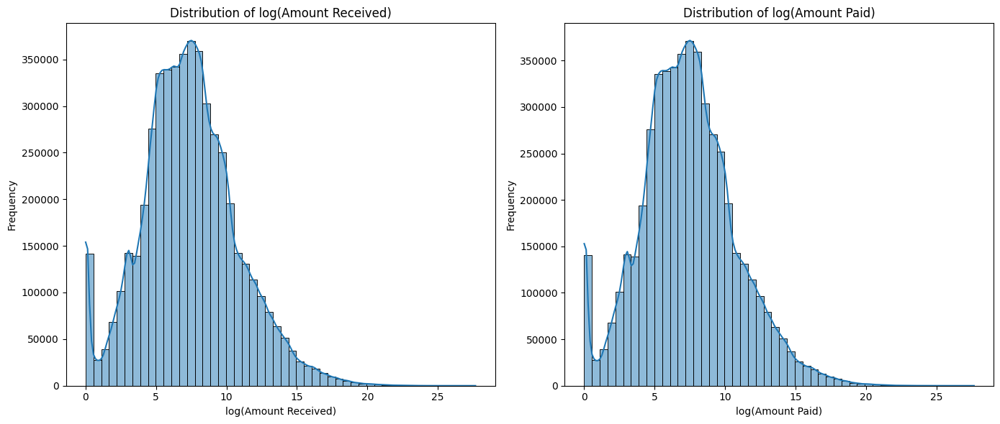

In [28]:
# Set up the figure and axes
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Plotting the distribution of log-transformed Amount Received
sns.histplot(df['log Amount Received'], ax=ax[0], kde=True, bins=50)
ax[0].set_title('Distribution of log(Amount Received)')
ax[0].set_xlabel('log(Amount Received)')
ax[0].set_ylabel('Frequency')

# Plotting the distribution of log-transformed Amount Paid
sns.histplot(df['log Amount Paid'], ax=ax[1], kde=True, bins=50)
ax[1].set_title('Distribution of log(Amount Paid)')
ax[1].set_xlabel('log(Amount Paid)')
ax[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


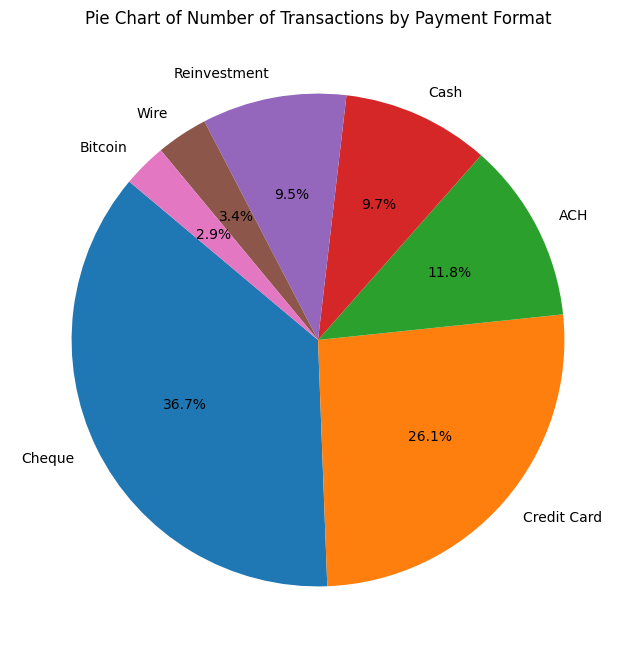

In [29]:
# Get the number of transactions for each category in the Payment Format column
n_transactions_per_format = df['Payment Format'].value_counts().sort_values(ascending=False)

# Creating a pie chart of the number of transactions
plt.figure(figsize=(14, 8))
plt.pie(n_transactions_per_format.values, labels=n_transactions_per_format.index, autopct="%1.1f%%", startangle=140)
plt.title("Pie Chart of Number of Transactions by Payment Format")
plt.show()


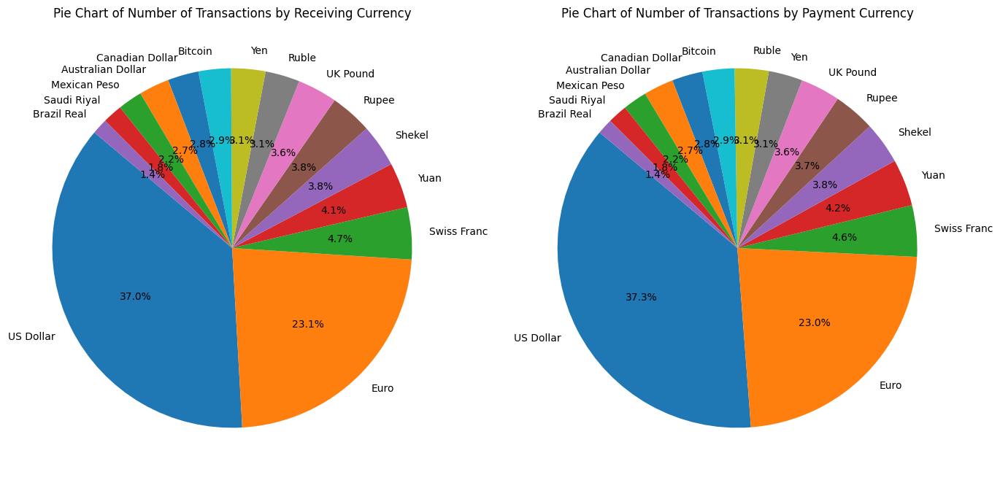

In [30]:
# Get the number of transactions for each category in the Receiving Currency column
n_transactions_received = df['Receiving Currency'].value_counts().sort_values(ascending=False)

# Creating a pie chart of the number of transactions for Amount Received
plt.figure(figsize=(14, 8))
plt.subplot(1, 2, 1)
plt.pie(n_transactions_received.values, labels=n_transactions_received.index, autopct="%1.1f%%", startangle=140)
plt.title("Pie Chart of Number of Transactions by Receiving Currency")

# Get the number of transactions for each category in the Payment Currency column
n_transactions_paid = df['Payment Currency'].value_counts().sort_values(ascending=False)

# Creating a pie chart of the number of transactions for Amount Paid
plt.subplot(1, 2, 2)
plt.pie(n_transactions_paid.values, labels=n_transactions_paid.index, autopct="%1.1f%%", startangle=140)
plt.title("Pie Chart of Number of Transactions by Payment Currency")

# Display the plots
plt.tight_layout()
plt.show()


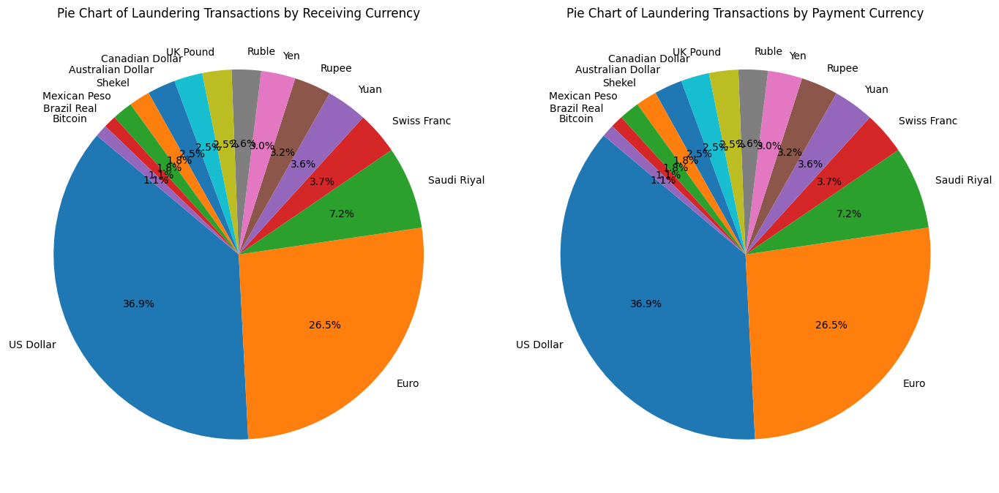

In [31]:
# Filter the dataset to only include laundering transactions
laundering_df = df[df['Is Laundering'] == 1]

# Get the number of laundering transactions for each category in the Receiving Currency column
n_laundering_received = laundering_df['Receiving Currency'].value_counts().sort_values(ascending=False)

# Creating a pie chart of the number of laundering transactions for Amount Received
plt.figure(figsize=(14, 8))
plt.subplot(1, 2, 1)
plt.pie(n_laundering_received.values, labels=n_laundering_received.index, autopct="%1.1f%%", startangle=140)
plt.title("Pie Chart of Laundering Transactions by Receiving Currency")

# Get the number of laundering transactions for each category in the Payment Currency column
n_laundering_paid = laundering_df['Payment Currency'].value_counts().sort_values(ascending=False)

# Creating a pie chart of the number of laundering transactions for Amount Paid
plt.subplot(1, 2, 2)
plt.pie(n_laundering_paid.values, labels=n_laundering_paid.index, autopct="%1.1f%%", startangle=140)
plt.title("Pie Chart of Laundering Transactions by Payment Currency")

# Display the plots
plt.tight_layout()
plt.show()


In [32]:
df['DayOfWeek'] = df['Timestamp'].dt.dayofweek


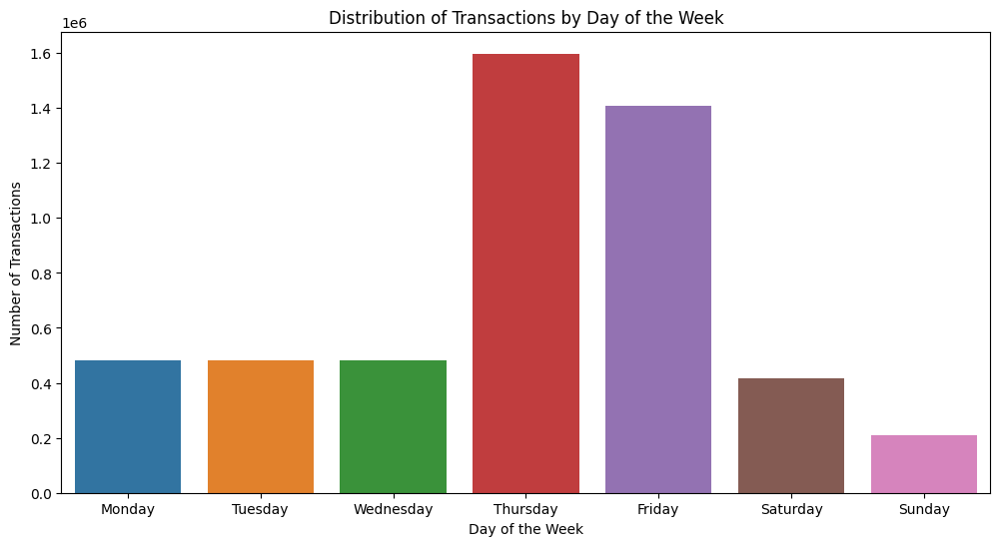

In [33]:
import calendar

# Set up the figure and axes
plt.figure(figsize=(12, 6))

# Aggregating transactions by day of the week
transactions_by_day = df.groupby('DayOfWeek')['Timestamp'].count()

# Map the day numbers to day names
day_names = list(calendar.day_name)
transactions_by_day.index = transactions_by_day.index.map(lambda x: day_names[x])

# Create a bar plot for transactions by day of the week
sns.barplot(x=transactions_by_day.index, y=transactions_by_day.values)

# Set labels and title
plt.xlabel('Day of the Week')
plt.ylabel('Number of Transactions')
plt.title('Distribution of Transactions by Day of the Week')

# Show the plot
plt.show()


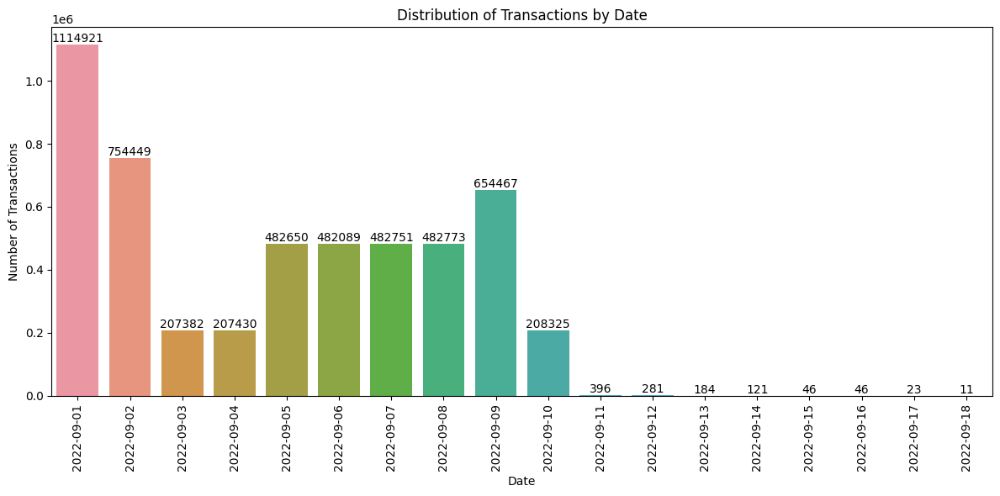

Timestamp
2022-09-01    1114921
2022-09-02     754449
2022-09-03     207382
2022-09-04     207430
2022-09-05     482650
2022-09-06     482089
2022-09-07     482751
2022-09-08     482773
2022-09-09     654467
2022-09-10     208325
2022-09-11        396
2022-09-12        281
2022-09-13        184
2022-09-14        121
2022-09-15         46
2022-09-16         46
2022-09-17         23
2022-09-18         11
Name: Timestamp, dtype: int64

In [34]:
# Set up the figure and axes
plt.figure(figsize=(12, 6))

# Aggregate transactions by day
transactions_by_day = df.groupby(df['Timestamp'].dt.date)['Timestamp'].count()
transactions_by_day = transactions_by_day.squeeze()

# Create a bar plot for transactions by day
sns.barplot(x=transactions_by_day.index, y=transactions_by_day.values)

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Number of Transactions')
plt.title('Distribution of Transactions by Date')

# Rotating x-axis labels for better readability
plt.xticks(rotation=90)

# Display the number of transactions on top of each bar
for i, value in enumerate(transactions_by_day.values):
    plt.text(i, value, str(value), ha='center', va='bottom')

# Show the plot
plt.tight_layout()
plt.show()

transactions_by_day

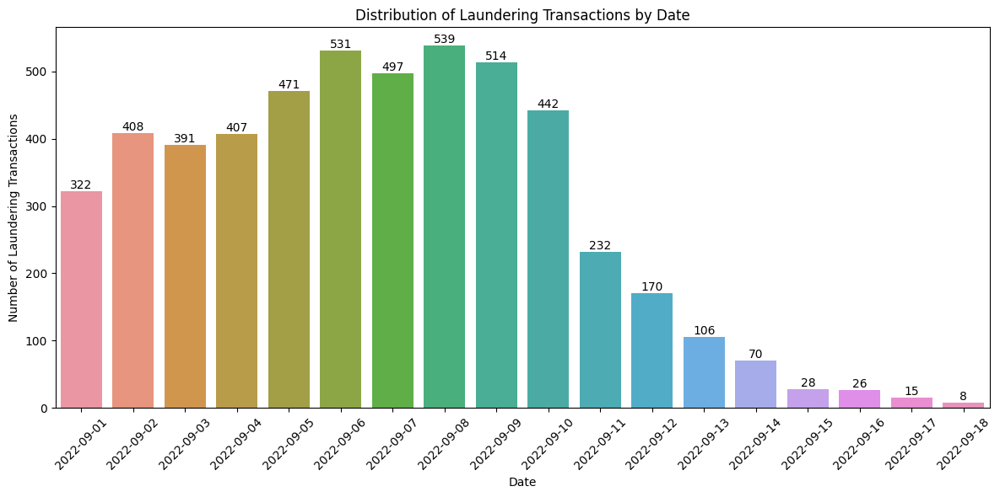

Timestamp
2022-09-01    322
2022-09-02    408
2022-09-03    391
2022-09-04    407
2022-09-05    471
2022-09-06    531
2022-09-07    497
2022-09-08    539
2022-09-09    514
2022-09-10    442
2022-09-11    232
2022-09-12    170
2022-09-13    106
2022-09-14     70
2022-09-15     28
2022-09-16     26
2022-09-17     15
2022-09-18      8
Name: Timestamp, dtype: int64

In [35]:
# Set up the figure and axes
plt.figure(figsize=(12, 6))

# Filter laundering transactions from df
laundering_transactions = df[df['Is Laundering'] == 1]

# Aggregate laundering transactions by day
laundering_by_day = laundering_transactions.groupby(laundering_transactions['Timestamp'].dt.date)['Timestamp'].count()

# Create a bar plot for laundering transactions by day
sns.barplot(x=laundering_by_day.index, y=laundering_by_day.values)

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Number of Laundering Transactions')
plt.title('Distribution of Laundering Transactions by Date')

# Rotating x-axis labels for better readability
plt.xticks(rotation=45)

# Display the number of laundering transactions on top of each bar
for i, value in enumerate(laundering_by_day.values):
    plt.text(i, value, str(value), ha='center', va='bottom')

# Show the plot
plt.tight_layout()
plt.show()

laundering_by_day

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5078345 entries, 3437 to 4962234
Data columns (total 15 columns):
 #   Column               Dtype         
---  ------               -----         
 0   Timestamp            datetime64[ns]
 1   From Bank            category      
 2   Account              string        
 3   To Bank              category      
 4   To Account           string        
 5   Amount Received      float64       
 6   Receiving Currency   category      
 7   Amount Paid          float64       
 8   Payment Currency     category      
 9   Payment Format       category      
 10  Is Laundering        category      
 11  Hour                 int32         
 12  log Amount Received  float64       
 13  log Amount Paid      float64       
 14  DayOfWeek            int32         
dtypes: category(6), datetime64[ns](1), float64(4), int32(2), string(2)
memory usage: 389.3 MB


## Feature Engineering

Raw transaction features alone are not enough to catch money laundering. A single transaction 
looks normal in isolation, the suspicious pattern only emerges when you look at the network 
of accounts it belongs to.

Built three categories of features: graph-based (how connected is this account?), 
transaction-based (what is this account doing over time?), and advanced pattern features 
that flag known laundering behaviours like structuring and smurfing.

In [37]:
import networkx as nx

def add_graph_based_features(df):
    # Create a directed graph from the DataFrame
    G = nx.from_pandas_edgelist(df, 'Account', 'To Account', create_using=nx.DiGraph())

    # Calculate incoming and outgoing transaction counts for each account
    incoming_transactions = dict(G.in_degree())
    outgoing_transactions = dict(G.out_degree())

    # Calculate degree centrality for each account
    degree_centrality = nx.degree_centrality(G)

    # Creating a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()

    # Adding the calculated features to the copy with a default value of 0 for missing accounts
    df_copy['IncomingTransactions'] = df_copy['Account'].map(incoming_transactions).fillna(0).astype(int)
    df_copy['OutgoingTransactions'] = df_copy['Account'].map(outgoing_transactions).fillna(0).astype(int)
    df_copy['DegreeCentrality'] = df_copy['Account'].map(degree_centrality).fillna(0)

    return df_copy

In [38]:
#calculating the local clustering coeff for each account
def add_local_clustering_coefficient(df, G):
    clustering_coefficient = nx.clustering(G)
    df['LocalClusteringCoefficient'] = df['Account'].map(clustering_coefficient).fillna(0)
    return df


In [39]:
# calculating weighted degree based on amount received
def add_weighted_degree(df, G):
    weighted_degree = dict(G.degree(weight='Amount Received'))
    df['WeightedDegree'] = df['Account'].map(weighted_degree).fillna(0)
    return df


In [40]:
#calculating the average neighbour degree for each account
def add_avg_neighbor_degree(df, G):
    avg_neighbor_degree = nx.average_neighbor_degree(G)
    df['AvgNeighborDegree'] = df['Account'].map(avg_neighbor_degree).fillna(0)
    return df


In [42]:
#creating a binary feature to check if an Account is isolated or not
def add_is_isolate(df, G):
    is_isolate = {node: nx.is_isolate(G, node) for node in G.nodes()}
    df['IsIsolate'] = df['Account'].map(is_isolate).fillna(False)
    return df


In [43]:
def compute_time_since_first_transaction(df, threshold=10):
    """
    This function computes the TimeSinceFirstTransaction feature and other new features on the entire dataset.
    """
    # Creating a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()
    
    # Sort the DataFrame by 'Account' and 'Timestamp'
    df_copy.sort_values(by=['Account', 'Timestamp'], inplace=True)
    
    # Calculate 'TimeSinceFirstTransaction'
    df_copy['TimeSinceFirstTransaction'] = df_copy.groupby('Account')['Timestamp'].transform(lambda x: (x - x.min()).dt.total_seconds())
    
    # Add 'Same_Currency' feature
    df_copy['Same_Currency'] = (df_copy['Payment Currency'] == df_copy['Receiving Currency']).astype(int)
    
    # Add 'Payment Method' feature
    payment_method_counts = df_copy['Payment Format'].value_counts()
    less_frequent_methods = payment_method_counts[payment_method_counts < threshold].index
    df_copy['Payment Format'] = df_copy['Payment Format'].apply(lambda x: 'Other' if x in less_frequent_methods else x)
    
    # Add 'Near_10K_Threshold' feature
    df_copy['Near_10K_Threshold'] = ((df_copy['Amount Paid'] >= 8000) & (df_copy['Amount Paid'] <= 10000)).astype(int)
    
    # Add 'Nearly_10K_Transactions' feature
    df_copy['Nearly_10K_Transactions'] = df_copy.groupby('Account')['Near_10K_Threshold'].transform('sum')
    
    # Check for NaN values
    if df_copy.isna().sum().any():
        print("Warning: The DataFrame contains NaN values.")
    
    return df_copy


In [44]:
def compute_pattern_based_features(df, threshold=3000, threshold_count=5):
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()
    
    # Sort the DataFrame by 'Account' and 'Timestamp'
    df_copy.sort_values(by=['Account', 'Timestamp'], inplace=True)
    
    # Set 'Timestamp' as the index for rolling window calculations
    df_copy.set_index('Timestamp', inplace=True)
    
    # Small transactions in 24h
    df_copy['small_transactions_24h'] = df_copy.groupby('Account')['Amount Received'].rolling(window='24H').apply(lambda x: (x < threshold).sum()).reset_index(level=0, drop=True).fillna(0)

    # Unique banks in 24h
    unique_banks_24h = df_copy.groupby('Account').rolling(window='24H')['To Bank'].apply(lambda x: x.nunique()).reset_index(level=0, drop=True).fillna(0)
    df_copy['unique_banks_24h'] = unique_banks_24h
    df_copy['many_unique_banks'] = df_copy['unique_banks_24h'] > 3

    # 7-day and 14-day average Amount Received
    df_copy['AvgAmountReceived_7days'] = df_copy.groupby('Account').rolling(window='7D')['Amount Received'].mean().reset_index(level=0, drop=True).fillna(0)
    df_copy['AvgAmountReceived_14days'] = df_copy.groupby('Account').rolling(window='14D')['Amount Received'].mean().reset_index(level=0, drop=True).fillna(0)

    # Monthly average and relative amount received
    rolling_avg = df_copy.groupby('Account').rolling(window='30D')['Amount Received'].mean().reset_index().fillna(0)
    monthly_avg = rolling_avg.groupby(['Account', 'Timestamp'])['Amount Received'].mean().reset_index()
    df_copy = df_copy.merge(monthly_avg, on=['Account', 'Timestamp'], suffixes=('', '_monthly_avg'))
    df_copy['RelativeAmountReceived'] = df_copy.apply(lambda row: row['Amount Received'] / row['Amount Received_monthly_avg'] if row['Amount Received_monthly_avg'] != 0 else 1, axis=1)

    # Reset the index
    df_copy.reset_index(inplace=True)

    return df_copy


In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5078345 entries, 3437 to 4962234
Data columns (total 15 columns):
 #   Column               Dtype         
---  ------               -----         
 0   Timestamp            datetime64[ns]
 1   From Bank            category      
 2   Account              string        
 3   To Bank              category      
 4   To Account           string        
 5   Amount Received      float64       
 6   Receiving Currency   category      
 7   Amount Paid          float64       
 8   Payment Currency     category      
 9   Payment Format       category      
 10  Is Laundering        category      
 11  Hour                 int32         
 12  log Amount Received  float64       
 13  log Amount Paid      float64       
 14  DayOfWeek            int32         
dtypes: category(6), datetime64[ns](1), float64(4), int32(2), string(2)
memory usage: 389.3 MB


In [46]:
df.head()

,Timestamp,From Bank,Account,To Bank,To Account,Amount Received,Receiving Currency,Amount Paid,Payment Currency,Payment Format,Is Laundering,Hour,log Amount Received,log Amount Paid,DayOfWeek
3437,2022-09-01,70,100428660,10,8006493B0,1064.04,US Dollar,1064.04,US Dollar,Cheque,0,0,6.970768,6.970768,3
3878,2022-09-01,70,100428660,1047,8006CD860,33647.60,US Dollar,33647.60,US Dollar,Cash,0,0,10.423727,10.423727,3
4118,2022-09-01,70,100428660,1292,800712830,14777.01,US Dollar,14777.01,US Dollar,Credit Card,0,0,9.600896,9.600896,3
5612,2022-09-01,70,100428660,11471,8009D7BA0,6117.78,US Dollar,6117.78,US Dollar,Credit Card,0,0,8.719118,8.719118,3
6266,2022-09-01,70,100428660,11107,800B18660,16561.46,US Dollar,16561.46,US Dollar,Credit Card,0,0,9.714894,9.714894,3


In [47]:
# Sorting the DataFrame by Account and Timestamp
df = df.sort_values(by=['Account', 'Timestamp'])

G = nx.from_pandas_edgelist(df, 'Account', 'To Account', create_using=nx.DiGraph())

# Add graph-based features
df = add_graph_based_features(df)



In [48]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5078345 entries, 3437 to 4737349
Data columns (total 18 columns):
 #   Column                Dtype         
---  ------                -----         
 0   Timestamp             datetime64[ns]
 1   From Bank             category      
 2   Account               string        
 3   To Bank               category      
 4   To Account            string        
 5   Amount Received       float64       
 6   Receiving Currency    category      
 7   Amount Paid           float64       
 8   Payment Currency      category      
 9   Payment Format        category      
 10  Is Laundering         category      
 11  Hour                  int32         
 12  log Amount Received   float64       
 13  log Amount Paid       float64       
 14  DayOfWeek             int32         
 15  IncomingTransactions  int64         
 16  OutgoingTransactions  int64         
 17  DegreeCentrality      float64       
dtypes: category(6), datetime64[ns](1), float64(5

In [49]:
df=compute_time_since_first_transaction(df)

In [50]:
G = nx.from_pandas_edgelist(df, 'Account', 'To Account', ['Amount Received'], create_using=nx.DiGraph())
df = add_local_clustering_coefficient(df, G)
df = add_weighted_degree(df, G)
df = add_avg_neighbor_degree(df, G)
df = add_is_isolate(df, G)


In [51]:
df=compute_pattern_based_features(df)

In [52]:
df.rename(columns={'To Account': 'To_Account'}, inplace=True)

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5078345 entries, 0 to 5078344
Data columns (total 34 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   index                        int64         
 1   From Bank                    category      
 2   Timestamp                    datetime64[ns]
 3   Account                      string        
 4   To Bank                      category      
 5   To_Account                   string        
 6   Amount Received              float64       
 7   Receiving Currency           category      
 8   Amount Paid                  float64       
 9   Payment Currency             category      
 10  Payment Format               category      
 11  Is Laundering                category      
 12  Hour                         int32         
 13  log Amount Received          float64       
 14  log Amount Paid              float64       
 15  DayOfWeek                    int32         
 16  

In [54]:
def compute_paid_based_features(df):
    # Create a copy of the DataFrame to avoid modifying the original
    df_copy = df.copy()
    
    # Sort the DataFrame by 'Account' and 'Timestamp'
    df_copy.sort_values(by=['Account', 'Timestamp'], inplace=True)
    
    # Ensuring 'Timestamp' is of datetime type
    df_copy['Timestamp'] = pd.to_datetime(df_copy['Timestamp'])

    # Set 'Timestamp' as the index
    df_copy.set_index('Timestamp', inplace=True)
       
    # 7-day and 14-day average Amount Paid
    df_copy['AvgAmountPaid_7days'] = df_copy.groupby('Account').rolling(window='7D')['Amount Paid'].mean().reset_index(level=0, drop=True).fillna(0)
    df_copy['AvgAmountPaid_14days'] = df_copy.groupby('Account').rolling(window='14D')['Amount Paid'].mean().reset_index(level=0, drop=True).fillna(0)

    # Monthly average and relative amount paid
    rolling_avg_paid = df_copy.groupby('Account').rolling(window='30D')['Amount Paid'].mean().reset_index().fillna(0)
    monthly_avg_paid = rolling_avg_paid.groupby(['Account', 'Timestamp'])['Amount Paid'].mean().reset_index()
    df_copy = df_copy.merge(monthly_avg_paid, on=['Account', 'Timestamp'], suffixes=('', '_monthly_avg_paid'))
    df_copy['RelativeAmountPaid'] = df_copy.apply(lambda row: row['Amount Paid'] / row['Amount Paid_monthly_avg_paid'] if row['Amount Paid_monthly_avg_paid'] != 0 else 1, axis=1)
    
    # Reseting the index
    df_copy.reset_index(inplace=True)

    # Applying log transformation to necessary columns
    columns_to_log_transform = [
        'AvgAmountPaid_7days', 'AvgAmountPaid_14days', 'RelativeAmountPaid',
        'Amount Paid_monthly_avg_paid'
    ]
    
    for col in columns_to_log_transform:
        df_copy[col] = np.log1p(df_copy[col])

    return df_copy


In [55]:
df=compute_paid_based_features(df)

In [56]:
def add_ego_network_size(df, G):
    ego_network_size = {}
    for node in G.nodes():
        ego_network_size[node] = len(nx.ego_graph(G, node))
    df['EgoNetworkSize'] = df['Account'].map(ego_network_size).fillna(0).astype(int)
    return df


In [57]:

df = add_ego_network_size(df, G)


In [58]:
# List of columns to log-transform
columns_to_log_transform = [
    'AvgAmountReceived_7days', 'AvgAmountReceived_14days', 
    'Amount Received_monthly_avg', 'RelativeAmountReceived'
]

# Apply log transformation to the specified columns
for col in columns_to_log_transform:
    df[col] = np.log1p(df[col])


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5078345 entries, 0 to 5078344
Data columns (total 40 columns):
 #   Column                        Dtype         
---  ------                        -----         
 0   level_0                       int64         
 1   index                         int64         
 2   Timestamp                     datetime64[ns]
 3   From Bank                     category      
 4   Account                       string        
 5   To Bank                       category      
 6   To_Account                    string        
 7   Amount Received               float64       
 8   Receiving Currency            category      
 9   Amount Paid                   float64       
 10  Payment Currency              category      
 11  Payment Format                category      
 12  Is Laundering                 category      
 13  Hour                          int32         
 14  log Amount Received           float64       
 15  log Amount Paid               fl

In [60]:
pd.set_option('display.max_columns', None)

In [61]:
df.head()

,level_0,index,Timestamp,From Bank,Account,To Bank,To_Account,Amount Received,Receiving Currency,Amount Paid,Payment Currency,Payment Format,Is Laundering,Hour,log Amount Received,log Amount Paid,DayOfWeek,IncomingTransactions,OutgoingTransactions,DegreeCentrality,TimeSinceFirstTransaction,Same_Currency,Near_10K_Threshold,Nearly_10K_Transactions,LocalClusteringCoefficient,WeightedDegree,AvgNeighborDegree,IsIsolate,small_transactions_24h,unique_banks_24h,many_unique_banks,AvgAmountReceived_7days,AvgAmountReceived_14days,Amount Received_monthly_avg,RelativeAmountReceived,AvgAmountPaid_7days,AvgAmountPaid_14days,Amount Paid_monthly_avg_paid,RelativeAmountPaid,EgoNetworkSize
0,0,0,2022-09-01,70,100428660,10,8006493B0,1064.04,US Dollar,1064.04,US Dollar,Cheque,0,0,6.970768,6.970768,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,1.0,1.0,False,6.970768,6.970768,13.632265,0.001277,6.970768,6.970768,13.632265,0.001277,14231
1,1,1,2022-09-01,70,100428660,1047,8006CD860,33647.60,US Dollar,33647.60,US Dollar,Cash,0,0,10.423727,10.423727,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,1.0,2.0,False,9.761741,9.761741,13.632265,0.039619,9.761741,9.761741,13.632265,0.039619,14231
2,2,2,2022-09-01,70,100428660,1292,800712830,14777.01,US Dollar,14777.01,US Dollar,Credit Card,0,0,9.600896,9.600896,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,1.0,3.0,False,9.710947,9.710947,13.632265,0.017593,9.710947,9.710947,13.632265,0.017593,14231
3,3,3,2022-09-01,70,100428660,11471,8009D7BA0,6117.78,US Dollar,6117.78,US Dollar,Credit Card,0,0,8.719118,8.719118,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,1.0,4.0,True,9.539832,9.539832,13.632265,0.007321,9.539832,9.539832,13.632265,0.007321,14231
4,4,4,2022-09-01,70,100428660,11107,800B18660,16561.46,US Dollar,16561.46,US Dollar,Credit Card,0,0,9.714894,9.714894,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,1.0,5.0,True,9.577382,9.577382,13.632265,0.019697,9.577382,9.577382,13.632265,0.019697,14231


In [62]:
#checking for null values in the main dataframe
print(df.isnull().sum())

level_0                         0
index                           0
Timestamp                       0
From Bank                       0
Account                         0
To Bank                         0
To_Account                      0
Amount Received                 0
Receiving Currency              0
Amount Paid                     0
Payment Currency                0
Payment Format                  0
Is Laundering                   0
Hour                            0
log Amount Received             0
log Amount Paid                 0
DayOfWeek                       0
IncomingTransactions            0
OutgoingTransactions            0
DegreeCentrality                0
TimeSinceFirstTransaction       0
Same_Currency                   0
Near_10K_Threshold              0
Nearly_10K_Transactions         0
LocalClusteringCoefficient      0
WeightedDegree                  0
AvgNeighborDegree               0
IsIsolate                       0
small_transactions_24h          0
unique_banks_2

In [63]:
def add_rounding_features(df):
    df['Round_Thousands'] = (df['Amount Paid'] % 1000 == 0).astype(int)
    df['Round_Ten_Thousands'] = (df['Amount Paid'] % 10000 == 0).astype(int)
    return df

# Adding the features to the entire dataset
df = add_rounding_features(df)

# Checking for null or NaN values
if df[['Round_Thousands', 'Round_Ten_Thousands']].isnull().any().any():
    print("Warning: Null or NaN values found.")
else:
    print("No null or NaN values found.")


No null or NaN values found.


In [64]:
# List of original columns to drop
columns_to_drop = [
    'AvgAmountPaid_7days', 'AvgAmountPaid_14days', 'RelativeAmountPaid',
    'Amount Paid_monthly_avg_paid'
]

# Drop the original columns
df.drop(columns=columns_to_drop, inplace=True)

# Renaming the log-transformed columns to their original names
df.rename(columns={
    'log AvgAmountPaid_7days': 'AvgAmountPaid_7days',
    'log AvgAmountPaid_14days': 'AvgAmountPaid_14days',
    'log RelativeAmountPaid': 'RelativeAmountPaid',
    'log Amount Paid_monthly_avg_paid': 'Amount Paid_monthly_avg_paid'
}, inplace=True)


In [65]:
# Sorting the dataframe by 'Timestamp' just to be sure
df = df.sort_values(by='Timestamp')

# Splitting data based on the date range for training and testing
train_df = df[(df['Timestamp'] >= '2022-09-01') & (df['Timestamp'] <= '2022-09-08')]
test_df = df[(df['Timestamp'] >= '2022-09-09') & (df['Timestamp'] <= '2022-09-18')]


In [66]:
def calculate_account_summary(df):
    # Sort the DataFrame by 'Account' for consistency
    df_sorted = df.sort_values(by=['Timestamp','Account'])

    # Calculate total transaction count for each account
    total_transaction_count = df_sorted.groupby('Account').size().rename('TotalTransactionCount')

    # Calculate total log amount received and total log amount paid for each account
    total_log_amount_received = df_sorted.groupby('Account')['log Amount Received'].sum().rename('TotalLogAmountReceived')
    total_log_amount_paid = df_sorted.groupby('Account')['log Amount Paid'].sum().rename('TotalLogAmountPaid')

    # Merge the calculated summaries into the original DataFrame
    df_merged = df_sorted.merge(total_transaction_count, on='Account', how='left')
    df_merged = df_merged.merge(total_log_amount_received, on='Account', how='left')
    df_merged = df_merged.merge(total_log_amount_paid, on='Account', how='left')

    return df_merged


In [67]:
def add_amount_received_features(df, global_mean=None, global_median=None, global_std=None):
    # Group by 'Account' and aggregate 'Amount Received' with mean, std, and median
    account_stats = df.groupby('Account')['log Amount Received'].agg(
        ReceivedAmountMean='mean',
        ReceivedAmountStdDev='std',
        ReceivedAmountMedian='median'
    )
    
    # If global values are provided (for test set), use them. This is being done to prevent data leakage, as a the study is using a temporal split
    if global_mean:
        account_stats['ReceivedAmountMean'].fillna(global_mean, inplace=True)
    if global_median:
        account_stats['ReceivedAmountMedian'].fillna(global_median, inplace=True)
    if global_std:
        account_stats['ReceivedAmountStdDev'].fillna(global_std, inplace=True)
    else:
        account_stats['ReceivedAmountStdDev'].fillna(0, inplace=True)

    # Merge the aggregated statistics back to the main DataFrame
    df = df.merge(account_stats, left_on='Account', right_index=True)

    # Calculate the deviation of 'Amount Received' from the mean, normalised by standard deviation
    # Adding a small constant to the denominator
    df['AmountReceivedDeviation'] = (df['Amount Received'] - df['ReceivedAmountMean']) / (df['ReceivedAmountStdDev'] + 1e-10)
    df['AmountReceivedDeviation'].fillna(0, inplace=True)  # Handle cases where std deviation is 0

    # Calculate 'DailyTransactionCount'
    df['DailyTransactionCount'] = df.groupby(['Account', df['Timestamp'].dt.date])['Amount Received'].transform('count')

    return df, account_stats['ReceivedAmountMean'].mean(), account_stats['ReceivedAmountMedian'].median(), account_stats['ReceivedAmountStdDev'].mean()


In [68]:
def add_above_10k_feature(df):
    # Sort the data by Account and Timestamp
    df = df.sort_values(by=['Account', 'Timestamp'])
    
    # Initialise a new column with zeros
    df['Above_10k'] = 0
    
    # Filter transactions above $10,000
    df['Above_10k'] = (df['Amount Received'] > 10000).astype(int)
    
    # Calculate the cumulative sum of transactions above $10,000 for each account
    df['Cumulative_Above_10k'] = df.groupby('Account')['Above_10k'].cumsum()
    
    return df


In [69]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 750425
Data columns (total 38 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   level_0                      int64         
 1   index                        int64         
 2   Timestamp                    datetime64[ns]
 3   From Bank                    category      
 4   Account                      string        
 5   To Bank                      category      
 6   To_Account                   string        
 7   Amount Received              float64       
 8   Receiving Currency           category      
 9   Amount Paid                  float64       
 10  Payment Currency             category      
 11  Payment Format               category      
 12  Is Laundering                category      
 13  Hour                         int32         
 14  log Amount Received          float64       
 15  log Amount Paid              float64       
 16  DayOfW

In [70]:
train_df = calculate_account_summary(train_df)
train_df, train_mean, train_median, train_std = add_amount_received_features(train_df)

In [71]:
# Calculate account summary for test_df
test_df = calculate_account_summary(test_df)

# Calculate additional features for test_df
test_df, _, _, _ = add_amount_received_features(test_df, train_mean, train_median, train_std)


In [72]:
# Creating a list of DataFrames including train_df and test_df
data_frames = [train_df, test_df]

# Applying the add_above_10k_feature function to all DataFrames
for i, df in enumerate(data_frames):
    data_frames[i] = add_above_10k_feature(df)

# Checking for null or NaN values in the new column for each DataFrame
for i, df in enumerate(data_frames):
    if df['Cumulative_Above_10k'].isnull().any():
        print(f"Warning: Null or NaN values found in DataFrame {i}.")
    else:
        print(f"No null or NaN values found in DataFrame {i}.")


No null or NaN values found in DataFrame 0.
No null or NaN values found in DataFrame 1.


In [73]:
def create_derived_features(df, train_stats=None):
    
    # Define the symmetric_log function inside the main function
    def symmetric_log(x):
        return np.sign(x) * np.log1p(np.abs(x))
    
    # Calculate the raw Amount Ratio
    epsilon = 1e-9  # small constant to avoid division by zero
    df['Amount Ratio'] = df['Amount Received'] / (df['Amount Paid'] + epsilon)
    
    # Handle extreme values by capping them
    lower_threshold = df['Amount Ratio'].quantile(0.01)
    upper_threshold = df['Amount Ratio'].quantile(0.99)
    df['Amount Ratio'] = np.clip(df['Amount Ratio'], lower_threshold, upper_threshold)
    
    # Apply symmetric log transformation to Amount Ratio
    df['Amount Ratio'] = df['Amount Ratio'].apply(symmetric_log)
    
    # If train_stats is not provided, calculate and store statistics from the current DataFrame, this is being done to prevent data leakage between train and test set, as the study is being conducted on a temporal split
    if train_stats is None:
        train_stats = {
            'TotalAmountReceived': df['Amount Received'].sum()
        }
    
    # Calculating RelativeAmount using actual transaction values
    df['RelativeAmount'] = df['Amount Received'] / train_stats['TotalAmountReceived']
    
    # Calculating incoming_to_outgoing_ratio using actual transaction values
    df['incoming_to_outgoing_ratio'] = df['Amount Received'] / (df['Amount Paid'] + epsilon)
    
    # Applying symmetric log transformation to incoming_to_outgoing_ratio
    df['incoming_to_outgoing_ratio'] = df['incoming_to_outgoing_ratio'].apply(symmetric_log)
    
    # Calculating amount_discrepancy using actual transaction values
    df['amount_discrepancy'] = df['Amount Received'] - df['Amount Paid']
    
    # Apply symmetric log transformation to amount_discrepancy
    df['amount_discrepancy'] = df['amount_discrepancy'].apply(symmetric_log)
    
    # TimeDifference
    df['TimeDifference'] = df.groupby('Account')['Timestamp'].diff().dt.total_seconds()
    
    # AvgTimeDifference
    if 'AvgTimeDifference' not in train_stats:
        train_stats['AvgTimeDifference'] = df.groupby('Account')['TimeDifference'].transform('mean')
    df['AvgTimeDifference'] = train_stats['AvgTimeDifference']
    
    # RelativeFrequency
    df['RelativeFrequency'] = df['TimeDifference'] / df['AvgTimeDifference']
    
    # Handle potential NaN values
    df['TimeDifference'].fillna(0, inplace=True)
    df['AvgTimeDifference'].fillna(0, inplace=True)
    df['RelativeFrequency'].fillna(0, inplace=True)
    
    return df, train_stats


In [74]:
def create_behavioral_features(df):
    # Sort the DataFrame by 'Account' and 'Timestamp'
    df.sort_values(by=['Account', 'Timestamp'], inplace=True)

   
    # NearThreshold using raw values
    threshold_large_transaction = 10000
    df['NearThreshold'] = ((df['Amount Received'] > (threshold_large_transaction - 1000)) & 
                           (df['Amount Received'] < threshold_large_transaction)).astype(int)
    
    # IsPotentialSmurfing using raw values
    df['IsPotentialSmurfing'] = (df['Amount Received'] < 1000).astype(int)

    # large_outgoing using raw values
    df['large_outgoing'] = (df['Amount Paid'] > 10000).astype(int)

    # foreign_currency_transactions & high_foreign_transactions
    df['foreign_currency_transactions'] = (df['Receiving Currency'] != 'USD').astype(int)
    df['high_foreign_transactions'] = df.groupby('Account')['foreign_currency_transactions'].transform('sum') > 5

    # high_incoming_outgoing_ratio using log-transformed values
    df['high_incoming_outgoing_ratio'] = (df['incoming_to_outgoing_ratio'] > 5).astype(int)

    # high_amount_discrepancy using raw values
    df['high_amount_discrepancy'] = (df['amount_discrepancy'].abs() > 5000).astype(int)

    # RapidTransactions
    df['RapidTransactions'] = df.groupby('Account')['Timestamp'].diff().lt(pd.Timedelta(minutes=5)).astype(int)

    # TimeSinceLastTransaction
    df['TimeSinceLastTransaction'] = df.groupby('Account')['Timestamp'].diff().dt.total_seconds() / 3600  # in hours

    # StructuringScore using a mix of log-transformed and raw values
    weights = {
        'RelativeAmount': 1,
        'Amount Ratio': 1,
        'TimeDifference': 1,
        'NearThreshold': 1,
        'incoming_to_outgoing_ratio': 1,
        'amount_discrepancy': 1
    }
    df['StructuringScore'] = sum(df[feature] * weight for feature, weight in weights.items())
    
    # IsPotentialStructuring
    threshold = df['StructuringScore'].quantile(0.95)
    df['IsPotentialStructuring'] = (df['StructuringScore'] > threshold).astype(int)
    
    return df


In [75]:
# Applying the derived features function to the training set
train_df, train_stats = create_derived_features(train_df)

In [76]:
# Applying the derived features function to the test set using train_stats
test_df, _ = create_derived_features(test_df, train_stats)

In [77]:
pd.set_option('display.max_columns', None)

In [78]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732478
Data columns (total 53 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   level_0                      int64         
 1   index                        int64         
 2   Timestamp                    datetime64[ns]
 3   From Bank                    category      
 4   Account                      string        
 5   To Bank                      category      
 6   To_Account                   string        
 7   Amount Received              float64       
 8   Receiving Currency           category      
 9   Amount Paid                  float64       
 10  Payment Currency             category      
 11  Payment Format               category      
 12  Is Laundering                category      
 13  Hour                         int32         
 14  log Amount Received          float64       
 15  log Amount Paid              float64       
 16  DayOf

In [79]:
# Applying the behavioral features function on train and test sets
train_df = create_behavioral_features(train_df)
test_df = create_behavioral_features(test_df)

In [80]:
print(train_df.isnull().sum())

level_0                          0
index                            0
Timestamp                        0
From Bank                        0
Account                          0
                             ...  
high_amount_discrepancy          0
RapidTransactions                0
TimeSinceLastTransaction    494190
StructuringScore                 0
IsPotentialStructuring           0
Length: 64, dtype: int64


In [81]:
print(test_df.isnull().sum())


level_0                          0
index                            0
Timestamp                        0
From Bank                        0
Account                          0
                             ...  
high_amount_discrepancy          0
RapidTransactions                0
TimeSinceLastTransaction    215415
StructuringScore                 0
IsPotentialStructuring           0
Length: 64, dtype: int64


In [82]:
# Checking if train and test have the same columns
train_columns = set(train_df.columns)
test_columns = set(test_df.columns)


if train_columns == test_columns:
    print("Both train and test datasets have the same features.")
else:
    missing_in_train_test = test_columns - train_columns
    missing_in_test_train = train_columns - test_columns
    
    if missing_in_train_test:
        print(f"Features present in test but missing in train: {missing_in_train_test}")
    if missing_in_test_train:
        print(f"Features present in train but missing in test: {missing_in_test_train}")


Both train and test datasets have the same features.


In [83]:
def handle_null_values(df):
    # Handling null values for TimeDifference and TimeSinceLastTransaction
    avg_time_diff = df['TimeDifference'].mean()
    df['TimeDifference'].fillna(avg_time_diff, inplace=True)
    df['TimeSinceLastTransaction'].fillna(avg_time_diff, inplace=True)
    
    # Handling null values for AvgTimeDifference
    df['AvgTimeDifference'].fillna(df['TimeDifference'], inplace=True)
    
    # Handling null values for RelativeFrequency
    df['RelativeFrequency'].fillna(1, inplace=True)
    
    # Recalculating StructuringScore
    weights = {
        'RelativeAmount': 1,
        'Amount Ratio': 1,
        'TimeDifference': 1,
        'NearThreshold': 1,
        'incoming_to_outgoing_ratio': 1,
        'amount_discrepancy': 1
    }
    df['StructuringScore'] = sum(df[feature] * weight for feature, weight in weights.items())
    
    return df

# Applying the function to handle null values
train_df = handle_null_values(train_df)
test_df = handle_null_values(test_df)


In [84]:
print(train_df.isnull().sum())


level_0                     0
index                       0
Timestamp                   0
From Bank                   0
Account                     0
                           ..
high_amount_discrepancy     0
RapidTransactions           0
TimeSinceLastTransaction    0
StructuringScore            0
IsPotentialStructuring      0
Length: 64, dtype: int64


In [85]:
print(test_df.isnull().sum())


level_0                     0
index                       0
Timestamp                   0
From Bank                   0
Account                     0
                           ..
high_amount_discrepancy     0
RapidTransactions           0
TimeSinceLastTransaction    0
StructuringScore            0
IsPotentialStructuring      0
Length: 64, dtype: int64


In [86]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3576005
Data columns (total 64 columns):
 #   Column                         Dtype         
---  ------                         -----         
 0   level_0                        int64         
 1   index                          int64         
 2   Timestamp                      datetime64[ns]
 3   From Bank                      category      
 4   Account                        string        
 5   To Bank                        category      
 6   To_Account                     string        
 7   Amount Received                float64       
 8   Receiving Currency             category      
 9   Amount Paid                    float64       
 10  Payment Currency               category      
 11  Payment Format                 category      
 12  Is Laundering                  category      
 13  Hour                           int32         
 14  log Amount Received            float64       
 15  log Amount Paid     

In [87]:
train_df.head()

,level_0,index,Timestamp,From Bank,Account,To Bank,To_Account,Amount Received,Receiving Currency,Amount Paid,Payment Currency,Payment Format,Is Laundering,Hour,log Amount Received,log Amount Paid,DayOfWeek,IncomingTransactions,OutgoingTransactions,DegreeCentrality,TimeSinceFirstTransaction,Same_Currency,Near_10K_Threshold,Nearly_10K_Transactions,LocalClusteringCoefficient,WeightedDegree,AvgNeighborDegree,IsIsolate,small_transactions_24h,unique_banks_24h,many_unique_banks,AvgAmountReceived_7days,AvgAmountReceived_14days,Amount Received_monthly_avg,RelativeAmountReceived,EgoNetworkSize,Round_Thousands,Round_Ten_Thousands,TotalTransactionCount,TotalLogAmountReceived,TotalLogAmountPaid,ReceivedAmountMean,ReceivedAmountStdDev,ReceivedAmountMedian,AmountReceivedDeviation,DailyTransactionCount,Amount Ratio,RelativeAmount,incoming_to_outgoing_ratio,amount_discrepancy,TimeDifference,AvgTimeDifference,RelativeFrequency,NearThreshold,IsPotentialSmurfing,large_outgoing,foreign_currency_transactions,high_foreign_transactions,high_incoming_outgoing_ratio,high_amount_discrepancy,RapidTransactions,TimeSinceLastTransaction,StructuringScore,IsPotentialStructuring
0,0,0,2022-09-01,70,100428660,10,8006493B0,1064.04,US Dollar,1064.04,US Dollar,Cheque,0,0,6.970768,6.970768,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,1.0,1.0,False,6.970768,6.970768,13.632265,0.001277,14231,0,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,397.870377,22801,0.693147,4.431657e-11,0.693147,0.0,0.0,5.038446,0.0,0,0,0,1,True,0,0,0,22004.670465,1.386294,0
1,24,24,2022-09-01,70,100428660,23885,805DEB4F0,53574.59,US Dollar,53574.59,US Dollar,Cheque,0,0,10.888849,10.888849,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,7.0,22.0,True,13.599985,13.599985,13.632265,0.062363,14231,0,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,20167.345152,22801,0.693147,2.231347e-09,0.693147,0.0,0.0,5.038446,0.0,0,0,1,1,True,0,0,1,0.000000,1.386294,0
2,25,25,2022-09-01,70,100428660,12719,8062E2550,12346.28,US Dollar,12346.28,US Dollar,Cheque,0,0,9.421191,9.421191,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,7.0,23.0,True,13.561377,13.561377,13.632265,0.014720,14231,0,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,4645.473175,22801,0.693147,5.142145e-10,0.693147,0.0,0.0,5.038446,0.0,0,0,1,1,True,0,0,1,0.000000,1.386294,0
3,26,26,2022-09-01,70,100428660,211075,806844C00,4408.45,US Dollar,4408.45,US Dollar,Cash,0,0,8.391505,8.391505,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,7.0,24.0,True,13.523855,13.523855,13.632265,0.005281,14231,0,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,1656.993146,22801,0.693147,1.836091e-10,0.693147,0.0,0.0,5.038446,0.0,0,0,0,1,True,0,0,1,0.000000,1.386294,0
4,27,27,2022-09-01,70,100428660,11318,80685C400,5246.84,US Dollar,5246.84,US Dollar,Credit Card,0,0,8.565572,8.565572,3,545,14230,0.028685,0.0,1,0,3311,0.000008,1.151584e+10,2.269501,False,7.0,25.0,True,13.487747,13.487747,13.632265,0.006282,14231,0,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,1972.635050,22801,0.693147,2.185275e-10,0.693147,0.0,0.0,5.038446,0.0,0,0,0,1,True,0,0,1,0.000000,1.386294,0


In [88]:
# Print unique values for 'Receiving Currency'
print("Unique values in 'Receiving Currency':")
print(train_df['Receiving Currency'].unique())

# Print unique values for 'Payment Currency'
print("\nUnique values in 'Payment Currency':")
print(train_df['Payment Currency'].unique())

# Print unique values for 'Payment Format'
print("\nUnique values in 'Payment Format':")
print(train_df['Payment Format'].unique())


Unique values in 'Receiving Currency':
['US Dollar', 'Euro', 'Yuan', 'Yen', 'Rupee', ..., 'Brazil Real', 'Swiss Franc', 'Shekel', 'Saudi Riyal', 'Bitcoin']
Length: 15
Categories (15, object): ['Australian Dollar', 'Bitcoin', 'Brazil Real', 'Canadian Dollar', ..., 'UK Pound', 'US Dollar', 'Yen', 'Yuan']

Unique values in 'Payment Currency':
['US Dollar', 'Euro', 'Yuan', 'Yen', 'Rupee', ..., 'Brazil Real', 'Swiss Franc', 'Shekel', 'Saudi Riyal', 'Bitcoin']
Length: 15
Categories (15, object): ['Australian Dollar', 'Bitcoin', 'Brazil Real', 'Canadian Dollar', ..., 'UK Pound', 'US Dollar', 'Yen', 'Yuan']

Unique values in 'Payment Format':
['Cheque', 'Cash', 'Credit Card', 'Bitcoin', 'ACH', 'Wire', 'Reinvestment']
Categories (7, object): ['ACH', 'Bitcoin', 'Cash', 'Cheque', 'Credit Card', 'Reinvestment', 'Wire']


In [89]:
from category_encoders import TargetEncoder

# Convert the 'Is Laundering' column to integer type
train_df['Is Laundering'] = train_df['Is Laundering'].astype(int)

# Initialising the encoder
encoder = TargetEncoder()

# Fitting the encoder using the categorical columns and target variable from the training set
encoder.fit(train_df[['Receiving Currency', 'Payment Currency', 'Payment Format']], train_df['Is Laundering'])

# Transforming both training and test sets
train_df[['Receiving Currency', 'Payment Currency', 'Payment Format']] = encoder.transform(train_df[['Receiving Currency', 'Payment Currency', 'Payment Format']])
test_df[['Receiving Currency', 'Payment Currency', 'Payment Format']] = encoder.transform(test_df[['Receiving Currency', 'Payment Currency', 'Payment Format']])


In [90]:
# Step 1: Creating a unique list of banks
unique_banks = pd.concat([train_df['From Bank'], train_df['To Bank']]).unique()

# Step 2: Sorting the dataframe
train_df = train_df.sort_values(by=['Timestamp', 'Account'])

# Step 3: Calculating the aggregate features
bank_features = {
    'Total Amount Transacted': [],
    'Log Total Amount Transacted': [],
    'Total Number of Transactions': [],
    'Total Amount Received': [],
    'Log Total Amount Received': [],
    'Total Amount Sent': [],
    'Log Total Amount Sent': []
}

for bank in unique_banks:
    sent_amount = train_df[train_df['From Bank'] == bank]['Amount Paid'].sum()
    received_amount = train_df[train_df['To Bank'] == bank]['Amount Received'].sum()
    
    total_transacted = sent_amount + received_amount
    
    bank_features['Total Amount Transacted'].append(total_transacted)
    bank_features['Log Total Amount Transacted'].append(np.log1p(total_transacted))
    bank_features['Total Number of Transactions'].append(len(train_df[(train_df['From Bank'] == bank) | (train_df['To Bank'] == bank)]))
    bank_features['Total Amount Received'].append(received_amount)
    bank_features['Log Total Amount Received'].append(np.log1p(received_amount))
    bank_features['Total Amount Sent'].append(sent_amount)
    bank_features['Log Total Amount Sent'].append(np.log1p(sent_amount))

bank_df = pd.DataFrame(bank_features, index=unique_banks)


In [91]:
# Degree
bank_df['Degree'] = bank_df.index.to_series().apply(lambda x: len(train_df[train_df['From Bank'] == x]['To Bank'].unique()) + len(train_df[train_df['To Bank'] == x]['From Bank'].unique()))

# Weighted Degree
bank_df['Weighted Degree'] = bank_df['Log Total Amount Transacted'] / bank_df['Degree']

# Isolation Check
bank_df['IsIsolate'] = (bank_df['Degree'] == 0).astype(int)


In [92]:
import networkx as nx

# Create a directed graph from the dataframe
G = nx.from_pandas_edgelist(train_df, 'From Bank', 'To Bank', create_using=nx.DiGraph())

# Local Clustering Coefficient
clustering_coefficients = nx.clustering(G)
bank_df['Local Clustering Coefficient'] = bank_df.index.map(clustering_coefficients)

# Average Neighbor Degree
avg_neighbor_degrees = nx.average_neighbor_degree(G)
bank_df['Average Neighbor Degree'] = bank_df.index.map(avg_neighbor_degrees)


In [93]:
# Banks that only receive
only_receives = set(train_df['To Bank']) - set(train_df['From Bank'])
bank_df['Only Receives'] = bank_df.index.isin(only_receives).astype(int)

# Banks that only send
only_sends = set(train_df['From Bank']) - set(train_df['To Bank'])
bank_df['Only Sends'] = bank_df.index.isin(only_sends).astype(int)

# Banks that both send and receive
both_sends_receives = set(train_df['From Bank']).intersection(set(train_df['To Bank']))
bank_df['Both Sends and Receives'] = bank_df.index.isin(both_sends_receives).astype(int)


In [94]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
bank_df_scaled = scaler.fit_transform(bank_df)


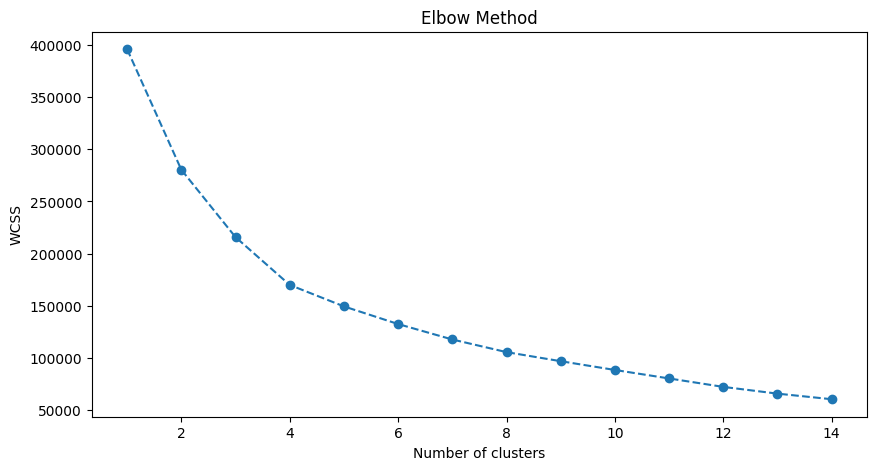

In [95]:
from sklearn.cluster import KMeans

# Determine the optimal number of clusters using the Elbow method
wcss = []  # Within-cluster sum of squares
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=10, random_state=42)
    kmeans.fit(bank_df_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow method
plt.figure(figsize=(10,5))
plt.plot(range(1, 15), wcss, marker='o', linestyle='--')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()


In [96]:
optimal_clusters = 5
kmeans = KMeans(n_clusters=optimal_clusters, init='k-means++', n_init=10, random_state=42)
bank_df['Cluster'] = kmeans.fit_predict(bank_df_scaled)


In [97]:
bank_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 30470 entries, 70 to 356303
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Total Amount Transacted       30470 non-null  float64
 1   Log Total Amount Transacted   30470 non-null  float64
 2   Total Number of Transactions  30470 non-null  int64  
 3   Total Amount Received         30470 non-null  float64
 4   Log Total Amount Received     30470 non-null  float64
 5   Total Amount Sent             30470 non-null  float64
 6   Log Total Amount Sent         30470 non-null  float64
 7   Degree                        30470 non-null  int64  
 8   Weighted Degree               30470 non-null  float64
 9   IsIsolate                     30470 non-null  int64  
 10  Local Clustering Coefficient  30470 non-null  float64
 11  Average Neighbor Degree       30470 non-null  float64
 12  Only Receives                 30470 non-null  int64  
 13  Only

In [98]:
cluster_sizes = bank_df['Cluster'].value_counts().sort_index()
print(cluster_sizes)


Cluster
0     4734
1    13966
2    10357
3     1400
4       13
Name: count, dtype: int64


In [99]:
centroids = pd.DataFrame(scaler.inverse_transform(kmeans.cluster_centers_), columns=bank_df.columns[:-1])
print(centroids)


   Total Amount Transacted  Log Total Amount Transacted  \
0             1.338926e+04                     5.959671   
1             2.067560e+06                    11.159198   
2             3.094716e+04                     7.875697   
3             1.823327e+10                    21.191112   
4             1.302094e+12                    27.851835   

   Total Number of Transactions  Total Amount Received  \
0                      1.516477           1.399024e-01   
1                     15.214593           1.564480e+06   
2                      7.122912           1.752704e-01   
3                   4272.432857           1.041293e+10   
4                  42765.384615           7.238482e+11   

   Log Total Amount Received  Total Amount Sent  Log Total Amount Sent  \
0                   0.059718       1.338912e+04               5.932321   
1                  10.170501       5.030800e+05              10.548976   
2                   0.006739       3.094699e+04               7.875235   


In [100]:
cluster_summary = bank_df.groupby('Cluster').agg(['mean', 'median', 'std'])
print(cluster_summary)


        Total Amount Transacted                              \
                           mean        median           std   
Cluster                                                       
0                  1.338926e+04  4.252900e+02  1.306210e+05   
1                  2.067560e+06  6.191001e+04  3.741879e+07   
2                  3.094716e+04  2.199590e+03  1.615862e+05   
3                  1.823327e+10  1.258571e+09  6.192938e+10   
4                  1.302094e+12  1.279204e+12  3.829059e+11   

        Log Total Amount Transacted                       \
                               mean     median       std   
Cluster                                                    
0                          5.959671   6.055120  2.637717   
1                         11.159198  11.033453  2.201170   
2                          7.875697   7.696481  2.255844   
3                         21.191112  20.953243  2.102576   
4                         27.851835  27.877259  0.313622   

        Total 

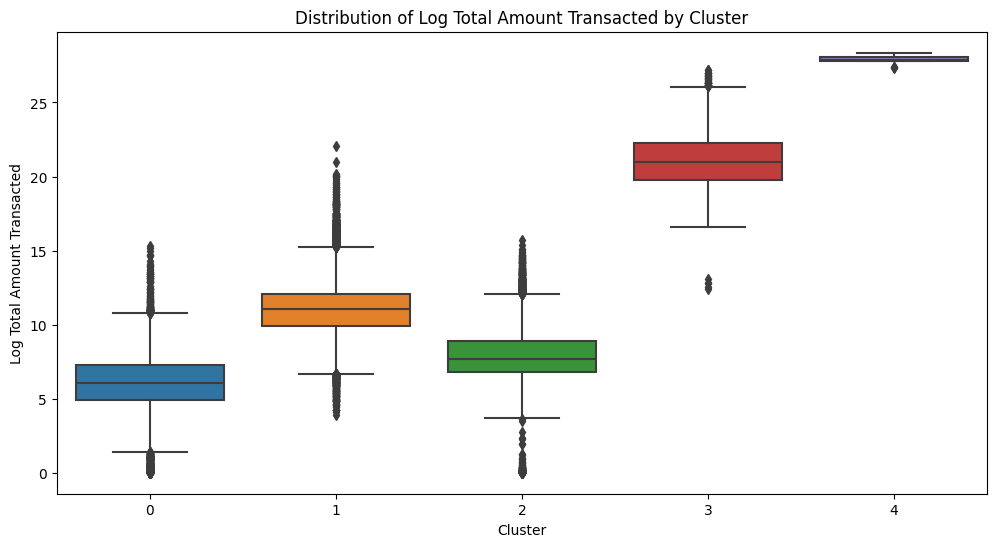

In [101]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Cluster', y='Log Total Amount Transacted', data=bank_df)
plt.title('Distribution of Log Total Amount Transacted by Cluster')
plt.show()


**Cluster Insights**:

**Cluster 0 (4,734 banks)**:
This cluster represents smaller banks or entities they transact a very small amount on average. Primarily sends transactions (about 91.5%) and has the lowest average degree, indicating very limited connections.
Very low local clustering coefficient, suggesting that its neighbors are not strongly interconnected.

**Cluster 1 (13,966 banks)**:
Cluster 1 represents banks that have a moderate transaction amount, it has both sending and receiving transactions but has limited connections with other banks.
It has a moderate local clustering coefficient, indicating some interconnectivity among neighbors.

**Cluster 2 (10,357 banks)**:
This cluster represents banks that primarily send transactions and have a small transaction amount it is more interconnected with its neighbors than Cluster 0, as indicated by a high local clustering coefficient.
It has a higher average degree than Cluster 0, but still displays limited connections.

**Cluster 3 (1,400 banks)**:
CLuster 3 represents major banks or financial institutions, they transact a very high amount on average and has a very high number of transactions. Does both sending and receiving transactions in a large scale.
Its high average degree indicates many connections with other banks. Moderate local clustering coefficient.

**Cluster 4 (13 banks)**:
Cluster 4 represents extremely significant financial entities, possibly central banks or major international banks. This cluster transacts an extremely high amount, much higher than other clusters and has an extremely high number of transactions. Primarily both sends and receives transactions. A very high average degree, indicating a vast number of connections and a moderate local clustering coefficient.

**Risk Insights:**

Cluster 0 represents smaller entities with limited connections and primarily sending transactions. Their low connectivity and the very small amounts they transact make them the least risky in this context. However, their primary sending nature should still be monitored for patterns that might indicate money laundering.

Cluster 1 represents banks with a balanced nature of transactions (both sending and receiving) that might indicate regular banking activities. Given the moderate transaction amounts and their number, they still need to be monitored.

Cluster 2 primarily sends transactions. The one-sided nature of their transactions (mostly sending) could be a red flag. While the transaction amounts are smaller than Clusters 4 and 3, the sheer number of banks in this cluster means that cumulatively, they could still pose a significant risk.

Cluster 3 represents major banks that transact very high amounts and have many connections with other banks. Their high activity and connectivity make them susceptible to money laundering risks.

Cluster 4 is intriguing. It consists of only 13 banks, but they transact an extremely high amount and have a vast number of connections. These could be central banks, major international banks, or other significant financial entities. The sheer volume and value of transactions could provide ample opportunities for money laundering, especially if proper controls aren't in place.

Based on these insights, ordinal encoding will be done for the bank clusters

In [102]:
bank_df.head()

,Total Amount Transacted,Log Total Amount Transacted,Total Number of Transactions,Total Amount Received,Log Total Amount Received,Total Amount Sent,Log Total Amount Sent,Degree,Weighted Degree,IsIsolate,Local Clustering Coefficient,Average Neighbor Degree,Only Receives,Only Sends,Both Sends and Receives,Cluster
70,7.625385e+11,27.359919,321687,1.311383e+07,16.389178,7.625254e+11,27.359902,3050,0.008970,0,0.018836,98.074556,0,0,1,4
20,4.152699e+10,24.449610,41894,1.792666e+10,23.609555,2.360033e+10,23.884527,1023,0.023900,0,0.140082,149.151376,0,0,1,3
1,2.311026e+11,26.166128,61573,1.037749e+11,25.365490,1.273277e+11,25.570030,1429,0.018311,0,0.132440,165.237705,0,0,1,3
10,2.618903e+11,26.291192,82320,9.250881e+10,25.250570,1.693815e+11,25.855419,1721,0.015277,0,0.098250,154.128205,0,0,1,3
12,4.379034e+11,26.805264,81778,1.847796e+11,25.942430,2.531238e+11,26.257145,2004,0.013376,0,0.085913,155.535673,0,0,1,3


In [103]:
# 1. Map cluster numbers to train_df and test_df
train_df['From Bank Cluster'] = train_df['From Bank'].map(bank_df['Cluster'])
train_df['To Bank Cluster'] = train_df['To Bank'].map(bank_df['Cluster'])

test_df['From Bank Cluster'] = test_df['From Bank'].map(bank_df['Cluster'])
test_df['To Bank Cluster'] = test_df['To Bank'].map(bank_df['Cluster'])

# 2. Ordinally encoding the cluster numbers based on the riskiness order
# The  order based on riskiness is: Cluster 4, Cluster 3, Cluster 2, Cluster 1, Cluster 0
cluster_order = [4, 3, 2, 1, 0]

# Creating a dictionary for ordinal encoding
ordinal_map = {cluster: i for i, cluster in enumerate(cluster_order)}

# Applying ordinal encoding
train_df['From Bank Cluster'] = train_df['From Bank Cluster'].map(ordinal_map)
train_df['To Bank Cluster'] = train_df['To Bank Cluster'].map(ordinal_map)

test_df['From Bank Cluster'] = test_df['From Bank Cluster'].map(ordinal_map)
test_df['To Bank Cluster'] = test_df['To Bank Cluster'].map(ordinal_map)

# 3. Handling potential NaN values
# Replace NaN values in the cluster columns with the most frequent cluster from train_df
most_frequent_cluster = train_df['From Bank Cluster'].mode()[0]

train_df['From Bank Cluster'].fillna(most_frequent_cluster, inplace=True)
train_df['To Bank Cluster'].fillna(most_frequent_cluster, inplace=True)

test_df['From Bank Cluster'].fillna(most_frequent_cluster, inplace=True)
test_df['To Bank Cluster'].fillna(most_frequent_cluster, inplace=True)

# Checking for null values in train_df and test_df
print(f"Number of null values in 'From Bank Cluster' column of train_df: {train_df['From Bank Cluster'].isnull().sum()}")
print(f"Number of null values in 'To Bank Cluster' column of train_df: {train_df['To Bank Cluster'].isnull().sum()}")

print(f"Number of null values in 'From Bank Cluster' column of test_df: {test_df['From Bank Cluster'].isnull().sum()}")
print(f"Number of null values in 'To Bank Cluster' column of test_df: {test_df['To Bank Cluster'].isnull().sum()}")


Number of null values in 'From Bank Cluster' column of train_df: 0
Number of null values in 'To Bank Cluster' column of train_df: 0
Number of null values in 'From Bank Cluster' column of test_df: 0
Number of null values in 'To Bank Cluster' column of test_df: 0


In [104]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 66 columns):
 #   Column                         Dtype         
---  ------                         -----         
 0   level_0                        int64         
 1   index                          int64         
 2   Timestamp                      datetime64[ns]
 3   From Bank                      category      
 4   Account                        string        
 5   To Bank                        category      
 6   To_Account                     string        
 7   Amount Received                float64       
 8   Receiving Currency             float64       
 9   Amount Paid                    float64       
 10  Payment Currency               float64       
 11  Payment Format                 float64       
 12  Is Laundering                  int64         
 13  Hour                           int32         
 14  log Amount Received            float64       
 15  log Amount Paid     

In [105]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 66 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   level_0                        863889 non-null  int64         
 1   index                          863889 non-null  int64         
 2   Timestamp                      863889 non-null  datetime64[ns]
 3   From Bank                      863889 non-null  category      
 4   Account                        863889 non-null  string        
 5   To Bank                        863889 non-null  category      
 6   To_Account                     863889 non-null  string        
 7   Amount Received                863889 non-null  float64       
 8   Receiving Currency             863889 non-null  float64       
 9   Amount Paid                    863889 non-null  float64       
 10  Payment Currency               863889 non-null  float64       
 11  Payme

In [106]:
# Create a copy of train_df
correlation_df = train_df.copy()

#Non numerical and binary features are being exlcuded befor performing correlation analysis

# List of features to exclude
exclude_features = [
    'level_0', 'index', 'From Bank', 'Account', 'To Bank', 
    'To_Account', 'Amount Received', 'Amount Paid', 'Is Laundering', 
    'Hour',  'Near_10K_Threshold', 'Same_Currency',  'IsIsolate',
    'many_unique_banks', 'NearThreshold', 'large_outgoing', 
    'high_foreign_transactions', 'high_incoming_outgoing_ratio', 
    'high_amount_discrepancy', 'AvgAmountReceived_14days',
    'Round_Ten_Thousands','foreign_currency_transactions'  
]

# Exclude the features from the correlation_df if they exist
for feature in exclude_features:
    if feature in correlation_df.columns:
        correlation_df.drop(columns=feature, inplace=True)

# Compute the correlation matrix
correlation_matrix = correlation_df.corr()


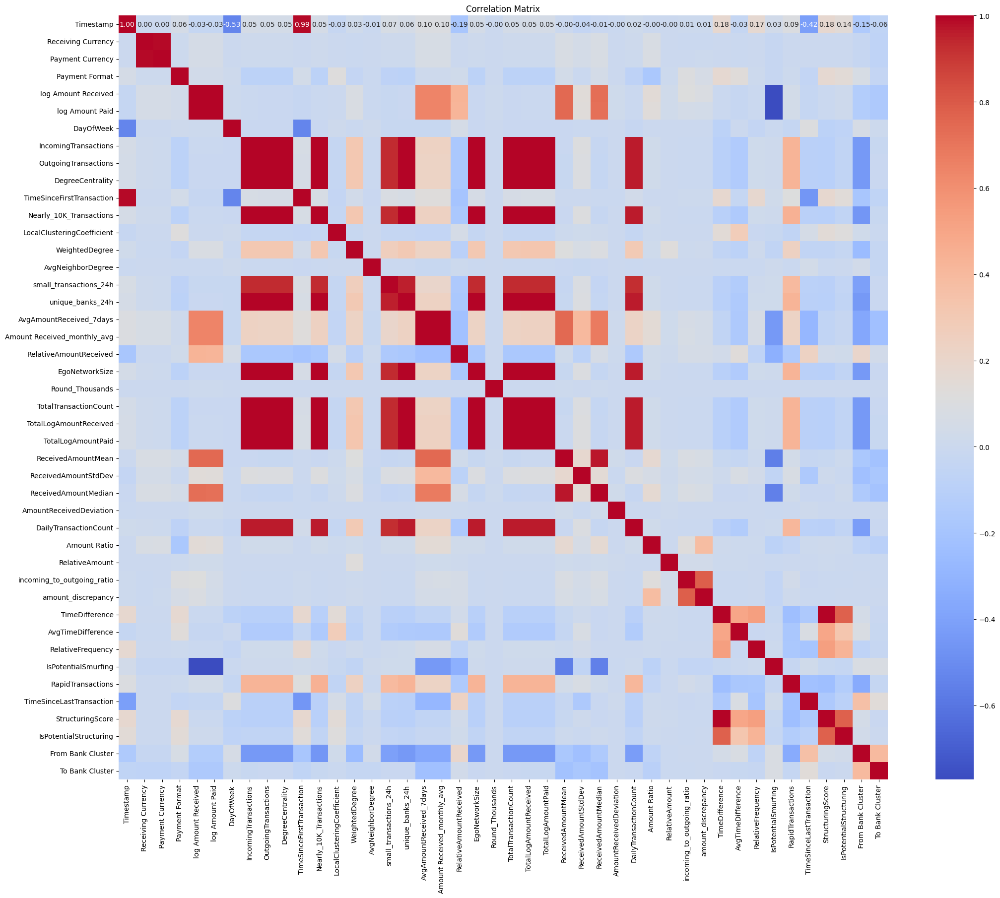

In [108]:
#Plotting a correlation heatmap
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.title("Correlation Matrix")
plt.show()


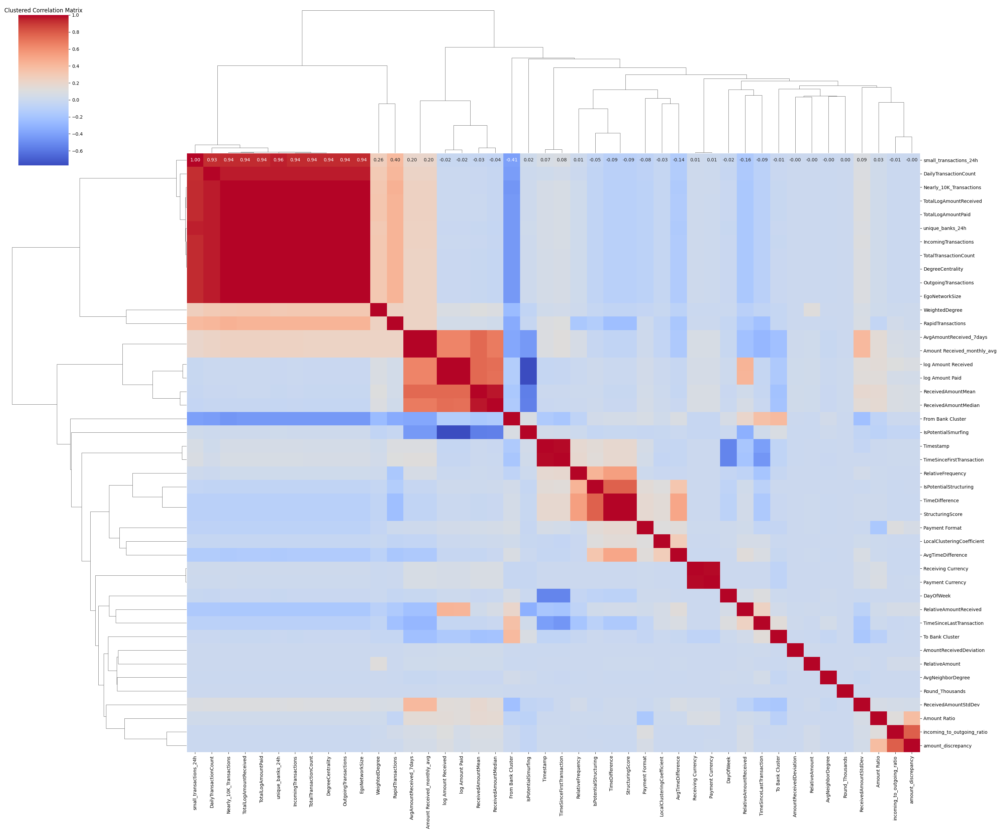

In [107]:
#Clustered correlation

sns.clustermap(correlation_matrix, cmap='coolwarm', annot=True, figsize=(30, 25), fmt=".2f", annot_kws={"size": 10})
plt.title("Clustered Correlation Matrix")
plt.show()


In [109]:
# Extracting pairs above threshold to take an informed decision
threshold = 0.75
high_corr_var = np.where(correlation_matrix.abs() > threshold)

# Get pairs excluding self-correlation (identity)
high_corr_var = [(correlation_matrix.columns[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

# Display pairs
for pair in high_corr_var:
    print(pair)


('Timestamp', 'TimeSinceFirstTransaction')
('Receiving Currency', 'Payment Currency')
('log Amount Received', 'log Amount Paid')
('log Amount Received', 'IsPotentialSmurfing')
('log Amount Paid', 'IsPotentialSmurfing')
('IncomingTransactions', 'OutgoingTransactions')
('IncomingTransactions', 'DegreeCentrality')
('IncomingTransactions', 'Nearly_10K_Transactions')
('IncomingTransactions', 'small_transactions_24h')
('IncomingTransactions', 'unique_banks_24h')
('IncomingTransactions', 'EgoNetworkSize')
('IncomingTransactions', 'TotalTransactionCount')
('IncomingTransactions', 'TotalLogAmountReceived')
('IncomingTransactions', 'TotalLogAmountPaid')
('IncomingTransactions', 'DailyTransactionCount')
('OutgoingTransactions', 'DegreeCentrality')
('OutgoingTransactions', 'Nearly_10K_Transactions')
('OutgoingTransactions', 'small_transactions_24h')
('OutgoingTransactions', 'unique_banks_24h')
('OutgoingTransactions', 'EgoNetworkSize')
('OutgoingTransactions', 'TotalTransactionCount')
('OutgoingTr

In [110]:
correlation_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 44 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   Timestamp                    datetime64[ns]
 1   Receiving Currency           float64       
 2   Payment Currency             float64       
 3   Payment Format               float64       
 4   log Amount Received          float64       
 5   log Amount Paid              float64       
 6   DayOfWeek                    int32         
 7   IncomingTransactions         int64         
 8   OutgoingTransactions         int64         
 9   DegreeCentrality             float64       
 10  TimeSinceFirstTransaction    float64       
 11  Nearly_10K_Transactions      int64         
 12  LocalClusteringCoefficient   float64       
 13  WeightedDegree               float64       
 14  AvgNeighborDegree            float64       
 15  small_transactions_24h       float64       
 16  uniqu

In [111]:
# Excluding highly correlated features to observe effect on the heatmap

# List of features to exclude
features_to_exclude = [
    "IsPotentialStructuring",
    "AvgAmountReceived_14days",
    "Amount Received_monthly_avg",
    "IncomingTransactions",
    "OutgoingTransactions",
    "DegreeCentrality",
    'AvgAmountPaid_14days',
    'Receiving Currency',
    'log Amount Paid',
    'ReceivedAmountMean'
]

# Exclude the features from correlation_df
correlation_df = correlation_df.drop(columns=features_to_exclude, errors='ignore')
correlation_df = correlation_df.drop(index=features_to_exclude, errors='ignore')


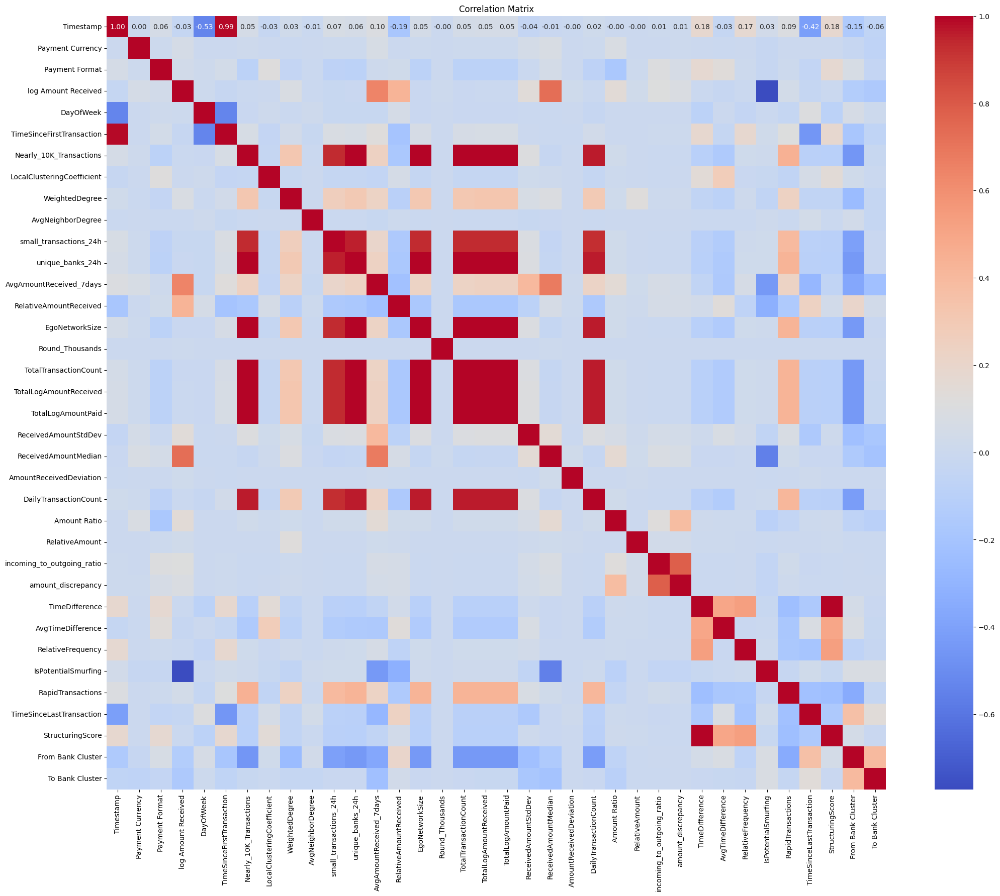

In [112]:
# Compute the correlation matrix
correlation_matrix = correlation_df.corr()

plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, fmt=".2f")
plt.title("Correlation Matrix")
plt.show()


In [113]:
# Extracting pairs above threshold
threshold = 0.75
high_corr_var = np.where(correlation_matrix.abs() > threshold)

# Get pairs excluding self-correlation (identity)
high_corr_var = [(correlation_matrix.columns[x], correlation_matrix.columns[y]) for x, y in zip(*high_corr_var) if x != y and x < y]

# Display pairs
for pair in high_corr_var:
    print(pair)


('Timestamp', 'TimeSinceFirstTransaction')
('log Amount Received', 'IsPotentialSmurfing')
('Nearly_10K_Transactions', 'small_transactions_24h')
('Nearly_10K_Transactions', 'unique_banks_24h')
('Nearly_10K_Transactions', 'EgoNetworkSize')
('Nearly_10K_Transactions', 'TotalTransactionCount')
('Nearly_10K_Transactions', 'TotalLogAmountReceived')
('Nearly_10K_Transactions', 'TotalLogAmountPaid')
('Nearly_10K_Transactions', 'DailyTransactionCount')
('small_transactions_24h', 'unique_banks_24h')
('small_transactions_24h', 'EgoNetworkSize')
('small_transactions_24h', 'TotalTransactionCount')
('small_transactions_24h', 'TotalLogAmountReceived')
('small_transactions_24h', 'TotalLogAmountPaid')
('small_transactions_24h', 'DailyTransactionCount')
('unique_banks_24h', 'EgoNetworkSize')
('unique_banks_24h', 'TotalTransactionCount')
('unique_banks_24h', 'TotalLogAmountReceived')
('unique_banks_24h', 'TotalLogAmountPaid')
('unique_banks_24h', 'DailyTransactionCount')
('EgoNetworkSize', 'TotalTransact

In [114]:
#Excluding unnecessary redundant features, and also exlcuding features causing multicolinearity

exclude_features = [
    'level_0', 'index', 'Hour',  'Near_10K_Threshold', 'Same_Currency', 
    'many_unique_banks', 'NearThreshold', 'large_outgoing', 
    'high_foreign_transactions', 'high_incoming_outgoing_ratio', 
    'high_amount_discrepancy', 'AvgAmountReceived_14days',
    'Round_Ten_Thousands','foreign_currency_transactions'  
]

# Drop the specified columns from train_df, val_df, and test_df
train_df = train_df.drop(columns=exclude_features, errors='ignore')
test_df = test_df.drop(columns=exclude_features, errors='ignore')


In [115]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 52 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   Timestamp                    863889 non-null  datetime64[ns]
 1   From Bank                    863889 non-null  category      
 2   Account                      863889 non-null  string        
 3   To Bank                      863889 non-null  category      
 4   To_Account                   863889 non-null  string        
 5   Amount Received              863889 non-null  float64       
 6   Receiving Currency           863889 non-null  float64       
 7   Amount Paid                  863889 non-null  float64       
 8   Payment Currency             863889 non-null  float64       
 9   Payment Format               863889 non-null  float64       
 10  Is Laundering                863889 non-null  category      
 11  log Amount Received          86

In [116]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 52 columns):
 #   Column                       Dtype         
---  ------                       -----         
 0   Timestamp                    datetime64[ns]
 1   From Bank                    category      
 2   Account                      string        
 3   To Bank                      category      
 4   To_Account                   string        
 5   Amount Received              float64       
 6   Receiving Currency           float64       
 7   Amount Paid                  float64       
 8   Payment Currency             float64       
 9   Payment Format               float64       
 10  Is Laundering                int64         
 11  log Amount Received          float64       
 12  log Amount Paid              float64       
 13  DayOfWeek                    int32         
 14  IncomingTransactions         int64         
 15  OutgoingTransactions         int64         
 16  Degre

In [117]:
#Creating a dataframe where the minority class is upsampled

from sklearn.utils import resample

# Counting the number of instances for each class before resampling
print("Before resampling:")
print(train_df['Is Laundering'].value_counts())

# Separate the majority and minority classes
df_majority = train_df[train_df['Is Laundering'] == 0]
df_minority = train_df[train_df['Is Laundering'] == 1]

# Upsampling the minority class by a factor of 10 
upsample_factor = 10
df_minority_upsampled = resample(df_minority, 
                                 replace=True,     # Sample with replacement
                                 n_samples=upsample_factor*len(df_minority),    # Upsample by the factor
                                 random_state=42)  # Reproducible results

# Combining the upsampled minority class with the original majority class
df_resampled = pd.concat([df_majority, df_minority_upsampled])

# Shuffle the dataset
df_resampled = df_resampled.sample(frac=1, random_state=42).reset_index(drop=True)

# Count the number of instances for each class after resampling
print("\nAfter resampling:")
print(df_resampled['Is Laundering'].value_counts())


Before resampling:
Is Laundering
0    3729462
1       3027
Name: count, dtype: int64

After resampling:
Is Laundering
0    3729462
1      30270
Name: count, dtype: int64


In [119]:
#Creating a random sample with 1:1 ratio, by downsampling the majority class

from sklearn.utils import resample

# Separate the majority and minority classes
df_majority = train_df[train_df['Is Laundering'] == 0]
df_minority = train_df[train_df['Is Laundering'] == 1]

# Downsample the majority class or upsample the minority class
min_count = min(len(df_majority), len(df_minority))

df_majority_resampled = resample(df_majority, 
                                 replace=False,    # Sample without replacement
                                 n_samples=min_count, 
                                 random_state=42)

df_minority_resampled = resample(df_minority, 
                                 replace=True,     # Sample with replacement
                                 n_samples=min_count, 
                                 random_state=42)

# Combine the resampled majority and minority classes
df_1_to_1 = pd.concat([df_majority_resampled, df_minority_resampled])

# Shuffle the dataset
df_1_to_1 = df_1_to_1.sample(frac=1, random_state=42).reset_index(drop=True)

print("\n1:1 Ratio Resampling:")
print(df_1_to_1['Is Laundering'].value_counts())



1:1 Ratio Resampling:
Is Laundering
1    3027
0    3027
Name: count, dtype: int64


In [120]:
# Downsample the majority class to 10 times the count of the minority class
df_majority_resampled_10_to_1 = resample(df_majority, 
                                         replace=False,    # Sample without replacement
                                         n_samples=10*len(df_minority), 
                                         random_state=42)

# Combine the downsampled majority class with the original minority class
df_10_to_1 = pd.concat([df_majority_resampled_10_to_1, df_minority])

# Shuffle the dataset
df_10_to_1 = df_10_to_1.sample(frac=1, random_state=42).reset_index(drop=True)

print("\n10:1 Ratio Resampling:")
print(df_10_to_1['Is Laundering'].value_counts())



10:1 Ratio Resampling:
Is Laundering
0    30270
1     3027
Name: count, dtype: int64


In [121]:
# Downsample the majority class to 20 times the count of the minority class
df_majority_resampled_20_to_1 = resample(df_majority, 
                                         replace=False,    # Sample without replacement
                                         n_samples=20*len(df_minority), 
                                         random_state=42)

# Combine the downsampled majority class with the original minority class
df_20_to_1 = pd.concat([df_majority_resampled_20_to_1, df_minority])

# Shuffle the dataset
df_20_to_1 = df_20_to_1.sample(frac=1, random_state=42).reset_index(drop=True)

print("\n20:1 Ratio Resampling:")
print(df_20_to_1['Is Laundering'].value_counts())



20:1 Ratio Resampling:
Is Laundering
0    60540
1     3027
Name: count, dtype: int64


In [122]:
# Downsample the majority class to 30 times the count of the minority class
df_majority_resampled_30_to_1 = resample(df_majority, 
                                         replace=False,    # Sample without replacement
                                         n_samples=30*len(df_minority), 
                                         random_state=42)

# Combine the downsampled majority class with the original minority class
df_30_to_1 = pd.concat([df_majority_resampled_30_to_1, df_minority])

# Shuffle the dataset
df_30_to_1 = df_30_to_1.sample(frac=1, random_state=42).reset_index(drop=True)

print("\n30:1 Ratio Resampling:")
print(df_30_to_1['Is Laundering'].value_counts())



30:1 Ratio Resampling:
Is Laundering
0    90810
1     3027
Name: count, dtype: int64


In [123]:
import numpy as np

def feature_engineering(df):
    # Extract day of the week from Timestamp and map to numbers
    df['TempDay'] = df['Timestamp'].dt.dayofweek

    # Create the sin_day and cos_day columns using TempDay
    df['sin_day'] = np.sin(2 * np.pi * df['TempDay'] / 7)
    df['cos_day'] = np.cos(2 * np.pi * df['TempDay'] / 7)

    # Drop the TempDay column as it's no longer needed
    df.drop('TempDay', axis=1, inplace=True)

    # Extract the hour from the Timestamp column
    df['Hour'] = df['Timestamp'].dt.hour

    # Apply the sine and cosine transformations to the 'Hour' column
    df['sin_time'] = np.sin(2 * np.pi * df['Hour'] / 24)
    df['cos_time'] = np.cos(2 * np.pi * df['Hour'] / 24)

    # Drop the original 'Hour' and 'Timestamp' columns
    df.drop(['Hour', 'Timestamp'], axis=1, inplace=True)

    # Convert integer columns representing categorical data to 'category'
    int_categorical_cols = ['IsPotentialSmurfing']
    for col in int_categorical_cols:
        df[col] = df[col].astype('category')

    # Ensure that string columns representing categorical data are converted to 'category'
    string_cols = ['Account', 'To_Account']
    for col in string_cols:
        df[col] = df[col].astype('category')
    
    return df

# Apply feature engineering to the dataframes
train_df = feature_engineering(train_df)
test_df = feature_engineering(test_df)
df_resampled=feature_engineering(df_resampled)
df_1_to_1 = feature_engineering(df_1_to_1)
df_10_to_1 = feature_engineering(df_10_to_1)
df_20_to_1 = feature_engineering(df_20_to_1)
df_30_to_1 = feature_engineering(df_30_to_1)


In [124]:
# Splitting train_df into X_train and y_train
y_train = train_df['Is Laundering'].copy()
X_train = train_df.drop(columns=['Is Laundering'])


In [125]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 54 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    category
 1   Account                      category
 2   To Bank                      category
 3   To_Account                   category
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   log Amount Received          float64 
 10  log Amount Paid              float64 
 11  DayOfWeek                    int32   
 12  IncomingTransactions         int64   
 13  OutgoingTransactions         int64   
 14  DegreeCentrality             float64 
 15  TimeSinceFirstTransaction    float64 
 16  Nearly_10K_Transactions      int64   
 17  LocalClusteringCoefficient   float64 
 18  WeightedDegree             

In [126]:
X_train.head()

,From Bank,Account,To Bank,To_Account,Amount Received,Receiving Currency,Amount Paid,Payment Currency,Payment Format,log Amount Received,log Amount Paid,DayOfWeek,IncomingTransactions,OutgoingTransactions,DegreeCentrality,TimeSinceFirstTransaction,Nearly_10K_Transactions,LocalClusteringCoefficient,WeightedDegree,AvgNeighborDegree,IsIsolate,small_transactions_24h,unique_banks_24h,AvgAmountReceived_7days,Amount Received_monthly_avg,RelativeAmountReceived,EgoNetworkSize,Round_Thousands,TotalTransactionCount,TotalLogAmountReceived,TotalLogAmountPaid,ReceivedAmountMean,ReceivedAmountStdDev,ReceivedAmountMedian,AmountReceivedDeviation,DailyTransactionCount,Amount Ratio,RelativeAmount,incoming_to_outgoing_ratio,amount_discrepancy,TimeDifference,AvgTimeDifference,RelativeFrequency,IsPotentialSmurfing,RapidTransactions,TimeSinceLastTransaction,StructuringScore,IsPotentialStructuring,From Bank Cluster,To Bank Cluster,sin_day,cos_day,sin_time,cos_time
0,70,100428660,10,8006493B0,1064.04,0.000805,1064.04,0.000798,0.000177,6.970768,6.970768,3,545,14230,0.028685,0.0,3311,0.000008,1.151584e+10,2.269501,False,1.0,1.0,6.970768,13.632265,0.001277,14231,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,397.870377,22801,0.693147,4.431657e-11,0.693147,0.0,0.0,5.038446,0.0,0,0,22004.670465,1.386294,0,0,1,0.433884,-0.900969,0.0,1.0
1,70,100428660,23885,805DEB4F0,53574.59,0.000805,53574.59,0.000798,0.000177,10.888849,10.888849,3,545,14230,0.028685,0.0,3311,0.000008,1.151584e+10,2.269501,False,7.0,22.0,13.599985,13.632265,0.062363,14231,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,20167.345152,22801,0.693147,2.231347e-09,0.693147,0.0,0.0,5.038446,0.0,0,1,0.000000,1.386294,0,0,1,0.433884,-0.900969,0.0,1.0
2,70,100428660,12719,8062E2550,12346.28,0.000805,12346.28,0.000798,0.000177,9.421191,9.421191,3,545,14230,0.028685,0.0,3311,0.000008,1.151584e+10,2.269501,False,7.0,23.0,13.561377,13.632265,0.014720,14231,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,4645.473175,22801,0.693147,5.142145e-10,0.693147,0.0,0.0,5.038446,0.0,0,1,0.000000,1.386294,0,0,1,0.433884,-0.900969,0.0,1.0
3,70,100428660,211075,806844C00,4408.45,0.000805,4408.45,0.000798,0.000224,8.391505,8.391505,3,545,14230,0.028685,0.0,3311,0.000008,1.151584e+10,2.269501,False,7.0,24.0,13.523855,13.632265,0.005281,14231,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,1656.993146,22801,0.693147,1.836091e-10,0.693147,0.0,0.0,5.038446,0.0,0,1,0.000000,1.386294,0,0,1,0.433884,-0.900969,0.0,1.0
4,70,100428660,11318,80685C400,5246.84,0.000805,5246.84,0.000798,0.000160,8.565572,8.565572,3,545,14230,0.028685,0.0,3311,0.000008,1.151584e+10,2.269501,False,7.0,25.0,13.487747,13.632265,0.006282,14231,0,120038,869006.013964,869006.013964,7.239424,2.656143,6.996764,1972.635050,22801,0.693147,2.185275e-10,0.693147,0.0,0.0,5.038446,0.0,0,1,0.000000,1.386294,0,0,1,0.433884,-0.900969,0.0,1.0


In [127]:
y_train.info()

<class 'pandas.core.series.Series'>
Index: 3732489 entries, 0 to 3732488
Series name: Is Laundering
Non-Null Count    Dtype
--------------    -----
3732489 non-null  int64
dtypes: int64(1)
memory usage: 186.0 MB


In [128]:
import pandas as pd

# Set the display option to show all columns
pd.set_option('display.max_rows', None)

# Now print the null counts for all columns
print(test_df.isnull().sum())


From Bank                      0
Account                        0
To Bank                        0
To_Account                     0
Amount Received                0
Receiving Currency             0
Amount Paid                    0
Payment Currency               0
Payment Format                 0
Is Laundering                  0
log Amount Received            0
log Amount Paid                0
DayOfWeek                      0
IncomingTransactions           0
OutgoingTransactions           0
DegreeCentrality               0
TimeSinceFirstTransaction      0
Nearly_10K_Transactions        0
LocalClusteringCoefficient     0
WeightedDegree                 0
AvgNeighborDegree              0
IsIsolate                      0
small_transactions_24h         0
unique_banks_24h               0
AvgAmountReceived_7days        0
Amount Received_monthly_avg    0
RelativeAmountReceived         0
EgoNetworkSize                 0
Round_Thousands                0
TotalTransactionCount          0
TotalLogAm

In [129]:
# Convert 'IsPotentialSmurfing' to category type
if 'IsPotentialSmurfing' in X_train.columns:
    X_train['IsPotentialSmurfing'] = X_train['IsPotentialSmurfing'].astype('category')

if 'IsPotentialSmurfing' in test_df.columns:
    test_df['IsPotentialSmurfing'] = test_df['IsPotentialSmurfing'].astype('category')

# Drop the 'index' column if it exists
for df in [X_train, test_df]:
    if 'index' in df.columns:
        df.drop('index', axis=1, inplace=True)

# Align the datasets with the training dataset
test_df, _ = test_df.align(X_train, axis=1, fill_value=0)

y_test = test_df['Is Laundering'].copy()
X_test = test_df.drop(columns=['Is Laundering'])


In [130]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 54 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   Account                      863889 non-null  category
 1   Amount Paid                  863889 non-null  float64 
 2   Amount Ratio                 863889 non-null  float64 
 3   Amount Received              863889 non-null  float64 
 4   Amount Received_monthly_avg  863889 non-null  float64 
 5   AmountReceivedDeviation      863889 non-null  float64 
 6   AvgAmountReceived_7days      863889 non-null  float64 
 7   AvgNeighborDegree            863889 non-null  float64 
 8   AvgTimeDifference            863889 non-null  float64 
 9   DailyTransactionCount        863889 non-null  int64   
 10  DayOfWeek                    863889 non-null  int32   
 11  DegreeCentrality             863889 non-null  float64 
 12  EgoNetworkSize               863889 non-null  int

In [138]:
# Checking if all datasets have the same columns
datasets = {'X_train': X_train,  'X_test': X_test}
all_equal = all(set(X_train.columns) == set(dataset.columns) for dataset in datasets.values())

if all_equal:
    print("All datasets have the same columns.")
else:
    for name, dataset in datasets.items():
        if set(X_train.columns) != set(dataset.columns):
            print(f"Columns in X_train but not in {name}:", set(X_train.columns) - set(dataset.columns))
            print(f"Columns in {name} but not in X_train:", set(dataset.columns) - set(X_train.columns))


All datasets have the same columns.


In [139]:
X_test = X_test[X_train.columns]


In [141]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 54 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    category
 1   Account                      category
 2   To Bank                      category
 3   To_Account                   category
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   log Amount Received          float64 
 10  log Amount Paid              float64 
 11  DayOfWeek                    int32   
 12  IncomingTransactions         int64   
 13  OutgoingTransactions         int64   
 14  DegreeCentrality             float64 
 15  TimeSinceFirstTransaction    float64 
 16  Nearly_10K_Transactions      int64   
 17  LocalClusteringCoefficient   float64 
 18  WeightedDegree             

In [142]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 54 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   From Bank                    863889 non-null  category
 1   Account                      863889 non-null  category
 2   To Bank                      863889 non-null  category
 3   To_Account                   863889 non-null  category
 4   Amount Received              863889 non-null  float64 
 5   Receiving Currency           863889 non-null  float64 
 6   Amount Paid                  863889 non-null  float64 
 7   Payment Currency             863889 non-null  float64 
 8   Payment Format               863889 non-null  float64 
 9   log Amount Received          863889 non-null  float64 
 10  log Amount Paid              863889 non-null  float64 
 11  DayOfWeek                    863889 non-null  int32   
 12  IncomingTransactions         863889 non-null  int

In [143]:
datasets = {'X_train': X_train, 'X_test': X_test}

all_match = True
for name, dataset in datasets.items():
    if not X_train.dtypes.equals(dataset.dtypes):
        print(f"There are discrepancies in data types between X_train and {name}.")
        all_match = False

if all_match:
    print("Data types of all columns in all datasets match!")


There are discrepancies in data types between X_train and X_test.


In [144]:
datasets = {'X_train': X_train, 'X_test': X_test}

for name, dataset in datasets.items():
    print(f"Dataset: {name}")
    
    # Check for NaN values
    nan_cols = dataset.columns[dataset.isna().any()].tolist()
    if nan_cols:
        print(f"Columns with NaN values in {name}: {nan_cols}")
    else:
        print(f"No NaN values in {name}.")
    
    # Check for infinite values in numerical columns
    numerical_cols = dataset.select_dtypes(include=[np.number])
    inf_cols = numerical_cols.columns[np.isinf(numerical_cols).any()].tolist()
    if inf_cols:
        print(f"Columns with infinite values in {name} (numerical columns only): {inf_cols}")
    else:
        print(f"No infinite values in {name} (numerical columns only).")
    
    print("------")


Dataset: X_train
No NaN values in X_train.
No infinite values in X_train (numerical columns only).
------
Dataset: X_test
No NaN values in X_test.
Columns with infinite values in X_test (numerical columns only): ['RelativeFrequency']
------


In [145]:
majority_class = y_train.mode()[0]

for dataset, target in zip([X_test], [y_test]):
    missing_rows = dataset['Account'].isna() | dataset['To_Account'].isna()
    
    # Rows belonging to the majority class
    majority_missing_rows = target[missing_rows] == majority_class
    
    # Remove rows belonging to the majority class
    dataset.drop(majority_missing_rows.index, inplace=True)
    target.drop(majority_missing_rows.index, inplace=True)
    
    # Update the missing_rows after dropping rows
    missing_rows = dataset['Account'].isna() | dataset['To_Account'].isna()
    
    # For the remaining rows, map back to the original dataframe to fill missing values
    for index, row in dataset[missing_rows].iterrows():
        if target.loc[index] != majority_class:
            matched_row = df[
                (df['From Bank'] == row['From Bank']) &
                (df['To Bank'] == row['To Bank']) &
                (df['Amount Received'] == row['Amount Received']) &
                (df['Amount Paid'] == row['Amount Paid'])
            ].iloc[0]

            dataset.at[index, 'Account'] = matched_row['Account']
            dataset.at[index, 'To_Account'] = matched_row['To_Account']


In [146]:
# Replacing infinite values with NaN in the RelativeFrequency column for each dataset
for dataset in [X_train, X_test]:
    dataset['RelativeFrequency'].replace([np.inf, -np.inf], np.nan, inplace=True)

# Imputing NaN values with the mean of the non-infinite values in the RelativeFrequency column
mean_relative_frequency = X_train['RelativeFrequency'].mean()

for dataset in [X_train, X_test]:
    dataset['RelativeFrequency'].fillna(mean_relative_frequency, inplace=True)


In [147]:
datasets = {'X_train': X_train, 'X_test': X_test}

for name, dataset in datasets.items():
    print(f"Dataset: {name}")
    
    # Check for NaN values
    nan_cols = dataset.columns[dataset.isna().any()].tolist()
    if nan_cols:
        print(f"Columns with NaN values in {name}: {nan_cols}")
    else:
        print(f"No NaN values in {name}.")
    
    # Check for infinite values in numerical columns
    numerical_cols = dataset.select_dtypes(include=[np.number])
    inf_cols = numerical_cols.columns[np.isinf(numerical_cols).any()].tolist()
    if inf_cols:
        print(f"Columns with infinite values in {name} (numerical columns only): {inf_cols}")
    else:
        print(f"No infinite values in {name} (numerical columns only).")
    
    print("------")


Dataset: X_train
No NaN values in X_train.
No infinite values in X_train (numerical columns only).
------
Dataset: X_test
No NaN values in X_test.
No infinite values in X_test (numerical columns only).
------


In [148]:
pd.set_option('display.max_columns', None)

## Modelling

Compared seven models: Decision Trees, Random Forest, XGBoost, LightGBM, SGD, and SVM. 
Each was tested on the original data, upsampled data, and multiple downsampling ratios.

Using accuracy as the main metric here would be misleading, a model that predicts every 
transaction as legitimate would be 99.9% accurate and completely useless. Focused on 
precision, recall, and F1 score for the minority class throughout.

In [149]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 54 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   From Bank                    863889 non-null  category
 1   Account                      863889 non-null  category
 2   To Bank                      863889 non-null  category
 3   To_Account                   863889 non-null  category
 4   Amount Received              863889 non-null  float64 
 5   Receiving Currency           863889 non-null  float64 
 6   Amount Paid                  863889 non-null  float64 
 7   Payment Currency             863889 non-null  float64 
 8   Payment Format               863889 non-null  float64 
 9   log Amount Received          863889 non-null  float64 
 10  log Amount Paid              863889 non-null  float64 
 11  DayOfWeek                    863889 non-null  int32   
 12  IncomingTransactions         863889 non-null  int

In [150]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 54 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    category
 1   Account                      category
 2   To Bank                      category
 3   To_Account                   category
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   log Amount Received          float64 
 10  log Amount Paid              float64 
 11  DayOfWeek                    int32   
 12  IncomingTransactions         int64   
 13  OutgoingTransactions         int64   
 14  DegreeCentrality             float64 
 15  TimeSinceFirstTransaction    float64 
 16  Nearly_10K_Transactions      int64   
 17  LocalClusteringCoefficient   float64 
 18  WeightedDegree             

In [152]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, average_precision_score
import seaborn as sns
import matplotlib.pyplot as plt

def displaymetrics(model, X_test, y_test):
    # Predict
    y_test_pred = model.predict(X_test)
    
    # Check if the model provides probability estimates
    try:
        y_test_prob = model.predict_proba(X_test)[:, 1]
        prob_available = True
    except AttributeError:
        prob_available = False

    # Classification Report in a pretty box format
    print("\033[1mClassification Report (Test Set):\033[0m")
    print('-'*80)
    print(classification_report(y_test, y_test_pred))
    print('-'*80)
    
    # Confusion Matrix (Text Format)
    print("\n\033[1mConfusion Matrix (Text Format):\033[0m")
    print(confusion_matrix(y_test, y_test_pred))
    
    # Visualisations
    if prob_available:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    else:
        fig, ax = plt.subplots(1, 1, figsize=(6, 6))
        axes = [ax]
    
    # Confusion Matrix Plot
    sns.heatmap(confusion_matrix(y_test, y_test_pred), annot=True, fmt='g', cmap='Blues', cbar=False, ax=axes[0])
    axes[0].set_xlabel('Predicted labels')
    axes[0].set_ylabel('True labels')
    axes[0].set_title('Confusion Matrix')
    
    if prob_available:
        # ROC Curve
        fpr, tpr, _ = roc_curve(y_test, y_test_prob)
        roc_auc = auc(fpr, tpr)
        axes[1].plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
        axes[1].plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        axes[1].set_xlabel('False Positive Rate')
        axes[1].set_ylabel('True Positive Rate')
        axes[1].set_title('ROC Curve')
        axes[1].legend(loc="lower right")
    
        # Precision-Recall Curve
        precision, recall, _ = precision_recall_curve(y_test, y_test_prob)
        ap_score = average_precision_score(y_test, y_test_prob)
        axes[2].plot(recall, precision, color='b', lw=2, label=f'AP = {ap_score:.2f}')
        axes[2].fill_between(recall, precision, step='post', alpha=0.2, color='b')
        axes[2].set_xlabel('Recall')
        axes[2].set_ylabel('Precision')
        axes[2].set_title('Precision-Recall Curve')
        axes[2].legend(loc='upper right')
    
    plt.tight_layout()
    plt.show()

# Example usage:
# clf = Classifierused
# clf.fit(X_train, y_train)
# displaymetrics(clf, X_test, y_test)


➡ **BASELINE MODEL RUNS**

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.26      0.21      0.23      1603

    accuracy                           1.00    863889
   macro avg       0.63      0.60      0.62    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[861346    940]
 [  1269    334]]


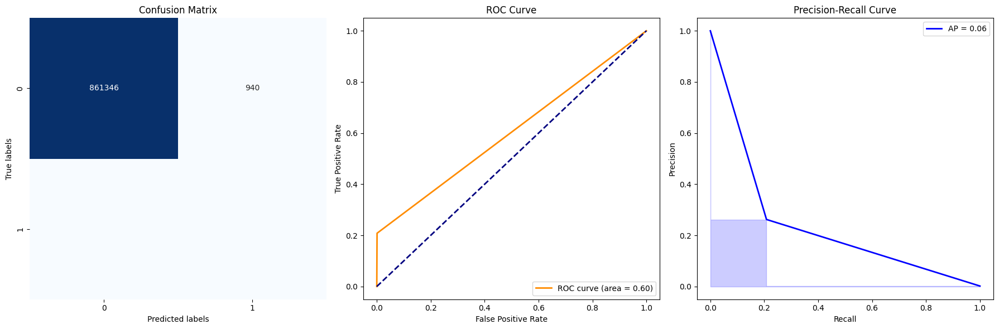

In [156]:
# Dictionary to store results
results = {}

# List of features to exclude
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
X_train = X_train.drop(columns=[col for col in exclude_features if col in X_train.columns])
X_test = X_test.drop(columns=[col for col in exclude_features if col in X_test.columns])

from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score, average_precision_score

# Initialise the Decision Tree classifier with class weights set to 'balanced'
clf = DecisionTreeClassifier(class_weight='balanced', random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Call the displaymetrics function to evaluate and visualize the model's performance
displaymetrics(clf, X_test, y_test)

# Save the results in the dictionary for comparitive analysis 
classifier_name = "DecisionTree"
results[classifier_name] = {
    "precision": precision_score(y_test, clf.predict(X_test)),
    "recall": recall_score(y_test, clf.predict(X_test)),
    "f1_minority": f1_score(y_test, clf.predict(X_test), pos_label=1),
    "roc_auc": roc_auc_score(y_test, clf.predict_proba(X_test)[:, 1]),
    "avg_precision": average_precision_score(y_test, clf.predict_proba(X_test)[:, 1])
}


In [169]:
def store_results(classifier, classifier_name, X_test, y_test, results):
    """Store the results of the classifier in the results dictionary."""
    # Check if the classifier has the predict_proba method
    has_proba = hasattr(classifier, "predict_proba")
    
    results[classifier_name] = {
        "precision": precision_score(y_test, classifier.predict(X_test)),
        "recall": recall_score(y_test, classifier.predict(X_test)),
        "f1_minority": f1_score(y_test, classifier.predict(X_test), pos_label=1),
        "roc_auc": roc_auc_score(y_test, classifier.predict_proba(X_test)[:, 1]) if has_proba else "N/A",
        "avg_precision": average_precision_score(y_test, classifier.predict_proba(X_test)[:, 1]) if has_proba else "N/A"
    }


Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.27      0.20      0.23      1603

    accuracy                           1.00    863889
   macro avg       0.63      0.60      0.61    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[861390    896]
 [  1277    326]]


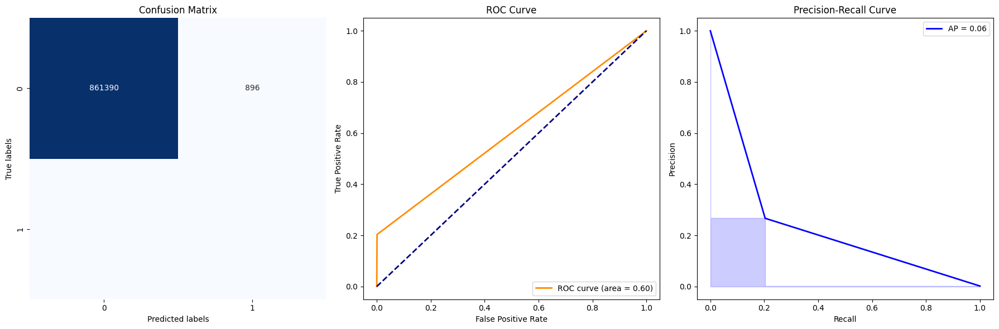

In [158]:
# For Decision Trees with custom weights:
clf_dt_custom = DecisionTreeClassifier(class_weight={0: 1.001, 1: 1001}, random_state=42)
clf_dt_custom.fit(X_train, y_train)
displaymetrics(clf_dt_custom, X_test, y_test)
store_results(clf_dt_custom, "DecisionTree_Custom", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.89      0.33      0.48      1603

    accuracy                           1.00    863889
   macro avg       0.94      0.67      0.74    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862219     67]
 [  1070    533]]


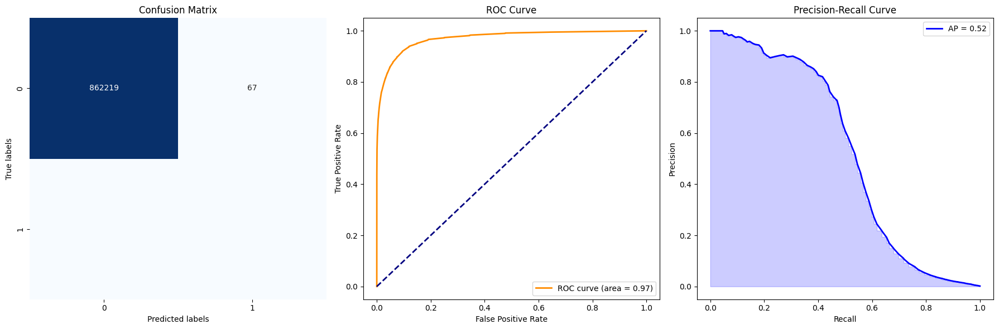

In [160]:
# For Random Forest:
from sklearn.ensemble import RandomForestClassifier

clf_rf = RandomForestClassifier(random_state=42)
clf_rf.fit(X_train, y_train)
displaymetrics(clf_rf, X_test, y_test)
store_results(clf_rf, "RandomForest", X_test, y_test, results)


Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.53      0.50      0.51      1603

    accuracy                           1.00    863889
   macro avg       0.76      0.75      0.76    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[861559    727]
 [   797    806]]


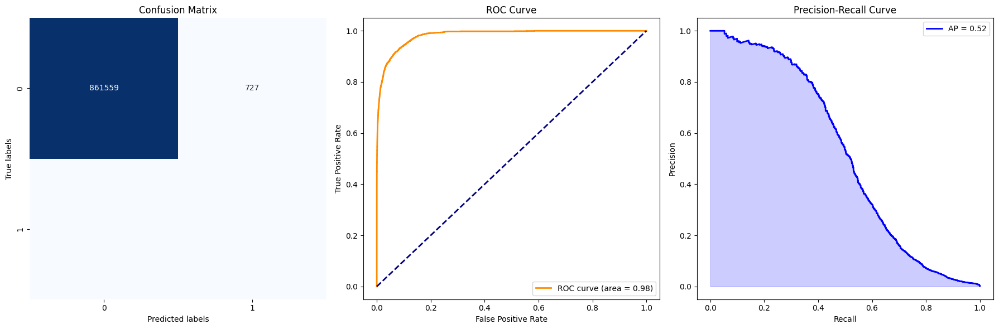

In [163]:
# For XGBoost:
import xgboost as xgb
# Convert the 'IsPotentialSmurfing' column to integer type
X_train['IsPotentialSmurfing'] = X_train['IsPotentialSmurfing'].astype(int)
X_test['IsPotentialSmurfing'] = X_test['IsPotentialSmurfing'].astype(int)

clf_xgb = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False, random_state=42)
clf_xgb.fit(X_train, y_train)
displaymetrics(clf_xgb, X_test, y_test)
store_results(clf_xgb, "XGBoost", X_test, y_test, results)

In [164]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform it
X_train_scaled = scaler.fit_transform(X_train)

# Transform the test data using the same scaler
X_test_scaled = scaler.transform(X_test)


[LightGBM] [Info] Number of positive: 3027, number of negative: 3729462
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.191030 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6911
[LightGBM] [Info] Number of data points in the train set: 3732489, number of used features: 45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.000811 -> initscore=-7.116447
[LightGBM] [Info] Start training from score -7.116447
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.94      0.97    862286
           1       0.02      0.53      0.03      1603

    accuracy                           0.94    863889
   macro avg       0.51      0.73      0.50    863889
weighted avg       1.00      0.94      0.97    86388

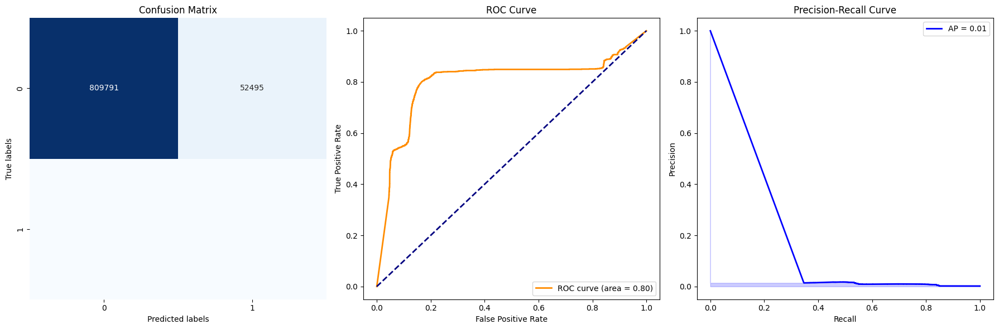

In [165]:
import lightgbm as lgb

clf_lgbm = lgb.LGBMClassifier(random_state=42)
clf_lgbm.fit(X_train_scaled, y_train)

displaymetrics(clf_lgbm, X_test_scaled, y_test)
store_results(clf_lgbm, "LGBM", X_test_scaled, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.00      0.03      0.01      1603

    accuracy                           0.99    863889
   macro avg       0.50      0.51      0.50    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[851242  11044]
 [  1554     49]]


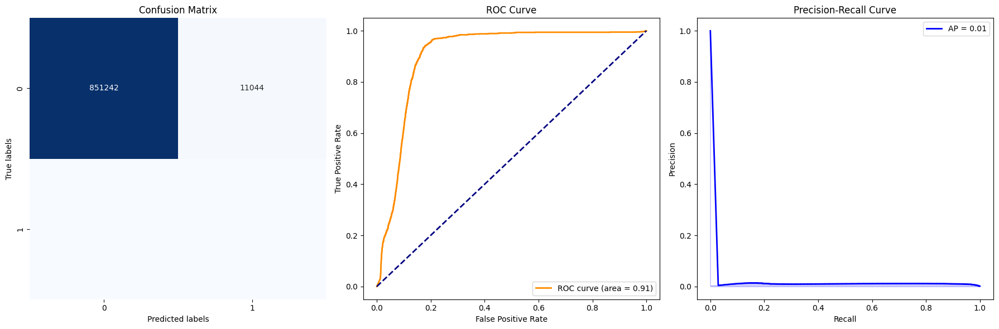

In [167]:
from sklearn.linear_model import SGDClassifier
clf_lr_sgd = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3, random_state=42)
clf_lr_sgd.fit(X_train_scaled, y_train)

displaymetrics(clf_lr_sgd, X_test_scaled, y_test)
store_results(clf_lr_sgd, "LRSGD", X_test_scaled, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.00      0.03      0.01      1603

    accuracy                           0.98    863889
   macro avg       0.50      0.51      0.50    863889
weighted avg       1.00      0.98      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[850600  11686]
 [  1550     53]]


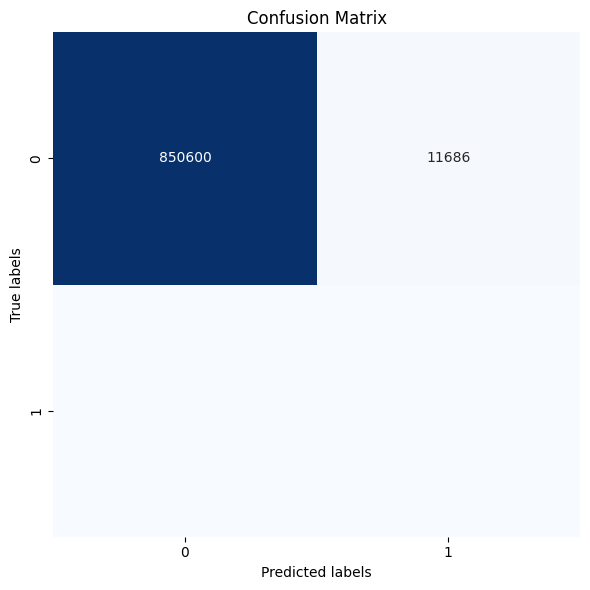

In [170]:
from sklearn.linear_model import SGDClassifier

clf_svm_sgd = SGDClassifier(loss='hinge', max_iter=1000, random_state=42)
clf_svm_sgd.fit(X_train_scaled, y_train)

displaymetrics(clf_svm_sgd, X_test_scaled, y_test)
store_results(clf_svm_sgd, "SVMSGD", X_test_scaled, y_test, results)

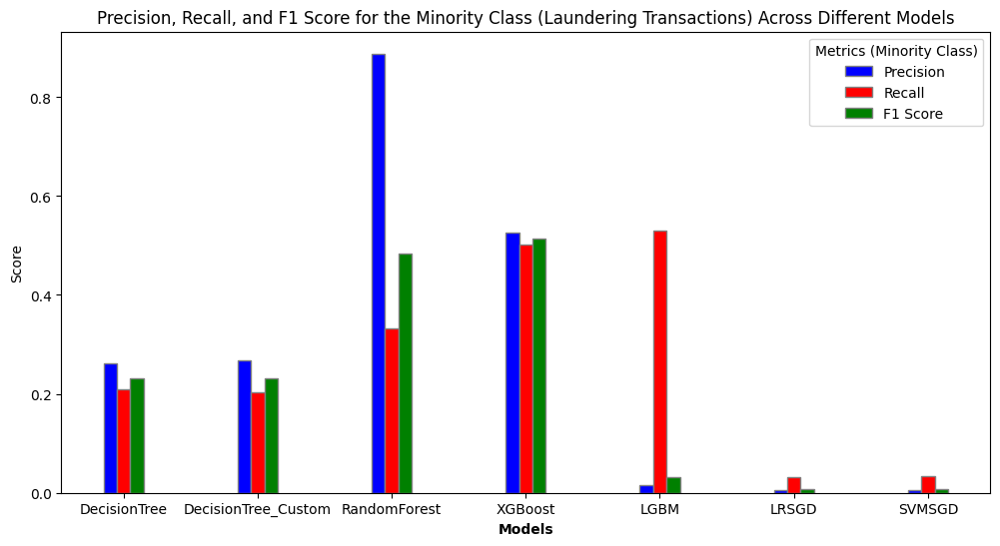

In [332]:
import matplotlib.pyplot as plt
import numpy as np

# Models to be displayed
models_to_display = ['DecisionTree', 'DecisionTree_Custom', 'RandomForest', 'XGBoost', 'LGBM', 'LRSGD', 'SVMSGD']

filtered_results = {model: results[model] for model in models_to_display}

# Extracting precision, recall, and f1 scores for each classifier
precision_scores = [filtered_results[model]['precision'] for model in filtered_results]
recall_scores = [filtered_results[model]['recall'] for model in filtered_results]
f1_scores = [filtered_results[model]['f1_minority'] for model in filtered_results]

# Setting the positions and width for the bars
barWidth = 0.1
r1 = np.arange(len(precision_scores))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Creating the bars
plt.figure(figsize=(12, 6))
plt.bar(r1, precision_scores, color='b', width=barWidth, edgecolor='grey', label='Precision')
plt.bar(r2, recall_scores, color='r', width=barWidth, edgecolor='grey', label='Recall')
plt.bar(r3, f1_scores, color='g', width=barWidth, edgecolor='grey', label='F1 Score ')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision_scores))], list(filtered_results.keys()))
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for the Minority Class (Laundering Transactions) Across Different Models')
plt.legend(title="Metrics (Minority Class)")

# Displaying the plot
plt.show()


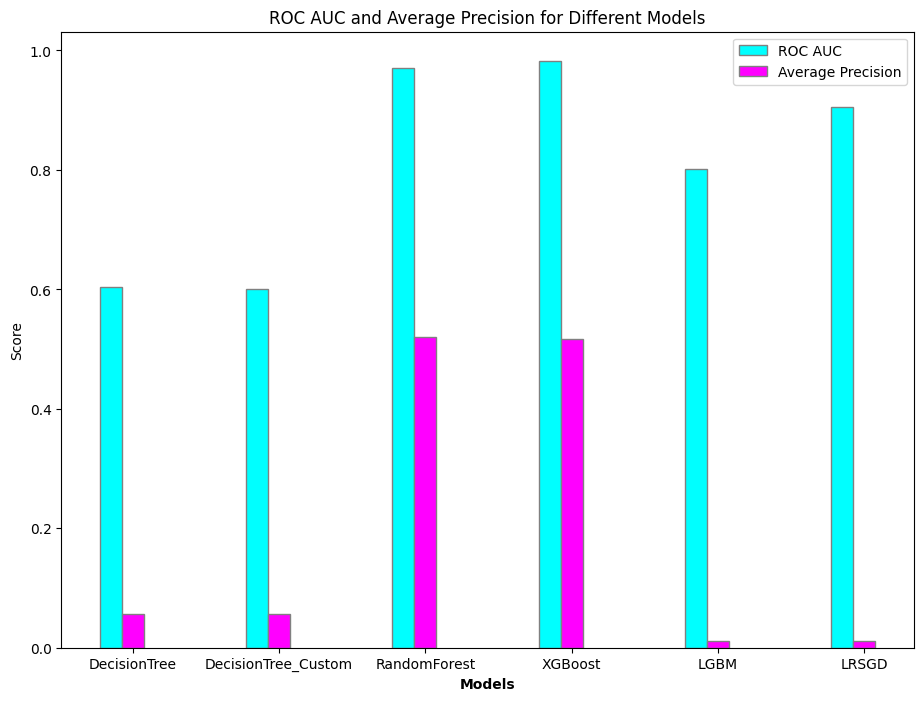

In [330]:
# Models to be displayed
models_to_display = ['DecisionTree', 'DecisionTree_Custom', 'RandomForest', 'XGBoost', 'LGBM', 'LRSGD', 'SVMSGD']
filtered_results = {model: results[model] for model in models_to_display if results[model]['roc_auc'] != "N/A" and results[model]['avg_precision'] != "N/A"}

# Extracting ROC AUC and Average Precision for each classifier
roc_auc_scores = [filtered_results[model]['roc_auc'] for model in filtered_results]
avg_precision_scores = [filtered_results[model]['avg_precision'] for model in filtered_results]

# Setting the positions and width for the bars
barWidth = 0.15
r1 = np.arange(len(roc_auc_scores))
r2 = [x + barWidth for x in r1]

# Creating the bars
plt.figure(figsize=(11, 8))
plt.bar(r1, roc_auc_scores, color='cyan', width=barWidth, edgecolor='grey', label='ROC AUC')
plt.bar(r2, avg_precision_scores, color='magenta', width=barWidth, edgecolor='grey', label='Average Precision')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(roc_auc_scores))], list(filtered_results.keys()))
plt.ylabel('Score')
plt.title('ROC AUC and Average Precision for Different Models')
plt.legend()

# Displaying the plot
plt.show()


➡ **CREATING A RESAMPLED DATA FRAME WHERE THE MINORITY CLASS IS UPSAMPLED**

In [183]:
# Splitting df_resampled into X_train and y_train
X_train_resampled = df_resampled.drop('Is Laundering', axis=1)
y_train_resampled = df_resampled['Is Laundering']

In [184]:
# Check if all datasets have the same columns
datasets = {'X_train_resampled': X_train_resampled,  'X_test': X_test}
all_equal = all(set(X_train_resampled.columns) == set(dataset.columns) for dataset in datasets.values())

if all_equal:
    print("All datasets have the same columns.")
else:
    for name, dataset in datasets.items():
        if set(X_train_resampled.columns) != set(dataset.columns):
            print(f"Columns in X_train_resampled but not in {name}:", set(X_train_resampled.columns) - set(dataset.columns))
            print(f"Columns in {name} but not in X_train_resampled:", set(dataset.columns) - set(X_train_resampled.columns))


Columns in X_train_resampled but not in X_test: {'Account', 'To Bank', 'DayOfWeek', 'From Bank', 'Amount Received', 'To_Account', 'ReceivedAmountMedian', 'Amount Paid'}
Columns in X_test but not in X_train_resampled: set()


In [185]:
# List of columns to exclude from X_train_resampled
exclude_columns = ['DayOfWeek', 'To_Account', 'From Bank', 'Amount Paid', 'To Bank', 'ReceivedAmountMedian', 'Account', 'Amount Received']

# Drop the specified columns from X_train_resampled
X_train_resampled = X_train_resampled.drop(columns=exclude_columns, errors='ignore')


In [186]:
# Check if all datasets have the same columns
datasets = {'X_train_resampled': X_train_resampled,  'X_test': X_test}
all_equal = all(set(X_train_resampled.columns) == set(dataset.columns) for dataset in datasets.values())

if all_equal:
    print("All datasets have the same columns.")
else:
    for name, dataset in datasets.items():
        if set(X_train_resampled.columns) != set(dataset.columns):
            print(f"Columns in X_train_resampled but not in {name}:", set(X_train_resampled.columns) - set(dataset.columns))
            print(f"Columns in {name} but not in X_train_resampled:", set(dataset.columns) - set(X_train_resampled.columns))


All datasets have the same columns.


In [187]:
X_train_resampled['IsPotentialSmurfing'] = X_train_resampled['IsPotentialSmurfing'].astype(int)

In [188]:
datasets = {'X_train_resampled': X_train_resampled, 'X_test': X_test}

all_match = True
for name, dataset in datasets.items():
    if not X_train_resampled.dtypes.equals(dataset.dtypes):
        print(f"There are discrepancies in data types between X_train_resampled and {name}.")
        all_match = False

if all_match:
    print("Data types of all columns in all datasets match!")


Data types of all columns in all datasets match!


In [189]:
datasets = {'X_train_resampled': X_train_resampled, 'X_test': X_test}

for name, dataset in datasets.items():
    print(f"Dataset: {name}")
    
    # Check for NaN values
    nan_cols = dataset.columns[dataset.isna().any()].tolist()
    if nan_cols:
        print(f"Columns with NaN values in {name}: {nan_cols}")
    else:
        print(f"No NaN values in {name}.")
    
    # Check for infinite values in numerical columns
    numerical_cols = dataset.select_dtypes(include=[np.number])
    inf_cols = numerical_cols.columns[np.isinf(numerical_cols).any()].tolist()
    if inf_cols:
        print(f"Columns with infinite values in {name} (numerical columns only): {inf_cols}")
    else:
        print(f"No infinite values in {name} (numerical columns only).")
    
    print("------")


Dataset: X_train_resampled
No NaN values in X_train_resampled.
No infinite values in X_train_resampled (numerical columns only).
------
Dataset: X_test
No NaN values in X_test.
No infinite values in X_test (numerical columns only).
------


In [190]:
X_train_resampled.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3759732 entries, 0 to 3759731
Data columns (total 46 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   Receiving Currency           float64
 1   Payment Currency             float64
 2   Payment Format               float64
 3   log Amount Received          float64
 4   log Amount Paid              float64
 5   IncomingTransactions         int64  
 6   OutgoingTransactions         int64  
 7   DegreeCentrality             float64
 8   TimeSinceFirstTransaction    float64
 9   Nearly_10K_Transactions      int64  
 10  LocalClusteringCoefficient   float64
 11  WeightedDegree               float64
 12  AvgNeighborDegree            float64
 13  IsIsolate                    bool   
 14  small_transactions_24h       float64
 15  unique_banks_24h             float64
 16  AvgAmountReceived_7days      float64
 17  Amount Received_monthly_avg  float64
 18  RelativeAmountReceived       float64
 19  

In [191]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 46 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Receiving Currency           863889 non-null  float64
 1   Payment Currency             863889 non-null  float64
 2   Payment Format               863889 non-null  float64
 3   log Amount Received          863889 non-null  float64
 4   log Amount Paid              863889 non-null  float64
 5   IncomingTransactions         863889 non-null  int64  
 6   OutgoingTransactions         863889 non-null  int64  
 7   DegreeCentrality             863889 non-null  float64
 8   TimeSinceFirstTransaction    863889 non-null  float64
 9   Nearly_10K_Transactions      863889 non-null  int64  
 10  LocalClusteringCoefficient   863889 non-null  float64
 11  WeightedDegree               863889 non-null  float64
 12  AvgNeighborDegree            863889 non-null  float64
 13  IsIs

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.19      0.21      0.20      1603

    accuracy                           1.00    863889
   macro avg       0.59      0.61      0.60    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[860830   1456]
 [  1261    342]]


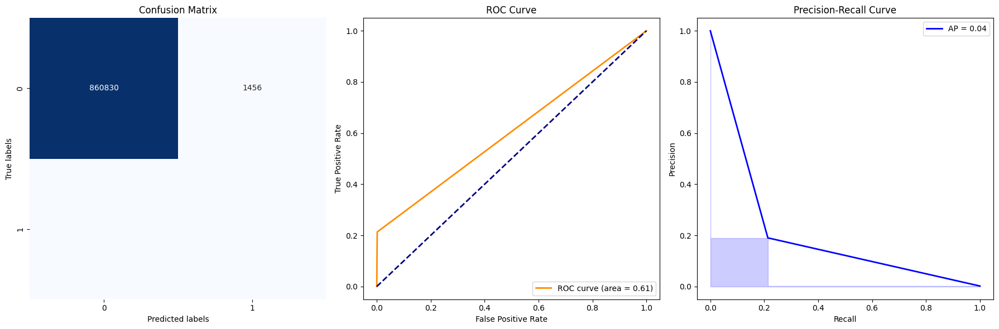

In [194]:
from sklearn.tree import DecisionTreeClassifier

# Initialise the Decision Tree classifier with class weights set to 'balanced'
clf_dtb_resampled = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clf_dtb_resampled.fit(X_train_resampled, y_train_resampled)

displaymetrics(clf_dtb_resampled, X_test, y_test)
store_results(clf_dtb_resampled, "Decision Tree RS", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.45      0.11      0.18      1603

    accuracy                           1.00    863889
   macro avg       0.72      0.56      0.59    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862065    221]
 [  1425    178]]


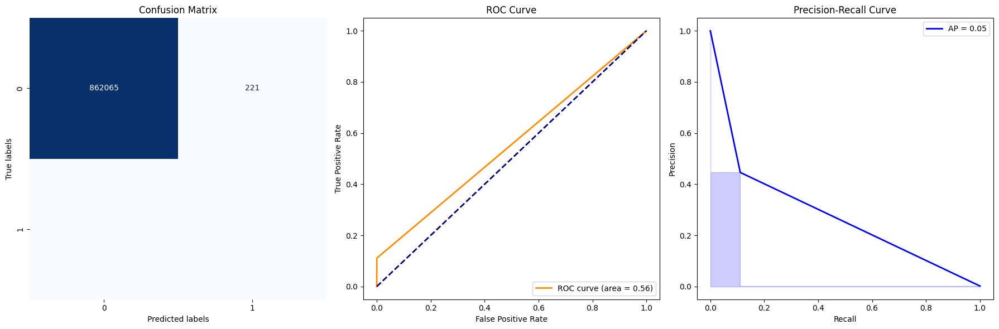

In [195]:
from sklearn.tree import DecisionTreeClassifier

clf_dtbc_resampled = DecisionTreeClassifier(class_weight={0: 1.001, 1: 1001}, random_state=42)
clf_dtbc_resampled.fit(X_train_resampled, y_train_resampled)

displaymetrics(clf_dtbc_resampled, X_test, y_test)
store_results(clf_dtbc_resampled, "Decision Tree Custom RS", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.84      0.33      0.48      1603

    accuracy                           1.00    863889
   macro avg       0.92      0.67      0.74    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862188     98]
 [  1073    530]]


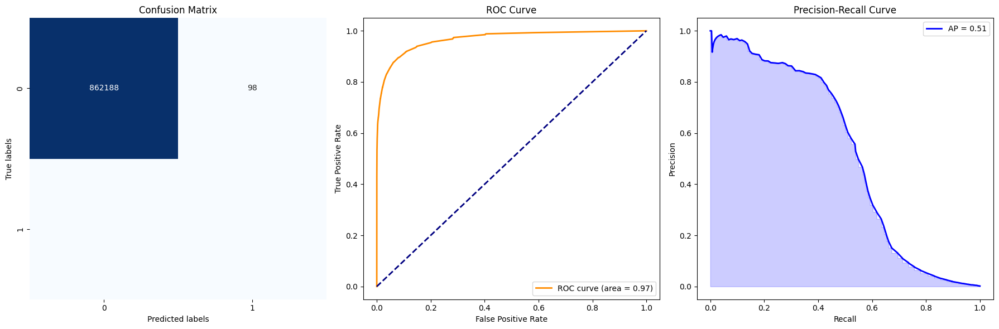

In [196]:
from sklearn.ensemble import RandomForestClassifier

clf_rf_resampled = RandomForestClassifier(n_jobs=-1, random_state=42)
clf_rf_resampled.fit(X_train_resampled, y_train_resampled)

displaymetrics(clf_rf_resampled, X_test, y_test)
store_results(clf_rf_resampled, "Random Forest RS", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.38      0.56      0.45      1603

    accuracy                           1.00    863889
   macro avg       0.69      0.78      0.73    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[860801   1485]
 [   700    903]]


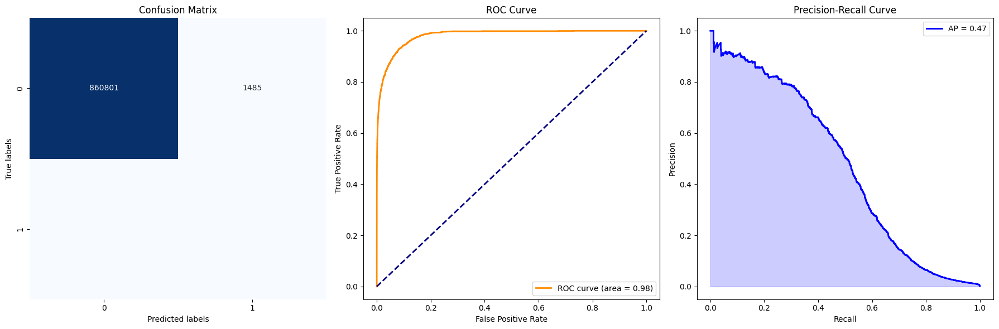

In [201]:
import xgboost as xgb


clf_xgb_resampled = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False, random_state=42)
clf_xgb_resampled.fit(X_train_resampled, y_train_resampled)

displaymetrics(clf_xgb_resampled, X_test, y_test)
store_results(clf_xgb_resampled, "XGBoost RS", X_test, y_test, results)

In [202]:
from sklearn.preprocessing import StandardScaler

# Initialise the scaler
scaler = StandardScaler()

# Fit the scaler on the resampled training data and transform it
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)

# Transform the test data using the same scaler
X_test_scaled = scaler.transform(X_test)


[LightGBM] [Info] Number of positive: 30270, number of negative: 3729462
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.291269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6907
[LightGBM] [Info] Number of data points in the train set: 3759732, number of used features: 45
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.008051 -> initscore=-4.813862
[LightGBM] [Info] Start training from score -4.813862
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.10      0.61      0.18      1603

    accuracy                           0.99    863889
   macro avg       0.55      0.80      0.59    863889
weighted avg       1.00      0.99      0.99    863889

------------------------------------------------------------

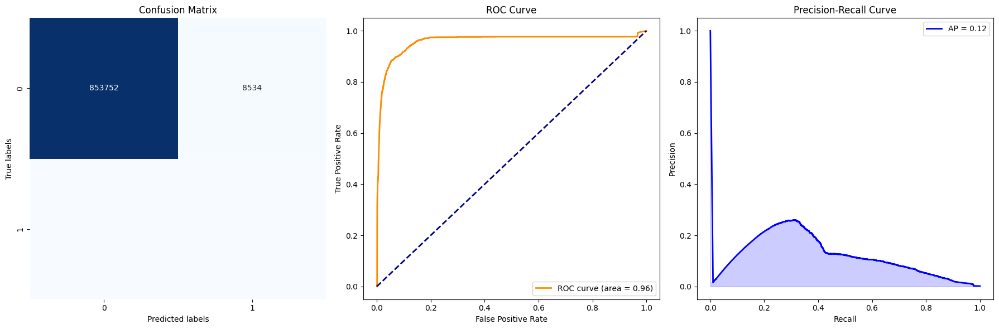

In [205]:
import lightgbm as lgb

clf_lgbm_resampled = lgb.LGBMClassifier(random_state=42)
clf_lgbm_resampled.fit(X_train_resampled_scaled, y_train_resampled)

displaymetrics(clf_lgbm_resampled, X_test_scaled, y_test)
store_results(clf_lgbm_resampled, "LGBM RS", X_test_scaled, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.00      0.00      0.00      1603

    accuracy                           1.00    863889
   macro avg       0.50      0.50      0.50    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862272     14]
 [  1603      0]]


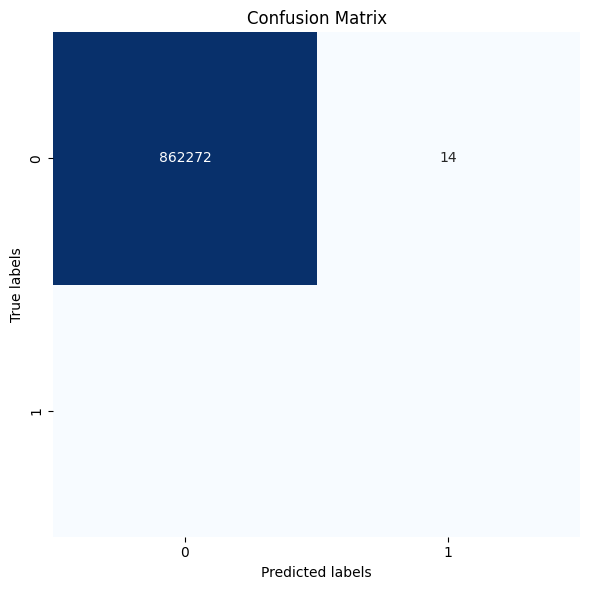

In [206]:
from sklearn.linear_model import SGDClassifier

clf_svm_sgd_resampled = SGDClassifier(loss='hinge', max_iter=1000, random_state=42)
clf_svm_sgd_resampled.fit(X_train_resampled_scaled, y_train_resampled)

displaymetrics(clf_svm_sgd_resampled, X_test_scaled, y_test)
store_results(clf_svm_sgd_resampled, "SVMSGD RS", X_test_scaled, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.01      0.05      0.01      1603

    accuracy                           0.99    863889
   macro avg       0.50      0.52      0.50    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[852834   9452]
 [  1520     83]]


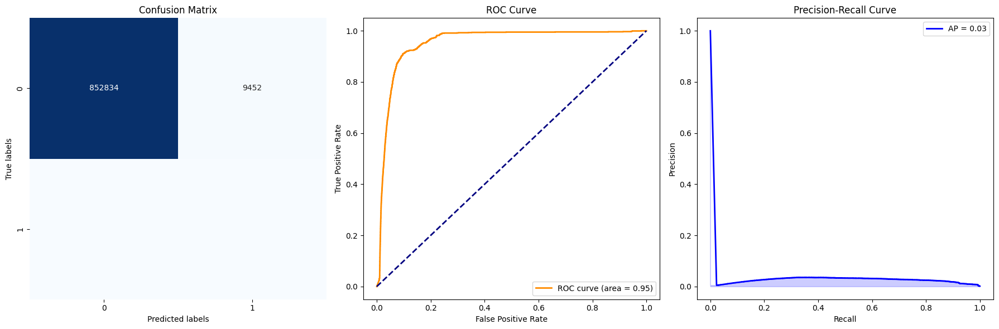

In [207]:
clf_lr_sgd_resampled = SGDClassifier(loss='log_loss', max_iter=1000, tol=1e-3, random_state=42)
clf_lr_sgd_resampled.fit(X_train_resampled_scaled, y_train_resampled)

displaymetrics(clf_lr_sgd_resampled, X_test_scaled, y_test)
store_results(clf_lr_sgd_resampled, "LRSGD RS", X_test_scaled, y_test, results)

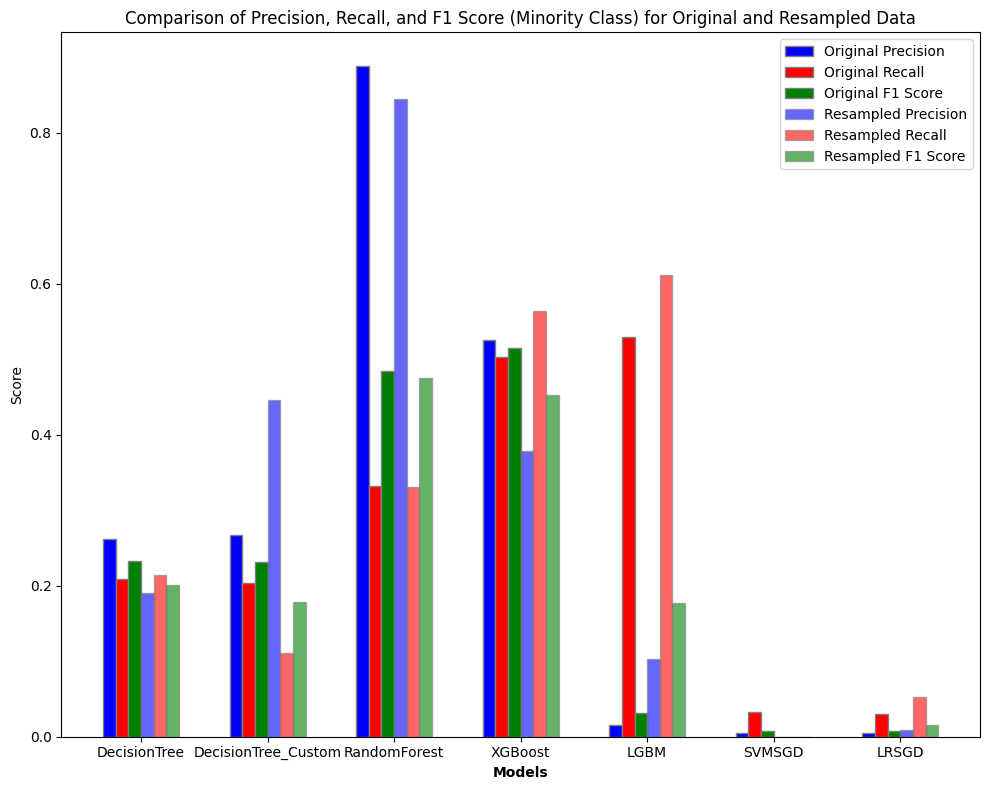

In [215]:
# Define the models to be plotted
models_original = ['DecisionTree', 'DecisionTree_Custom', 'RandomForest', 'XGBoost', 'LGBM', 'SVMSGD', 'LRSGD']
models_resampled = ['Decision Tree RS', 'Decision Tree Custom RS', 'Random Forest RS', 'XGBoost RS', 'LGBM RS', 'SVMSGD RS', 'LRSGD RS']

# Extracting precision, recall, and f1 scores for each classifier
precision_scores_original = [results[model]['precision'] for model in models_original]
recall_scores_original = [results[model]['recall'] for model in models_original]
f1_scores_original = [results[model]['f1_minority'] for model in models_original]

precision_scores_resampled = [results[model]['precision'] for model in models_resampled]
recall_scores_resampled = [results[model]['recall'] for model in models_resampled]
f1_scores_resampled = [results[model]['f1_minority'] for model in models_resampled]

# Setting the positions and width for the bars
barWidth = 0.1
r1 = np.arange(len(precision_scores_original))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]

# Creating the bars
plt.figure(figsize=(10, 8))
plt.bar(r1, precision_scores_original, color='b', width=barWidth, edgecolor='grey', label='Original Precision')
plt.bar(r2, recall_scores_original, color='r', width=barWidth, edgecolor='grey', label='Original Recall')
plt.bar(r3, f1_scores_original, color='g', width=barWidth, edgecolor='grey', label='Original F1 Score')

plt.bar(r4, precision_scores_resampled, color='b', width=barWidth, edgecolor='grey', alpha=0.6, label='Resampled Precision')
plt.bar(r5, recall_scores_resampled, color='r', width=barWidth, edgecolor='grey', alpha=0.6, label='Resampled Recall')
plt.bar(r6, f1_scores_resampled, color='g', width=barWidth, edgecolor='grey', alpha=0.6, label='Resampled F1 Score')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + 2.5*barWidth for r in range(len(precision_scores_original))], models_original)
plt.ylabel('Score')
plt.title('Comparison of Precision, Recall, and F1 Score (Minority Class) for Original and Resampled Data')
plt.legend()

# Displaying the plot
plt.tight_layout()
plt.show()

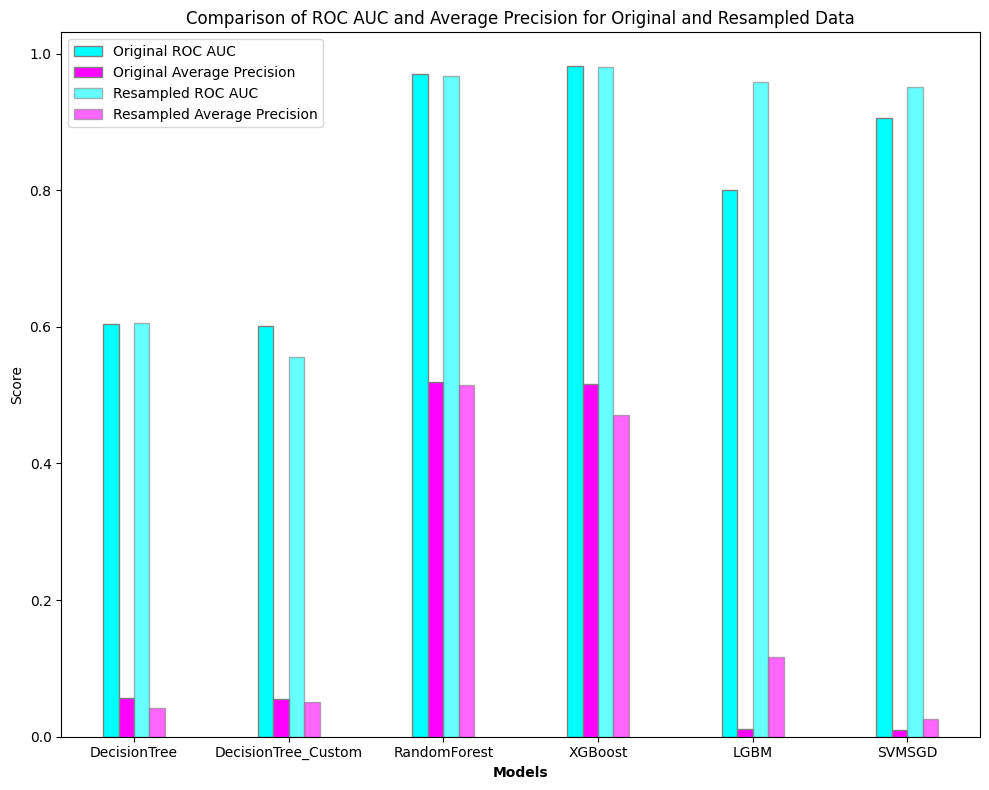

In [221]:
# Filter out models with non-numeric values for plotting
def filter_models(models, scores):
    return [model for model, score in zip(models, scores) if isinstance(score, (int, float))]

filtered_models_original = filter_models(models_original, roc_auc_scores_original)

# Setting the positions and width for the bars
barWidth = 0.1
r1 = np.arange(len(roc_auc_scores_original))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]

# Creating the bars
plt.figure(figsize=(10, 8))
plt.bar(r1, roc_auc_scores_original, color='cyan', width=barWidth, edgecolor='grey', label='Original ROC AUC')
plt.bar(r2, avg_precision_scores_original, color='magenta', width=barWidth, edgecolor='grey', label='Original Average Precision')

plt.bar(r3, roc_auc_scores_resampled, color='cyan', width=barWidth, edgecolor='grey', alpha=0.6, label='Resampled ROC AUC')
plt.bar(r4, avg_precision_scores_resampled, color='magenta', width=barWidth, edgecolor='grey', alpha=0.6, label='Resampled Average Precision')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + 1.5*barWidth for r in range(len(roc_auc_scores_original))], filtered_models_original)
plt.ylabel('Score')
plt.title('Comparison of ROC AUC and Average Precision for Original and Resampled Data')
plt.legend()

# Displaying the plot
plt.tight_layout()
plt.show()


➡ **RUNNING MODELS ON VARIOUS RANDOM SPLITS WITH VARYING RATIOS WHERE THE MAJORITY CLASS IS DOWNSAMPLED**

In [222]:
# Splitting df_1_to_1 into X_train_1_to_1 and y_train_1_to_1
y_train_1_to_1 = df_1_to_1['Is Laundering'].copy()
X_train_1_to_1 = df_1_to_1.drop(columns=['Is Laundering'])

# Splitting df_10_to_1 into X_train_10_to_1 and y_train_10_to_1
y_train_10_to_1 = df_10_to_1['Is Laundering'].copy()
X_train_10_to_1 = df_10_to_1.drop(columns=['Is Laundering'])

# Splitting df_20_to_1 into X_train_20_to_1 and y_train_20_to_1
y_train_20_to_1 = df_20_to_1['Is Laundering'].copy()
X_train_20_to_1 = df_20_to_1.drop(columns=['Is Laundering'])

# Splitting df_30_to_1 into X_train_30_to_1 and y_train_30_to_1
y_train_30_to_1 = df_30_to_1['Is Laundering'].copy()
X_train_30_to_1 = df_30_to_1.drop(columns=['Is Laundering'])


In [223]:
# Convert 'IsPotentialSmurfing' to category type in random splits

X_train_1_to_1['IsPotentialSmurfing'] = X_train_1_to_1['IsPotentialSmurfing'].astype(int)
X_train_10_to_1['IsPotentialSmurfing'] = X_train_10_to_1['IsPotentialSmurfing'].astype(int)
X_train_20_to_1['IsPotentialSmurfing'] = X_train_20_to_1['IsPotentialSmurfing'].astype(int)
X_train_30_to_1['IsPotentialSmurfing'] = X_train_30_to_1['IsPotentialSmurfing'].astype(int)

In [229]:
# List of features to remove
features_to_remove = ['Account', 'To Bank', 'DayOfWeek', 'From Bank', 'Amount Received', 'To_Account', 'ReceivedAmountMedian', 'Amount Paid']

# Remove the features from each dataset in the dictionary
for name, train_dataset in train_datasets.items():
    train_datasets[name] = train_dataset.drop(columns=[feature for feature in features_to_remove if feature in train_dataset.columns])

# Check if data types of all columns in train datasets match with X_test
all_match = True
for name, train_dataset in train_datasets.items():
    if not X_test.dtypes.equals(train_dataset.dtypes):
        print(f"There are discrepancies in data types between X_test and {name}.")
        all_match = False

if all_match:
    print("Data types of all columns in all train datasets match with X_test!")


Data types of all columns in all train datasets match with X_test!


In [231]:
# Create a dictionary of train datasets
train_datasets = {
    'X_train_1_to_1': X_train_1_to_1,
    'X_train_10_to_1': X_train_10_to_1,
    'X_train_20_to_1': X_train_20_to_1,
    'X_train_30_to_1': X_train_30_to_1
}

# Check if data types of all columns in train datasets match with X_test
all_match = True
for name, train_dataset in train_datasets.items():
    if not X_test.dtypes.equals(train_dataset.dtypes):
        print(f"There are discrepancies in data types between X_test and {name}.")
        all_match = False

if all_match:
    print("Data types of all columns in all train datasets match with X_test!")

There are discrepancies in data types between X_test and X_train_1_to_1.
There are discrepancies in data types between X_test and X_train_10_to_1.
There are discrepancies in data types between X_test and X_train_20_to_1.
There are discrepancies in data types between X_test and X_train_30_to_1.


In [239]:
# Identify and resolve discrepancies in data types
for name, train_dataset in train_datasets.items():
    
    # Align the columns of train_dataset according to X_test
    train_dataset = train_dataset.reindex(columns=X_test.columns)
    
    # Identify mismatched columns
    common_cols = train_dataset.columns.intersection(X_test.columns)
    mismatched_cols = common_cols[train_dataset[common_cols].dtypes != X_test[common_cols].dtypes]
    
    if not mismatched_cols.empty:
        print(f"Columns with data type discrepancies in {name}: {mismatched_cols.tolist()}")
        
        # Ensure data types match
        for col in mismatched_cols:
            train_dataset[col] = train_dataset[col].astype(X_test[col].dtype)
                
        # Update the dataset in the dictionary
        train_datasets[name] = train_dataset

# Re-check if data types of all columns in train datasets match with X_test
all_match = True
for name, train_dataset in train_datasets.items():
    common_cols = train_dataset.columns.intersection(X_test.columns)
    mismatched_cols = common_cols[train_dataset[common_cols].dtypes != X_test[common_cols].dtypes]
    if not mismatched_cols.empty:
        print(f"There are still discrepancies in data types between X_test and {name} for columns: {mismatched_cols.tolist()}")
        all_match = False

if all_match:
    print("Data types of all columns in all train datasets now match with X_test!")


Data types of all columns in all train datasets now match with X_test!


In [240]:
# Add the four train sets to the datasets dictionary
datasets = {
    'X_test': X_test,
    'X_train_1_to_1': X_train_1_to_1,
    'X_train_10_to_1': X_train_10_to_1,
    'X_train_20_to_1': X_train_20_to_1,
    'X_train_30_to_1': X_train_30_to_1
}

for name, dataset in datasets.items():
    print(f"Dataset: {name}")
    
    # Check for NaN values
    nan_cols = dataset.columns[dataset.isna().any()].tolist()
    if nan_cols:
        print(f"Columns with NaN values in {name}: {nan_cols}")
    else:
        print(f"No NaN values in {name}.")
    
    # Check for infinite values in numerical columns
    numerical_cols = dataset.select_dtypes(include=[np.number])
    inf_cols = numerical_cols.columns[np.isinf(numerical_cols).any()].tolist()
    if inf_cols:
        print(f"Columns with infinite values in {name} (numerical columns only): {inf_cols}")
    else:
        print(f"No infinite values in {name} (numerical columns only).")
    
    print("------")


Dataset: X_test
No NaN values in X_test.
No infinite values in X_test (numerical columns only).
------
Dataset: X_train_1_to_1
No NaN values in X_train_1_to_1.
No infinite values in X_train_1_to_1 (numerical columns only).
------
Dataset: X_train_10_to_1
No NaN values in X_train_10_to_1.
No infinite values in X_train_10_to_1 (numerical columns only).
------
Dataset: X_train_20_to_1
No NaN values in X_train_20_to_1.
No infinite values in X_train_20_to_1 (numerical columns only).
------
Dataset: X_train_30_to_1
No NaN values in X_train_30_to_1.
No infinite values in X_train_30_to_1 (numerical columns only).
------


In [241]:
from sklearn.utils import resample

# Separate majority and minority classes
majority = train_df[train_df['Is Laundering'] == 0]
minority = train_df[train_df['Is Laundering'] == 1]

# Downsample majority class to get 60:1 ratio
downsampled_60_to_1 = resample(majority, 
                               replace=False, 
                               n_samples=len(minority)*60, 
                               random_state=42)
df_60_to_1 = pd.concat([downsampled_60_to_1, minority])

# Downsample majority class to get 80:1 ratio
downsampled_80_to_1 = resample(majority, 
                               replace=False, 
                               n_samples=len(minority)*80, 
                               random_state=42)
df_80_to_1 = pd.concat([downsampled_80_to_1, minority])

# Downsample majority class to get 100:1 ratio
downsampled_100_to_1 = resample(majority, 
                                replace=False, 
                                n_samples=len(minority)*100, 
                                random_state=42)
df_100_to_1 = pd.concat([downsampled_100_to_1, minority])

# Shuffle the dataframes
df_60_to_1 = df_60_to_1.sample(frac=1, random_state=42).reset_index(drop=True)
df_80_to_1 = df_80_to_1.sample(frac=1, random_state=42).reset_index(drop=True)
df_100_to_1 = df_100_to_1.sample(frac=1, random_state=42).reset_index(drop=True)

print("60:1 split:", df_60_to_1['Is Laundering'].value_counts())
print("80:1 split:", df_80_to_1['Is Laundering'].value_counts())
print("100:1 split:", df_100_to_1['Is Laundering'].value_counts())


60:1 split: Is Laundering
0    181620
1      3027
Name: count, dtype: int64
80:1 split: Is Laundering
0    242160
1      3027
Name: count, dtype: int64
100:1 split: Is Laundering
0    302700
1      3027
Name: count, dtype: int64


In [242]:
# Splitting df_60_to_1 into X_train_60_to_1 and y_train_60_to_1
y_train_60_to_1 = df_60_to_1['Is Laundering'].copy()
X_train_60_to_1 = df_60_to_1.drop(columns=['Is Laundering'])

# Splitting df_80_to_1 into X_train_80_to_1 and y_train_80_to_1
y_train_80_to_1 = df_80_to_1['Is Laundering'].copy()
X_train_80_to_1 = df_80_to_1.drop(columns=['Is Laundering'])

# Splitting df_100_to_1 into X_train_100_to_1 and y_train_100_to_1
y_train_100_to_1 = df_100_to_1['Is Laundering'].copy()
X_train_100_to_1 = df_100_to_1.drop(columns=['Is Laundering'])

In [243]:
# List of features to exclude
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
datasets_to_modify = [X_train_60_to_1, X_train_80_to_1, X_train_100_to_1]
for dataset in datasets_to_modify:
    dataset.drop(columns=[col for col in exclude_features if col in dataset.columns], inplace=True)

# Create a dictionary of datasets
datasets = {
    'X_train_60_to_1': X_train_60_to_1,
    'X_train_80_to_1': X_train_80_to_1,
    'X_train_100_to_1': X_train_100_to_1,
    'X_test': X_test
}

# Use X_test as the reference for column matching
reference_columns = X_test.columns

# Check if all datasets have the same columns as X_test
all_equal = all(set(reference_columns) == set(dataset.columns) for dataset in datasets.values())

if all_equal:
    print("All datasets have the same columns.")
else:
    for name, dataset in datasets.items():
        if set(reference_columns) != set(dataset.columns):
            print(f"Columns in X_test but not in {name}:", set(reference_columns) - set(dataset.columns))
            print(f"Columns in {name} but not in X_test:", set(dataset.columns) - set(reference_columns))


All datasets have the same columns.


In [244]:
# Convert 'IsPotentialSmurfing' to category type in random splits
X_train_60_to_1['IsPotentialSmurfing'] = X_train_60_to_1['IsPotentialSmurfing'].astype(int)
X_train_80_to_1['IsPotentialSmurfing'] = X_train_80_to_1['IsPotentialSmurfing'].astype(int)
X_train_100_to_1['IsPotentialSmurfing'] = X_train_100_to_1['IsPotentialSmurfing'].astype(int)
X_test['IsPotentialSmurfing'] = X_test['IsPotentialSmurfing'].astype(int)

In [245]:
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']
X_test = X_test.drop(columns=[col for col in exclude_features if col in X_test.columns])

# Align columns of datasets with X_test
datasets_to_modify = [X_train_60_to_1, X_train_80_to_1, X_train_100_to_1]
for dataset in datasets_to_modify:
    dataset = dataset[X_test.columns]

# Check if datatypes match
datasets = {
    'X_train_60_to_1': X_train_60_to_1,
    'X_train_80_to_1': X_train_80_to_1,
    'X_train_100_to_1': X_train_100_to_1
}

all_match = True
for name, dataset in datasets.items():
    mismatched_cols = dataset.columns[dataset.dtypes != X_test.dtypes]
    if len(mismatched_cols) > 0:
        all_match = False
        print(f"Data type discrepancies between X_test and {name}:")
        for col in mismatched_cols:
            print(f"Column '{col}': X_test ({X_test[col].dtype}) vs {name} ({dataset[col].dtype})")
        print("------")

if all_match:
    print("Data types of all columns in all datasets match with X_test!")

Data types of all columns in all datasets match with X_test!


In [246]:
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

train_datasets = {
    'X_train_1_to_1': X_train_1_to_1,
    'X_train_10_to_1': X_train_10_to_1,
    'X_train_20_to_1': X_train_20_to_1,
    'X_train_30_to_1': X_train_30_to_1,
    'X_train_60_to_1': X_train_60_to_1,
    'X_train_80_to_1': X_train_80_to_1,
    'X_train_100_to_1': X_train_100_to_1
}

# Exclude the specified features from each dataset
for name, dataset in train_datasets.items():
    train_datasets[name] = dataset.drop(columns=[col for col in exclude_features if col in dataset.columns])

# Now, each dataset in train_datasets will have the specified features excluded.


In [251]:
from sklearn.preprocessing import StandardScaler

# Initialise the scaler
scaler = StandardScaler()

# List of datasets to scale
train_datasets = {
    'X_train_1_to_1': X_train_1_to_1,
    'X_train_10_to_1': X_train_10_to_1,
    'X_train_20_to_1': X_train_20_to_1,
    'X_train_30_to_1': X_train_30_to_1,
    'X_train_60_to_1': X_train_60_to_1,
    'X_train_80_to_1': X_train_80_to_1,
    'X_train_100_to_1': X_train_100_to_1
}

# Scale the datasets and store in new variables with _scaled suffix
for name, dataset in train_datasets.items():
    # Only select numeric columns for scaling
    numeric_cols = dataset.select_dtypes(include=['float64', 'int64']).columns.tolist()
    dataset_numeric = dataset[numeric_cols]
    
    scaled_name = name + "_scaled"
    # Only scale the numeric columns and then combine with non-numeric columns
    dataset_scaled_numeric = scaler.fit_transform(dataset_numeric)
    dataset_scaled = pd.concat([pd.DataFrame(dataset_scaled_numeric, columns=numeric_cols), 
                                dataset.drop(columns=numeric_cols).reset_index(drop=True)], axis=1)
    
    globals()[scaled_name] = dataset_scaled


Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.90      0.95    862286
           1       0.01      0.80      0.03      1603

    accuracy                           0.90    863889
   macro avg       0.51      0.85      0.49    863889
weighted avg       1.00      0.90      0.94    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[774966  87320]
 [   318   1285]]


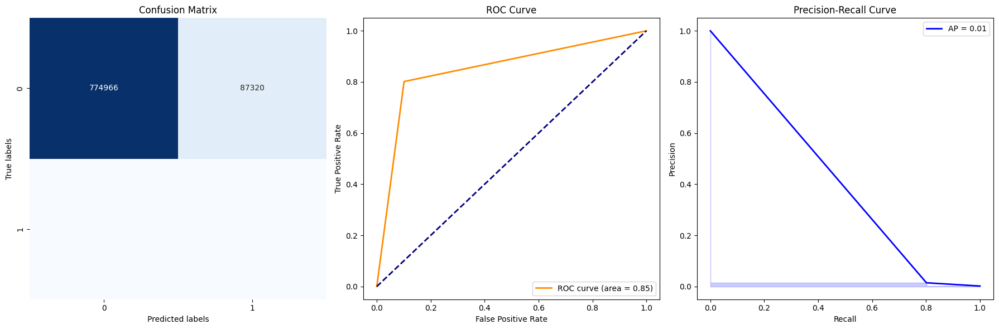

In [256]:
# List of features to exclude
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
X_train_1_to_1 = X_train_1_to_1.drop(columns=[col for col in exclude_features if col in X_train_1_to_1.columns])
X_test = X_test.drop(columns=[col for col in exclude_features if col in X_test.columns])

clfdt1to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt1to1.fit(X_train_1_to_1, y_train_1_to_1)

displaymetrics(clfdt1to1, X_test, y_test)
store_results(clfdt1to1, "Decision Trees 1to1", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.96      0.98    862286
           1       0.03      0.57      0.05      1603

    accuracy                           0.96    863889
   macro avg       0.51      0.77      0.52    863889
weighted avg       1.00      0.96      0.98    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[830259  32027]
 [   685    918]]


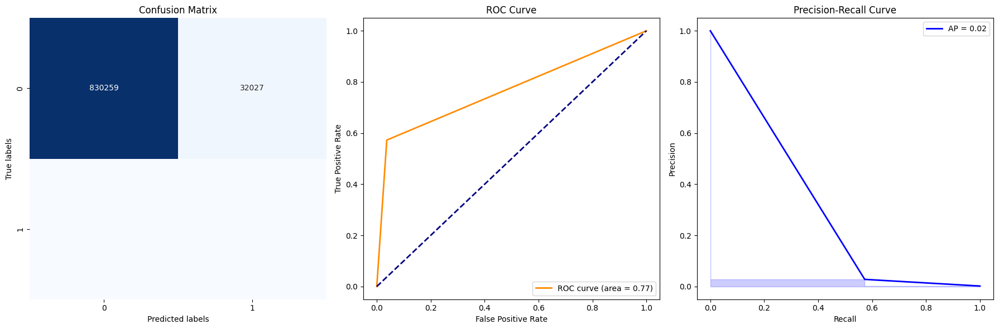

In [257]:
# List of features to exclude
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
X_train_10_to_1 = X_train_10_to_1.drop(columns=[col for col in exclude_features if col in X_train_10_to_1.columns])
X_test = X_test.drop(columns=[col for col in exclude_features if col in X_test.columns])

clfdt10to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt10to1.fit(X_train_10_to_1, y_train_10_to_1)

displaymetrics(clfdt10to1, X_test, y_test)
store_results(clfdt10to1, "Decision Trees 10to1", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    862286
           1       0.05      0.51      0.09      1603

    accuracy                           0.98    863889
   macro avg       0.52      0.75      0.54    863889
weighted avg       1.00      0.98      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[845623  16663]
 [   785    818]]


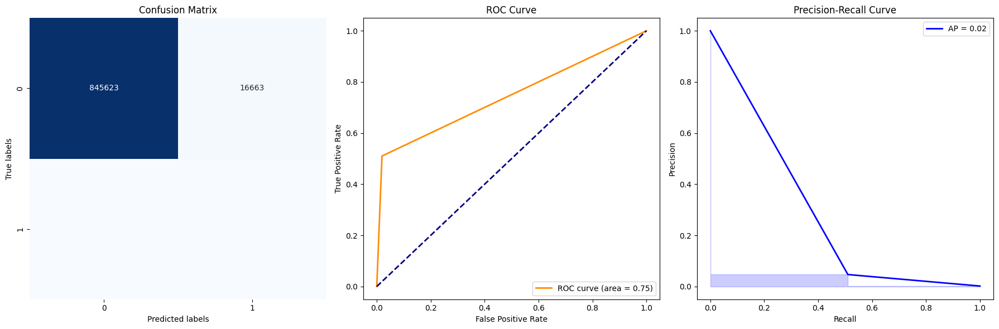

In [258]:
# List of features to exclude
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
X_train_20_to_1 = X_train_20_to_1.drop(columns=[col for col in exclude_features if col in X_train_20_to_1.columns])
X_test = X_test.drop(columns=[col for col in exclude_features if col in X_test.columns])

clfdt20to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt20to1.fit(X_train_20_to_1, y_train_20_to_1)

displaymetrics(clfdt20to1, X_test, y_test)
store_results(clfdt20to1, "Decision Trees 20to1", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.05      0.43      0.09      1603

    accuracy                           0.98    863889
   macro avg       0.53      0.71      0.54    863889
weighted avg       1.00      0.98      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[849710  12576]
 [   914    689]]


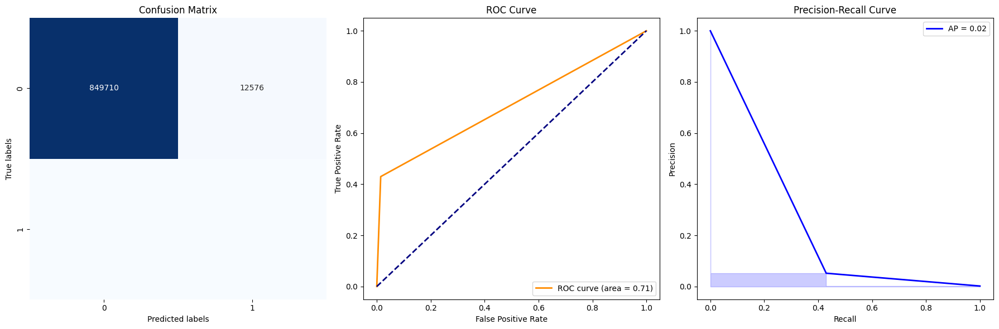

In [259]:
# List of features to exclude
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
X_train_30_to_1 = X_train_30_to_1.drop(columns=[col for col in exclude_features if col in X_train_30_to_1.columns])
X_test = X_test.drop(columns=[col for col in exclude_features if col in X_test.columns])

clfdt30to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt30to1.fit(X_train_30_to_1, y_train_30_to_1)

displaymetrics(clfdt30to1, X_test, y_test)
store_results(clfdt30to1, "Decision Trees 30to1", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.09      0.43      0.14      1603

    accuracy                           0.99    863889
   macro avg       0.54      0.71      0.57    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[854873   7413]
 [   907    696]]


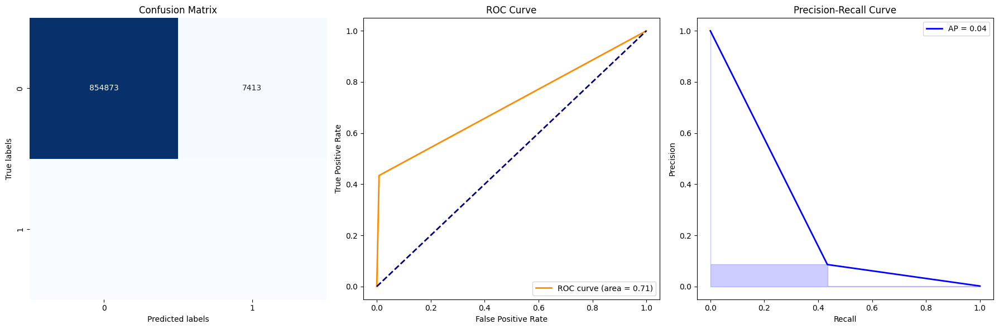

In [261]:
clfdt60to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt60to1.fit(X_train_60_to_1, y_train_60_to_1)

displaymetrics(clfdt60to1, X_test, y_test)
store_results(clfdt60to1, "Decision Trees 60to1", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.08      0.33      0.13      1603

    accuracy                           0.99    863889
   macro avg       0.54      0.66      0.56    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[856248   6038]
 [  1069    534]]


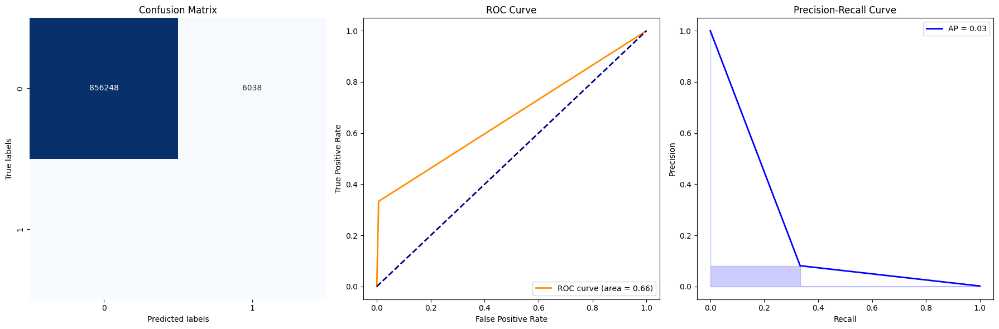

In [262]:
clfdt80to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt80to1.fit(X_train_80_to_1, y_train_80_to_1)

displaymetrics(clfdt80to1, X_test, y_test)
store_results(clfdt80to1, "Decision Trees 80to1", X_test, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.10      0.33      0.15      1603

    accuracy                           0.99    863889
   macro avg       0.55      0.66      0.57    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[857290   4996]
 [  1068    535]]


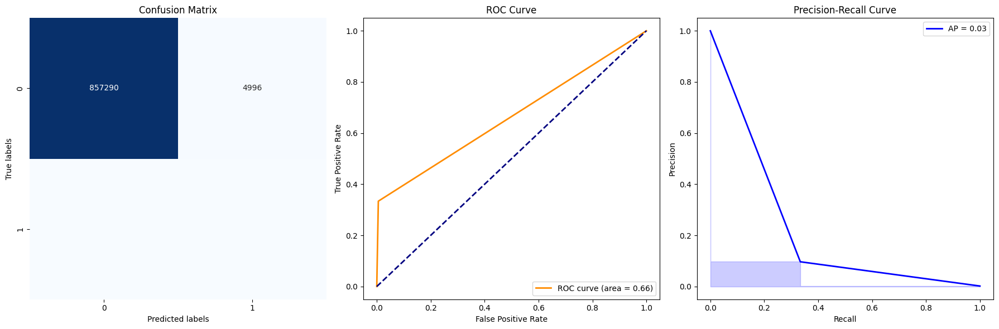

In [263]:
clfdt100to1 = DecisionTreeClassifier(class_weight='balanced', random_state=42)
clfdt100to1.fit(X_train_100_to_1, y_train_100_to_1)

displaymetrics(clfdt100to1, X_test, y_test)
store_results(clfdt100to1, "Decision Trees 100to1", X_test, y_test, results)

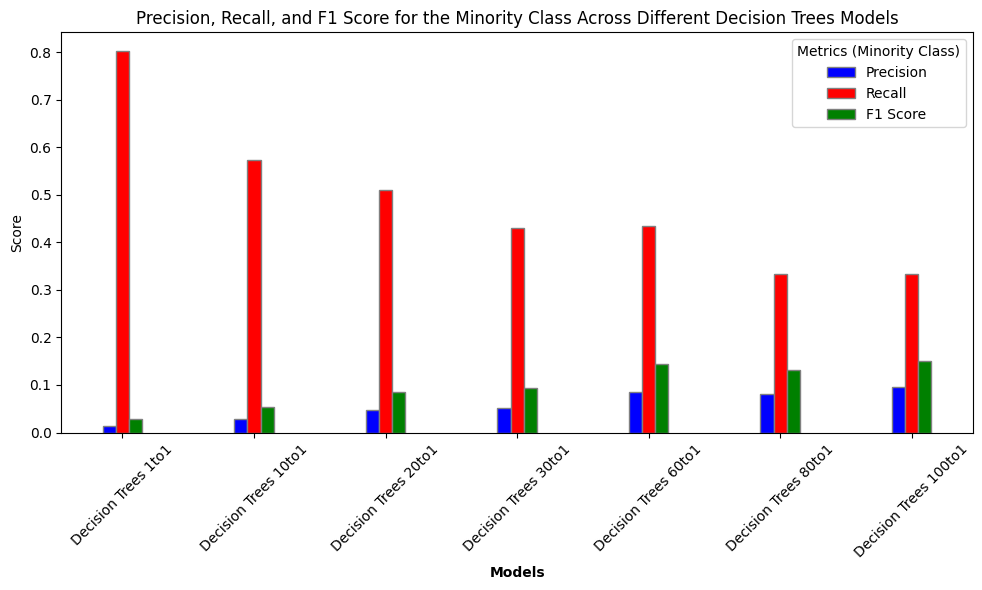

In [366]:
# Model names
models_decision_trees = ['Decision Trees 1to1', 'Decision Trees 10to1', 'Decision Trees 20to1', 'Decision Trees 30to1', 'Decision Trees 60to1', 'Decision Trees 80to1', 'Decision Trees 100to1']

# Extracting precision, recall, and f1 scores for each classifier
precision_scores = [results[model]['precision'] for model in models_decision_trees]
recall_scores = [results[model]['recall'] for model in models_decision_trees]
f1_scores = [results[model]['f1_minority'] for model in models_decision_trees]

# Setting the positions and width for the bars
barWidth = 0.1
r1 = np.arange(len(precision_scores))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Creating the bars
plt.figure(figsize=(10, 6))
plt.bar(r1, precision_scores, color='b', width=barWidth, edgecolor='grey', label='Precision')
plt.bar(r2, recall_scores, color='r', width=barWidth, edgecolor='grey', label='Recall')
plt.bar(r3, f1_scores, color='g', width=barWidth, edgecolor='grey', label='F1 Score ')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision_scores))], models_decision_trees,rotation=45)
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for the Minority Class Across Different Decision Trees Models')
plt.legend(title="Metrics (Minority Class)")
plt.tight_layout()
plt.show()

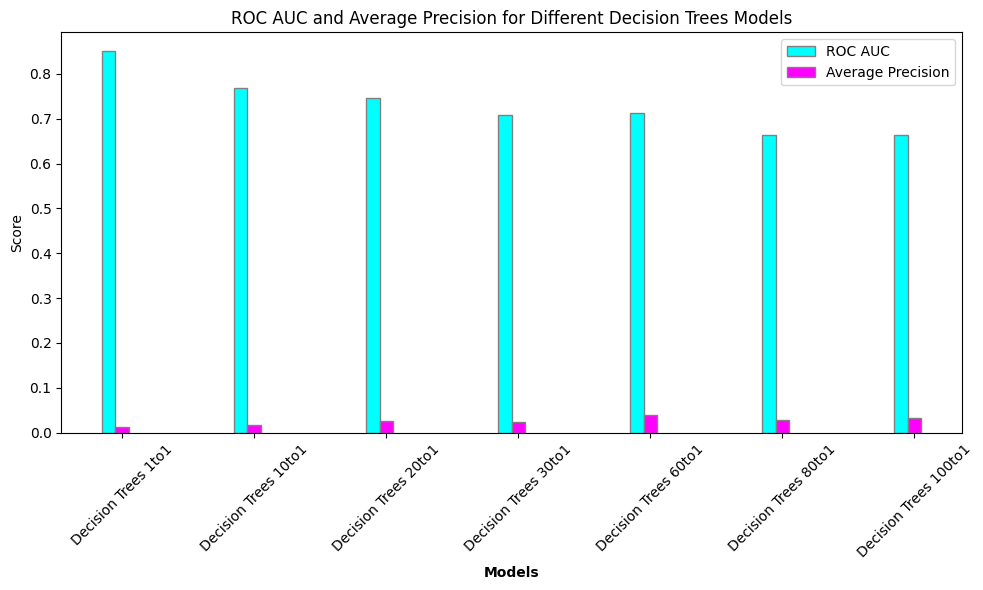

In [367]:
# Extracting ROC AUC and Average Precision for each classifier
roc_auc_scores = [results[model]['roc_auc'] for model in models_decision_trees if results[model]['roc_auc'] != "N/A"]
avg_precision_scores = [results[model]['avg_precision'] for model in models_decision_trees if results[model]['avg_precision'] != "N/A"]

# Setting the positions and width for the bars
r1 = np.arange(len(roc_auc_scores))
r2 = [x + barWidth for x in r1]

# Creating the bars
plt.figure(figsize=(10, 6))
plt.bar(r1, roc_auc_scores, color='cyan', width=barWidth, edgecolor='grey', label='ROC AUC')
plt.bar(r2, avg_precision_scores, color='magenta', width=barWidth, edgecolor='grey', label='Average Precision')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(roc_auc_scores))], [model for model in models_decision_trees if results[model]['roc_auc'] != "N/A"],rotation=45)
plt.ylabel('Score')
plt.title('ROC AUC and Average Precision for Different Decision Trees Models')
plt.legend()
plt.tight_layout()
plt.show()


Results for Random Forest 1to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.89      0.94    862286
           1       0.02      0.95      0.03      1603

    accuracy                           0.89    863889
   macro avg       0.51      0.92      0.49    863889
weighted avg       1.00      0.89      0.94    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[771249  91037]
 [    82   1521]]


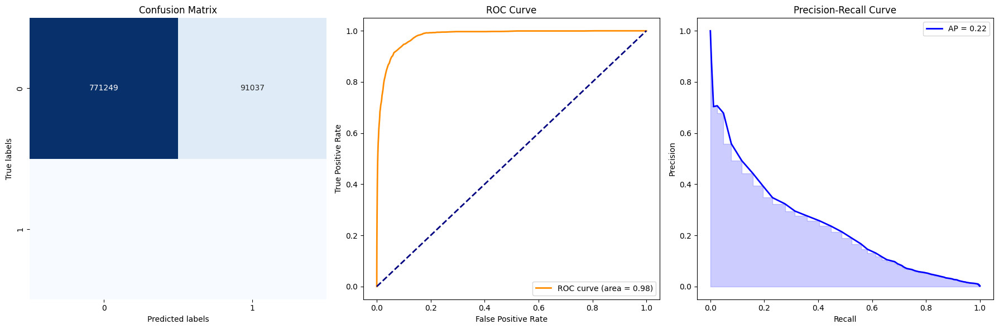


Results for Random Forest 10to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.98      0.99    862286
           1       0.07      0.80      0.12      1603

    accuracy                           0.98    863889
   macro avg       0.53      0.89      0.56    863889
weighted avg       1.00      0.98      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[844187  18099]
 [   324   1279]]


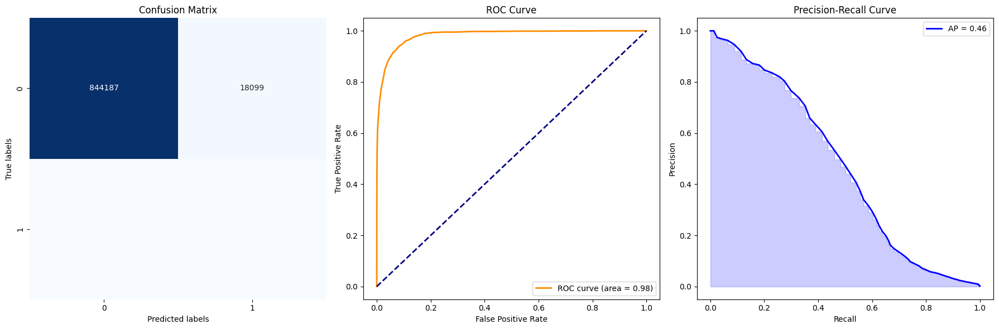


Results for Random Forest 20to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.10      0.73      0.17      1603

    accuracy                           0.99    863889
   macro avg       0.55      0.86      0.58    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[851388  10898]
 [   431   1172]]


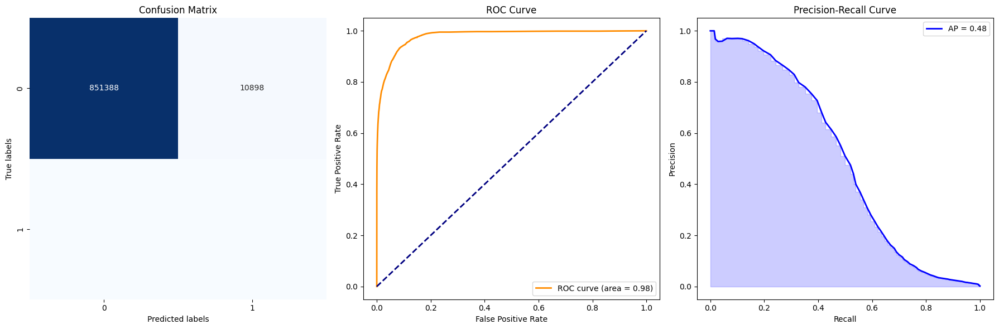


Results for Random Forest 30to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.17      0.69      0.27      1603

    accuracy                           0.99    863889
   macro avg       0.58      0.84      0.63    863889
weighted avg       1.00      0.99      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[856678   5608]
 [   489   1114]]


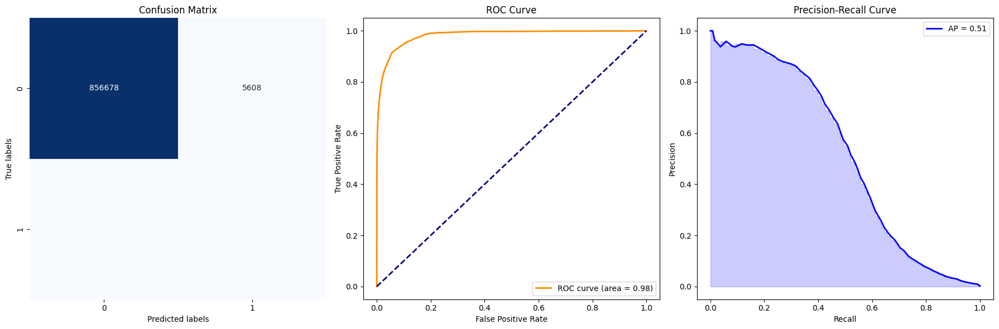


Results for Random Forest 60to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.27      0.61      0.37      1603

    accuracy                           1.00    863889
   macro avg       0.63      0.81      0.69    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[859581   2705]
 [   618    985]]


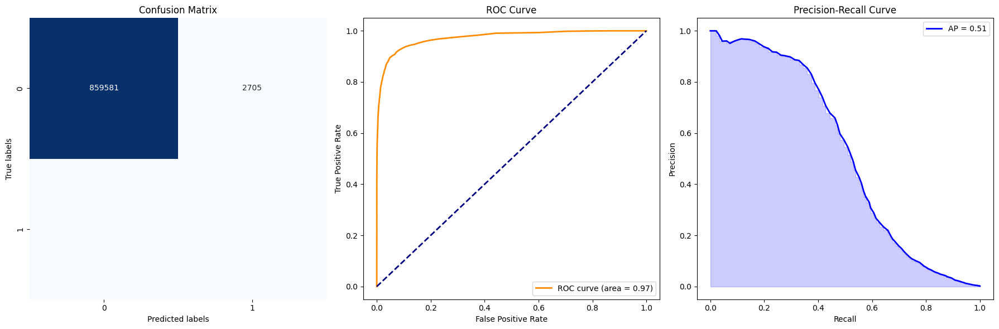


Results for Random Forest 80to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.35      0.59      0.44      1603

    accuracy                           1.00    863889
   macro avg       0.68      0.79      0.72    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[860561   1725]
 [   665    938]]


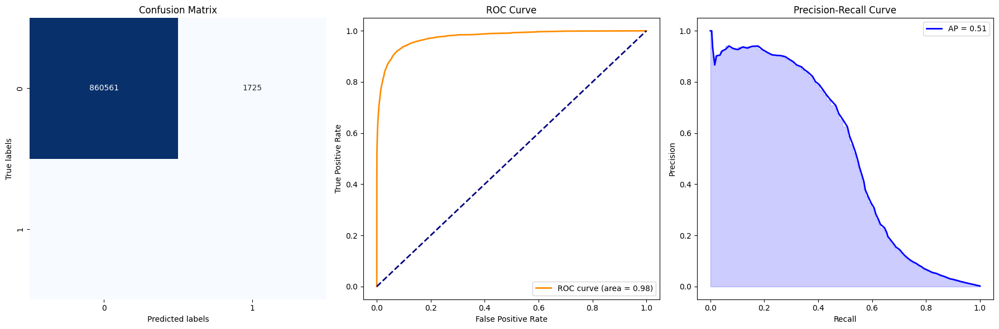


Results for Random Forest 100to1 dataset:
----------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------


In [343]:
from sklearn.ensemble import RandomForestClassifier

# List of resampled datasets and their names
datasets = [
    (X_train_1_to_1, y_train_1_to_1, "Random Forest 1to1"),
    (X_train_10_to_1, y_train_10_to_1, "Random Forest 10to1"),
    (X_train_20_to_1, y_train_20_to_1, "Random Forest 20to1"),
    (X_train_30_to_1, y_train_30_to_1, "Random Forest 30to1"),
    (X_train_60_to_1, y_train_60_to_1, "Random Forest 60to1"),
    (X_train_80_to_1, y_train_80_to_1, "Random Forest 80to1"),
    (X_train_100_to_1, y_train_100_to_1, "Random Forest 100to1")
]

# Loop through each dataset, train the model, display metrics, and store results
for X_train, y_train, model_name in datasets:
    print(f"\nResults for {model_name} dataset:\n" + "-"*40)  # Print the dataset name
    clf_rf = RandomForestClassifier(random_state=42)
    clf_rf.fit(X_train, y_train)
    
    displaymetrics(clf_rf, X_test, y_test)
    store_results(clf_rf, model_name, X_test, y_test, results)


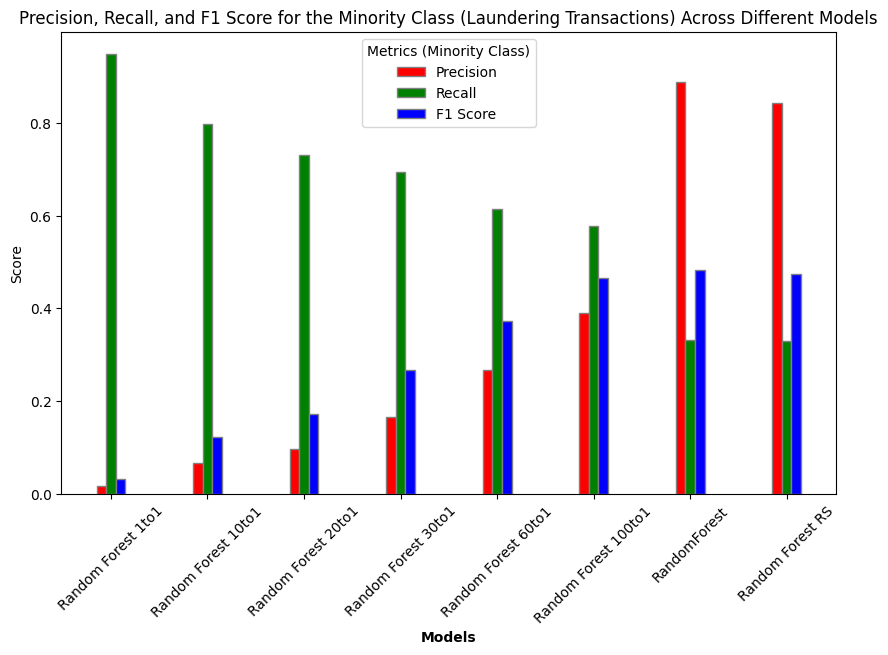

In [360]:
selected_models = ["Random Forest 1to1", "Random Forest 10to1", "Random Forest 20to1", "Random Forest 30to1", 
                   "Random Forest 60to1", "Random Forest 100to1", "RandomForest", "Random Forest RS"]

# Filter results for the selected models
filtered_results = {model: results[model] for model in selected_models}

# Extracting precision, recall, and f1 scores for each classifier
precision_scores = [filtered_results[model]['precision'] for model in filtered_results]
recall_scores = [filtered_results[model]['recall'] for model in filtered_results]
f1_scores = [filtered_results[model]['f1_minority'] for model in filtered_results]

# Setting the positions and width for the bars
barWidth = 0.10
r1 = np.arange(len(precision_scores))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Creating the bars for Precision, Recall, and F1 Score
plt.figure(figsize=(10, 6))
plt.bar(r1, precision_scores, color='red', width=barWidth, edgecolor='grey', label='Precision')
plt.bar(r2, recall_scores, color='green', width=barWidth, edgecolor='grey', label='Recall')
plt.bar(r3, f1_scores, color='blue', width=barWidth, edgecolor='grey', label='F1 Score ')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision_scores))], list(filtered_results.keys()),rotation=45)
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for the Minority Class (Laundering Transactions) Across Different Models')
plt.legend(title="Metrics (Minority Class)")

# Displaying the plot
plt.show()

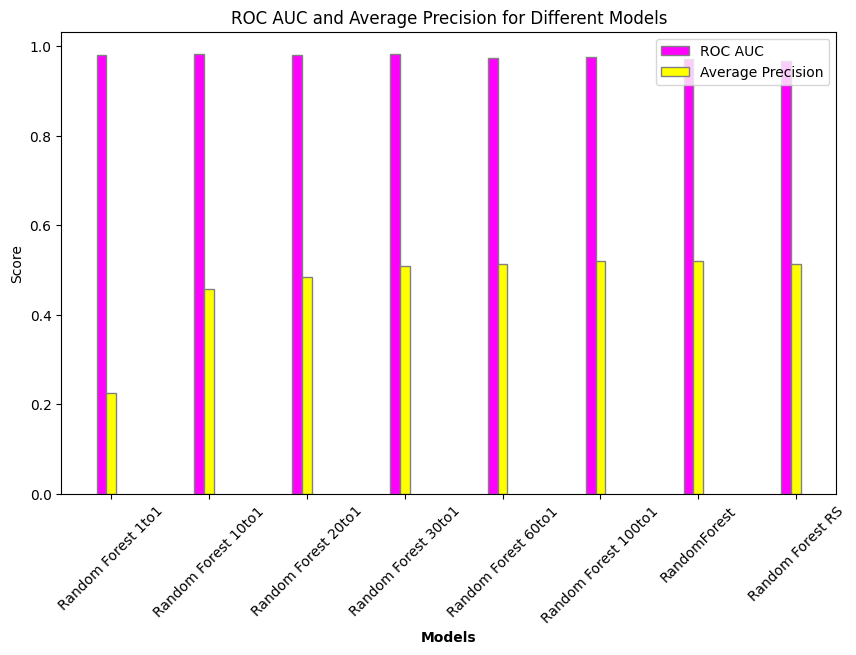

In [363]:

# Extracting ROC AUC and Average Precision for each classifier
roc_auc_scores = [filtered_results[model]['roc_auc'] for model in filtered_results if filtered_results[model]['roc_auc'] != "N/A"]
avg_precision_scores = [filtered_results[model]['avg_precision'] for model in filtered_results if filtered_results[model]['avg_precision'] != "N/A"]

# Setting the positions and width for the bars
r1 = np.arange(len(roc_auc_scores))
r2 = [x + barWidth for x in r1]

# Creating the bars for ROC AUC and Average Precision
plt.figure(figsize=(10, 6))
plt.bar(r1, roc_auc_scores, color='magenta', width=barWidth, edgecolor='grey', label='ROC AUC')
plt.bar(r2, avg_precision_scores, color='yellow', width=barWidth, edgecolor='grey', label='Average Precision')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(roc_auc_scores))], [model for model in filtered_results if filtered_results[model]['roc_auc'] != "N/A"],rotation=45)
plt.ylabel('Score')
plt.title('ROC AUC and Average Precision for Different Models')
plt.legend()

# Displaying the plot
plt.show()

Running XGBoost 1to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.88      0.94    862286
           1       0.02      0.97      0.03      1603

    accuracy                           0.88    863889
   macro avg       0.51      0.92      0.48    863889
weighted avg       1.00      0.88      0.94    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[761029 101257]
 [    54   1549]]


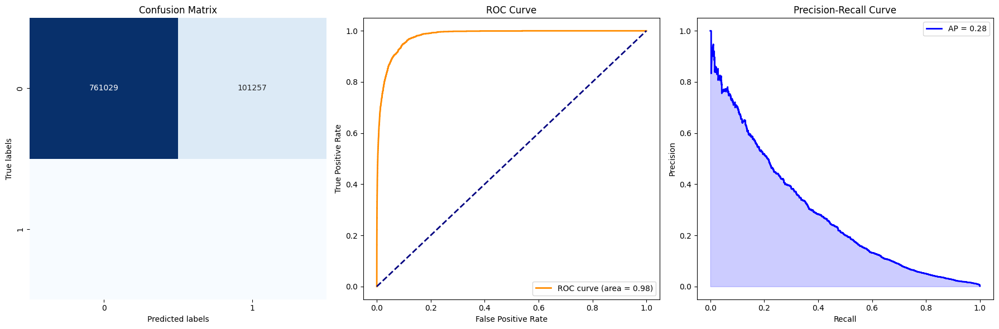

Running XGBoost 10to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.97      0.98    862286
           1       0.05      0.84      0.09      1603

    accuracy                           0.97    863889
   macro avg       0.52      0.91      0.54    863889
weighted avg       1.00      0.97      0.98    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[835584  26702]
 [   250   1353]]


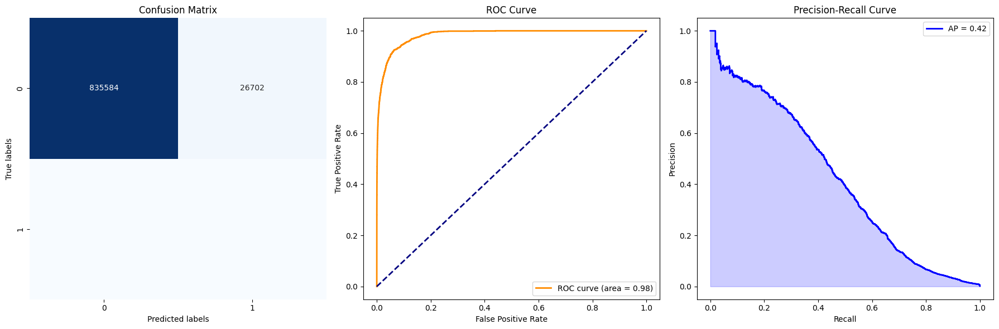

Running XGBoost 20to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.10      0.76      0.17      1603

    accuracy                           0.99    863889
   macro avg       0.55      0.88      0.58    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[850912  11374]
 [   377   1226]]


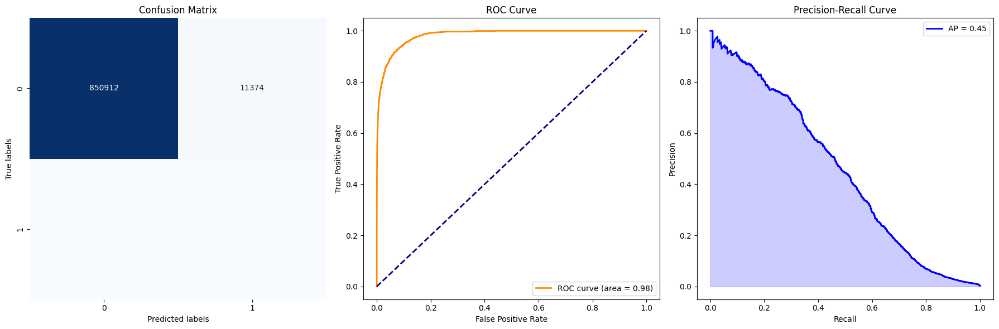

Running XGBoost 30to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.12      0.73      0.21      1603

    accuracy                           0.99    863889
   macro avg       0.56      0.86      0.60    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[853948   8338]
 [   436   1167]]


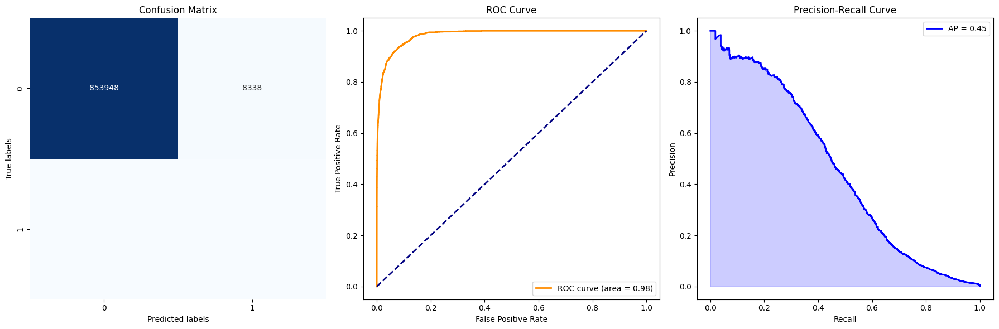

Running XGBoost 60to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.16      0.68      0.26      1603

    accuracy                           0.99    863889
   macro avg       0.58      0.83      0.63    863889
weighted avg       1.00      0.99      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[856678   5608]
 [   519   1084]]


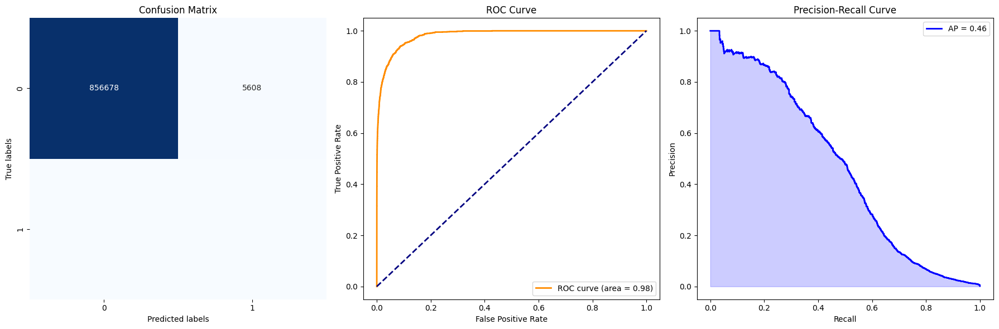

Running XGBoost 80to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.23      0.63      0.33      1603

    accuracy                           1.00    863889
   macro avg       0.61      0.81      0.66    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[858835   3451]
 [   601   1002]]


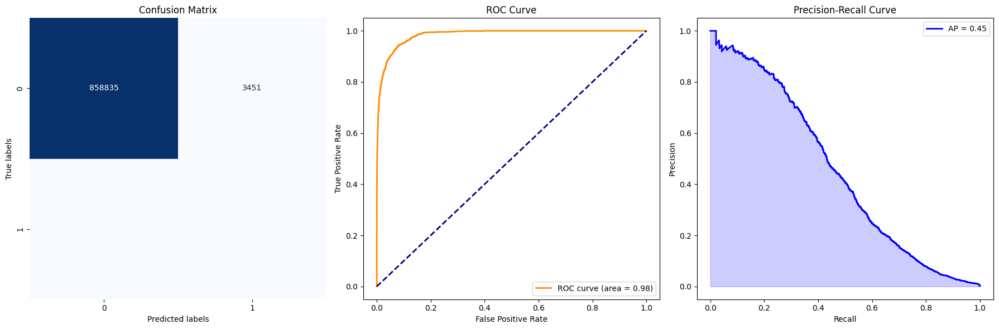

Running XGBoost 100to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.21      0.64      0.32      1603

    accuracy                           0.99    863889
   macro avg       0.61      0.82      0.66    863889
weighted avg       1.00      0.99      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[858424   3862]
 [   571   1032]]


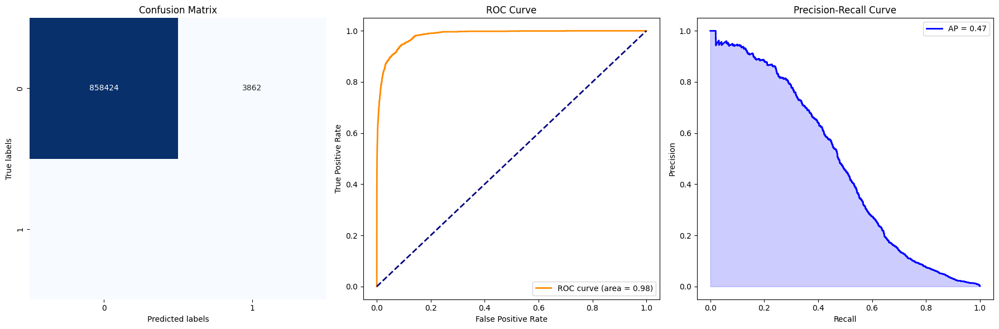

In [275]:
# List of resampled datasets and their names
datasets = [
    (X_train_1_to_1, y_train_1_to_1, "XGBoost 1to1"),
    (X_train_10_to_1, y_train_10_to_1, "XGBoost 10to1"),
    (X_train_20_to_1, y_train_20_to_1, "XGBoost 20to1"),
    (X_train_30_to_1, y_train_30_to_1, "XGBoost 30to1"),
    (X_train_60_to_1, y_train_60_to_1, "XGBoost 60to1"),
    (X_train_80_to_1, y_train_80_to_1, "XGBoost 80to1"),
    (X_train_100_to_1, y_train_100_to_1, "XGBoost 100to1")
]

# Loop through each dataset, train the model, display metrics, and store results
for X_train, y_train, model_name in datasets:
    print(f"Running {model_name} on the resampled dataset...")
    
    clf_xgb = xgb.XGBClassifier(objective='binary:logistic', eval_metric='logloss', use_label_encoder=False, random_state=42)
    clf_xgb.fit(X_train, y_train)
    
    displaymetrics(clf_xgb, X_test, y_test)
    store_results(clf_xgb, model_name, X_test, y_test, results)


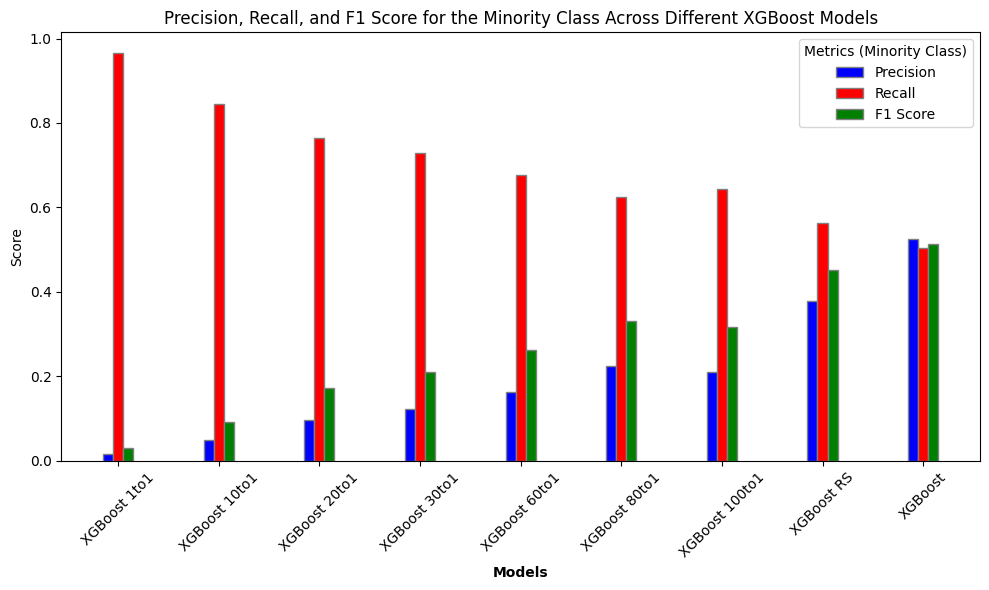

In [353]:
# List of models to be plotted
models_to_plot = [
    "XGBoost 1to1",
    "XGBoost 10to1",
    "XGBoost 20to1",
    "XGBoost 30to1",
    "XGBoost 60to1",
    "XGBoost 80to1",
    "XGBoost 100to1",
    "XGBoost RS",
    "XGBoost"
]

# Extracting precision, recall, and f1 scores for the specified models
precision_scores = [results[model]['precision'] for model in models_to_plot]
recall_scores = [results[model]['recall'] for model in models_to_plot]
f1_scores = [results[model]['f1_minority'] for model in models_to_plot]

# Setting the positions and width for the bars
barWidth = 0.10
r1 = np.arange(len(precision_scores))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Creating the bars for Precision, Recall, and F1 Score
plt.figure(figsize=(10, 6))
plt.bar(r1, precision_scores, color='b', width=barWidth, edgecolor='grey', label='Precision')
plt.bar(r2, recall_scores, color='r', width=barWidth, edgecolor='grey', label='Recall')
plt.bar(r3, f1_scores, color='g', width=barWidth, edgecolor='grey', label='F1 Score')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision_scores))], models_to_plot, rotation=45)
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for the Minority Class Across Different XGBoost Models')
plt.legend(title="Metrics (Minority Class)")
plt.tight_layout()
plt.show()

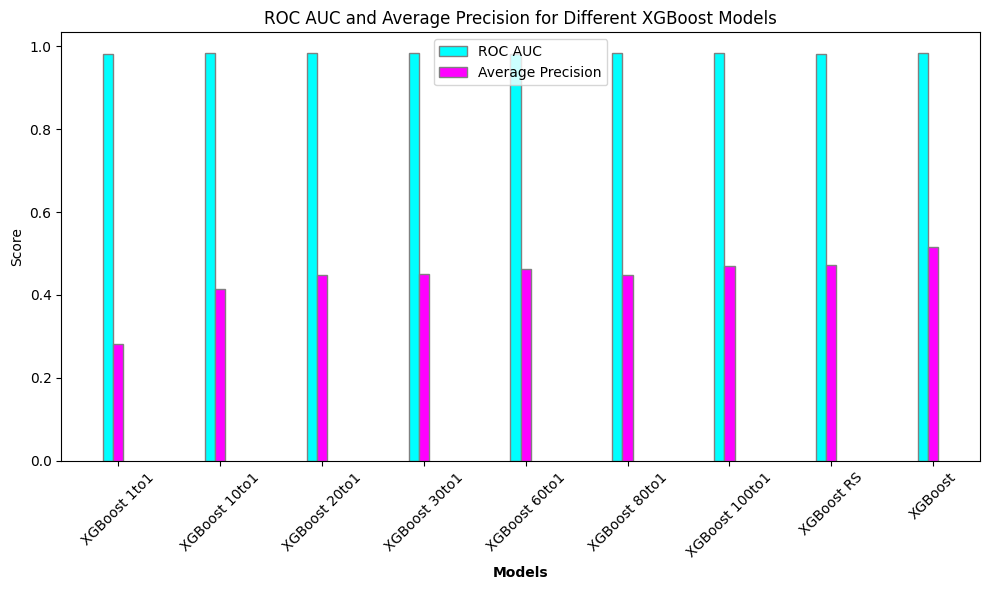

In [369]:
# Extracting ROC AUC and Average Precision for the specified models
roc_auc_scores = [results[model]['roc_auc'] for model in models_to_plot if results[model]['roc_auc'] != "N/A"]
avg_precision_scores = [results[model]['avg_precision'] for model in models_to_plot if results[model]['avg_precision'] != "N/A"]

# Setting the positions and width for the bars
r1 = np.arange(len(roc_auc_scores))
r2 = [x + barWidth for x in r1]

# Creating the bars for ROC AUC and Average Precision
plt.figure(figsize=(10, 6))
plt.bar(r1, roc_auc_scores, color='cyan', width=barWidth, edgecolor='grey', label='ROC AUC')
plt.bar(r2, avg_precision_scores, color='magenta', width=barWidth, edgecolor='grey', label='Average Precision')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(roc_auc_scores))], models_to_plot, rotation=45)
plt.ylabel('Score')
plt.title('ROC AUC and Average Precision for Different XGBoost Models')
plt.legend()
plt.tight_layout()
plt.show()

[LightGBM] [Info] Number of positive: 3027, number of negative: 3027
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001237 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6188
[LightGBM] [Info] Number of data points in the train set: 6054, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.14      0.25    862286
           1       0.00      0.93      0.00      1603

    accuracy                           0.14    863889
   macro avg       0.50      0.54      0.13    863889
weighted avg       1.00      0.14      0.25    863889

----------------------------------------------------------

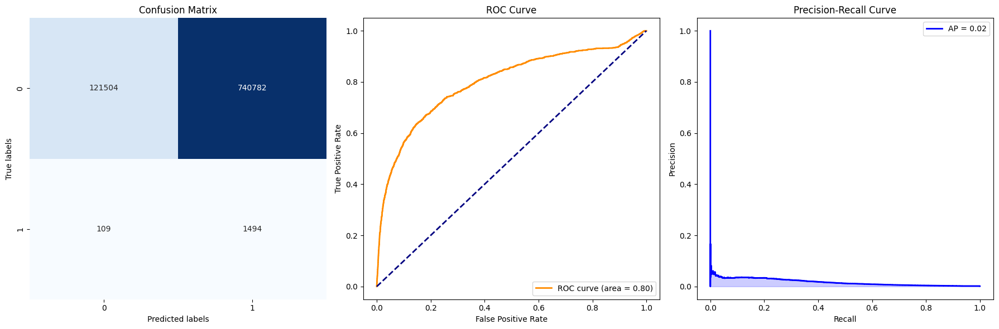

In [202]:
import lightgbm as lgb

clf_lgbm = lgb.LGBMClassifier(random_state=42)
clf_lgbm.fit(X_train_1_to_1_scaled, y_train_1_to_1)

displaymetrics(clf_lgbm, X_test_scaled, y_test)


In [309]:
# 1. Scale X_train and X_test
scaler = StandardScaler().fit(X_train)
X_train_scaled = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)
X_test_scaled = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

# 2. Align Columns and Data Types
reference_cols = X_test_scaled.columns
reference_dtypes = X_test_scaled.dtypes

# Align columns and data types for each resampled scaled training set
X_train_1_to_1_scaled = X_train_1_to_1_scaled[reference_cols].astype(reference_dtypes)
X_train_10_to_1_scaled = X_train_10_to_1_scaled[reference_cols].astype(reference_dtypes)
X_train_20_to_1_scaled = X_train_20_to_1_scaled[reference_cols].astype(reference_dtypes)
X_train_30_to_1_scaled = X_train_30_to_1_scaled[reference_cols].astype(reference_dtypes)
X_train_60_to_1_scaled = X_train_60_to_1_scaled[reference_cols].astype(reference_dtypes)
X_train_80_to_1_scaled = X_train_80_to_1_scaled[reference_cols].astype(reference_dtypes)
X_train_100_to_1_scaled = X_train_100_to_1_scaled[reference_cols].astype(reference_dtypes)

Running LGBM 1to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 3027
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000673 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6188
[LightGBM] [Info] Number of data points in the train set: 6054, number of used features: 43
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.14      0.25    862286
           1       0.00      0.93      0.00      1603

    accuracy                           0.14    863889
   macro avg       0.50      0.54      0.13    863889
weighted avg       1.00      0.14      0

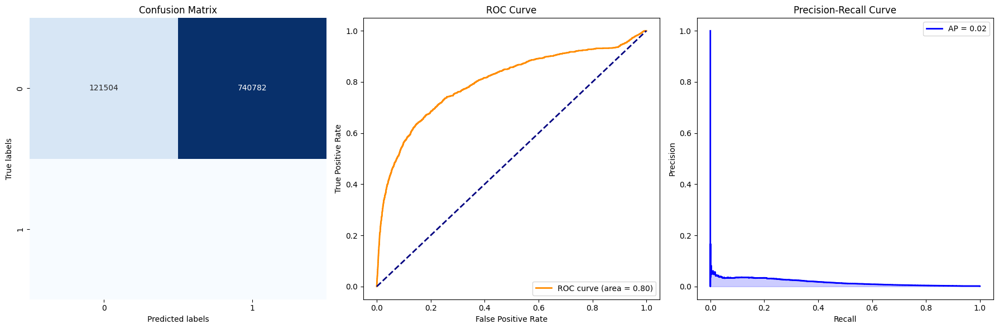

Running LGBM 10to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 30270
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002282 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6625
[LightGBM] [Info] Number of data points in the train set: 33297, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.090909 -> initscore=-2.302585
[LightGBM] [Info] Start training from score -2.302585
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.96      0.98    862286
           1       0.03      0.63      0.05      1603

    accuracy                           0.96    863889
   macro avg       0.51      0.79   

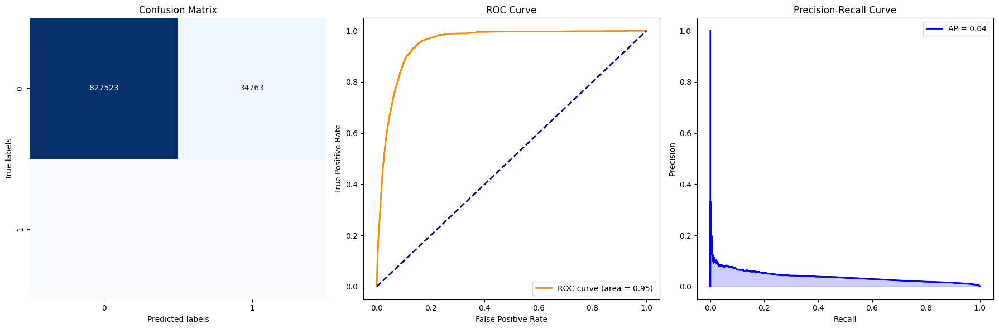

Running LGBM 20to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 60540
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004480 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6819
[LightGBM] [Info] Number of data points in the train set: 63567, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.047619 -> initscore=-2.995732
[LightGBM] [Info] Start training from score -2.995732
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.04      0.30      0.07      1603

    accuracy                           0.98    863889
   macro avg       0.52      0.64   

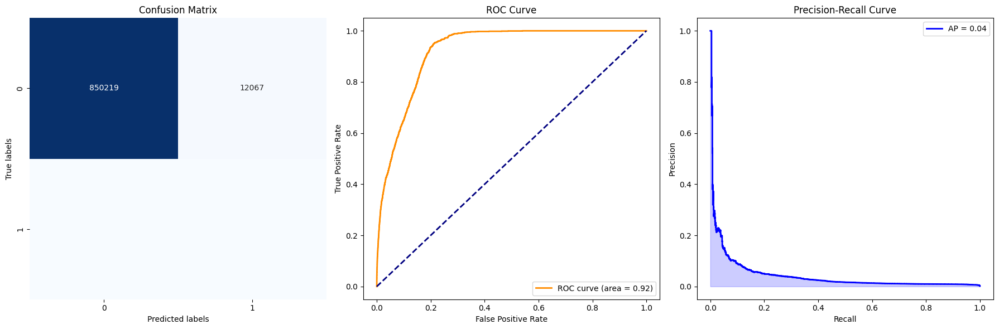

Running LGBM 30to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 90810
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6848
[LightGBM] [Info] Number of data points in the train set: 93837, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.032258 -> initscore=-3.401197
[LightGBM] [Info] Start training from score -3.401197
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.07      0.35      0.11      1603

    accuracy              

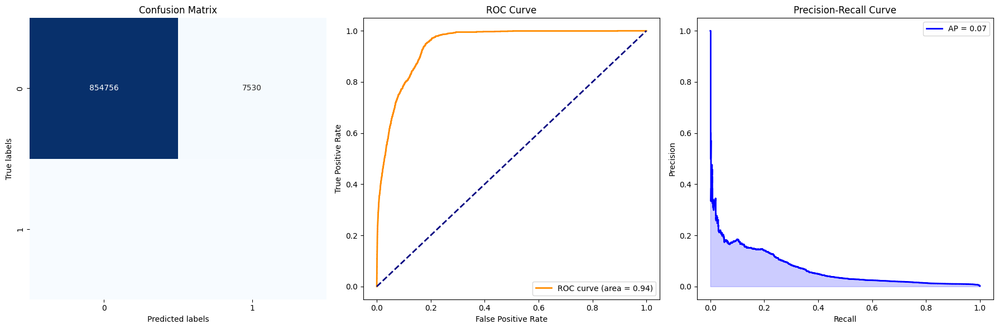

Running LGBM 60to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 181620
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011895 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6900
[LightGBM] [Info] Number of data points in the train set: 184647, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.016393 -> initscore=-4.094345
[LightGBM] [Info] Start training from score -4.094345
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.90      0.95    862286
           1       0.01      0.49      0.02      1603

    accuracy                           0.90    863889
   macro avg       0.50      0.69 

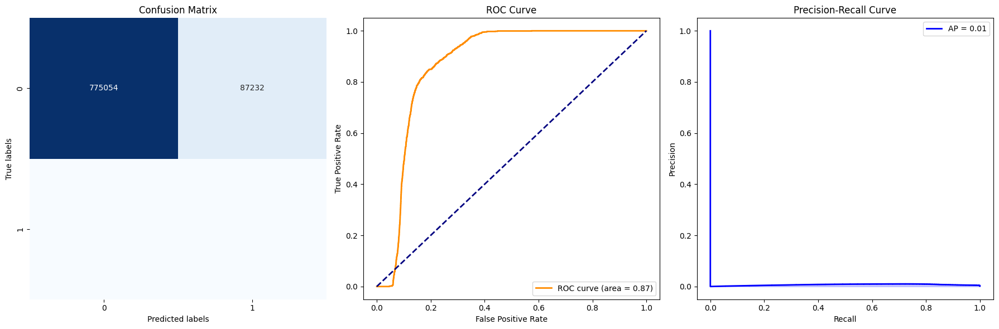

Running LGBM 80to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 242160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6904
[LightGBM] [Info] Number of data points in the train set: 245187, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.012346 -> initscore=-4.382027
[LightGBM] [Info] Start training from score -4.382027
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.06      0.48      0.11      1603

    accuracy                           0.99    863889
   macro avg       0.53      0.73 

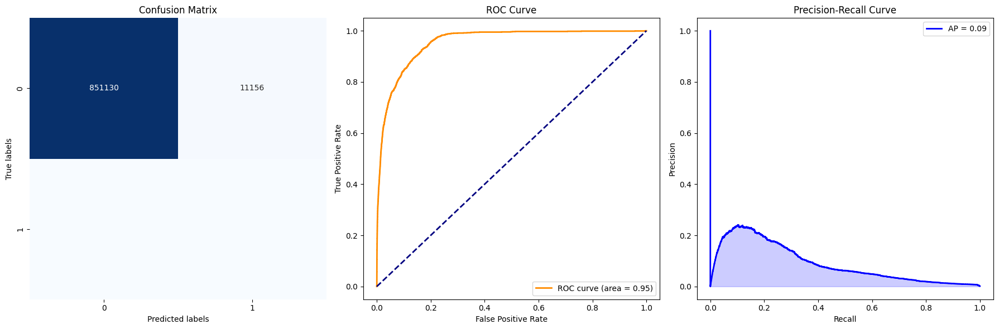

Running LGBM 100to1 on the resampled and scaled dataset...
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 3027, number of negative: 302700
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012000 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6901
[LightGBM] [Info] Number of data points in the train set: 305727, number of used features: 44
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.009901 -> initscore=-4.605170
[LightGBM] [Info] Start training from score -4.605170
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.11      0.63      0.19      1603

    accuracy           

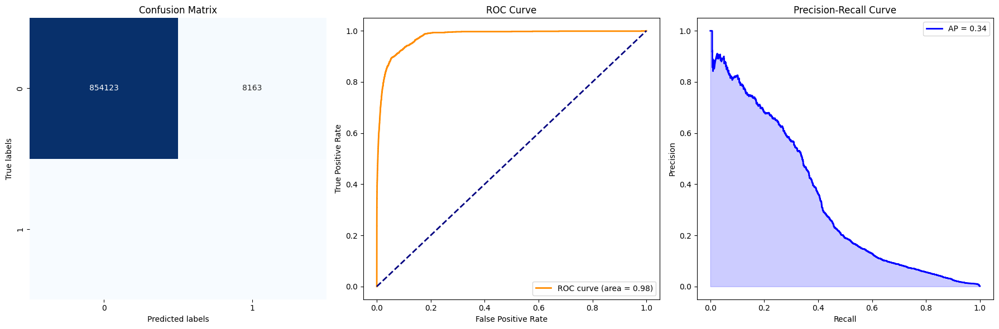

In [310]:
import lightgbm as lgb

# List of resampled and scaled datasets and their names
datasets = [
    (X_train_1_to_1_scaled, y_train_1_to_1, "LGBM 1to1"),
    (X_train_10_to_1_scaled, y_train_10_to_1, "LGBM 10to1"),
    (X_train_20_to_1_scaled, y_train_20_to_1, "LGBM 20to1"),
    (X_train_30_to_1_scaled, y_train_30_to_1, "LGBM 30to1"),
    (X_train_60_to_1_scaled, y_train_60_to_1, "LGBM 60to1"),
    (X_train_80_to_1_scaled, y_train_80_to_1, "LGBM 80to1"),
    (X_train_100_to_1_scaled, y_train_100_to_1, "LGBM 100to1")
]

# Loop through each dataset, train the model, display metrics, and store results
for X_train_scaled, y_train, model_name in datasets:
    print(f"Running {model_name} on the resampled and scaled dataset...")
    
    clf_lgbm = lgb.LGBMClassifier(random_state=42)
    clf_lgbm.fit(X_train_scaled, y_train)
    
    displaymetrics(clf_lgbm, X_test_scaled, y_test)
    store_results(clf_lgbm, model_name, X_test_scaled, y_test, results)


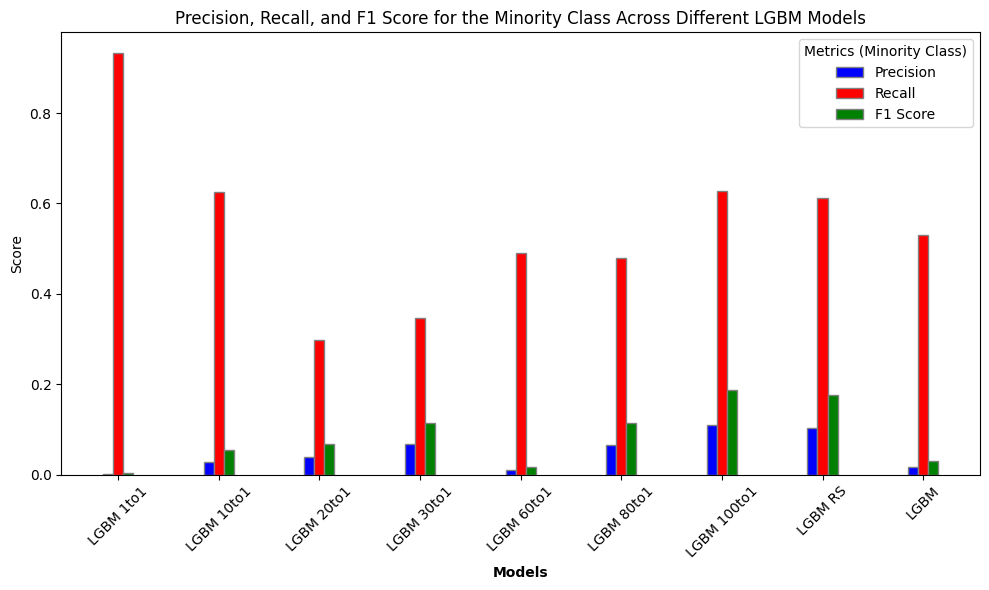

In [373]:
import matplotlib.pyplot as plt
import numpy as np

# List of models to be plotted
models_to_plot = [
    "LGBM 1to1",
    "LGBM 10to1",
    "LGBM 20to1",
    "LGBM 30to1",
    "LGBM 60to1",
    "LGBM 80to1",
    "LGBM 100to1",
    "LGBM RS",
    "LGBM"
]

# Extracting precision, recall, and f1 scores for the specified models
precision_scores = [results[model]['precision'] for model in models_to_plot]
recall_scores = [results[model]['recall'] for model in models_to_plot]
f1_scores = [results[model]['f1_minority'] for model in models_to_plot]

# Setting the positions and width for the bars
barWidth = 0.10
r1 = np.arange(len(precision_scores))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]

# Creating the bars for Precision, Recall, and F1 Score
plt.figure(figsize=(10, 6))
plt.bar(r1, precision_scores, color='b', width=barWidth, edgecolor='grey', label='Precision')
plt.bar(r2, recall_scores, color='r', width=barWidth, edgecolor='grey', label='Recall')
plt.bar(r3, f1_scores, color='g', width=barWidth, edgecolor='grey', label='F1 Score')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(precision_scores))], models_to_plot, rotation=45)
plt.ylabel('Score')
plt.title('Precision, Recall, and F1 Score for the Minority Class Across Different LGBM Models')
plt.legend(title="Metrics (Minority Class)")
plt.tight_layout()
plt.show()

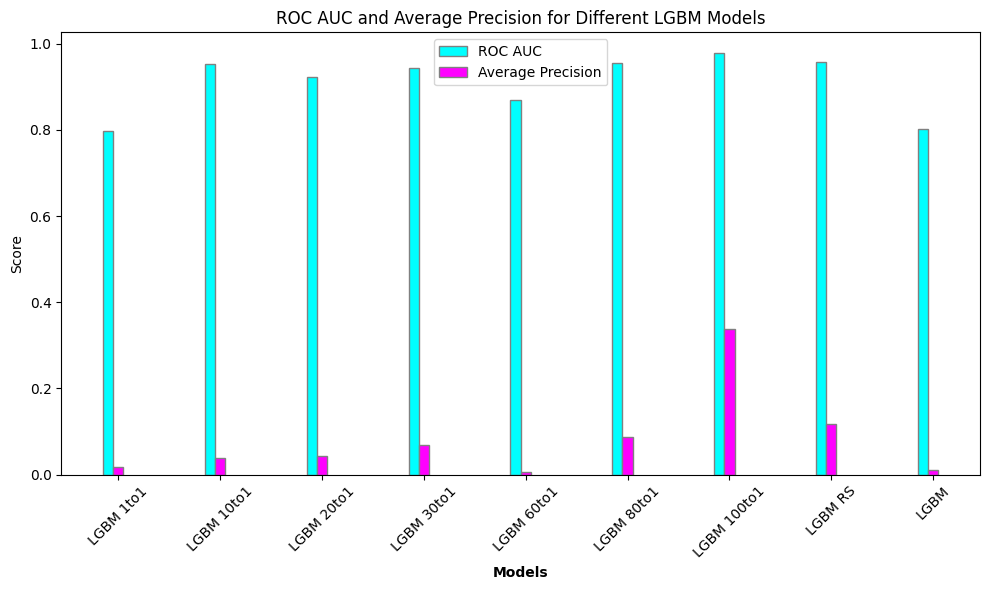

In [374]:
# Extracting ROC AUC and Average Precision for the specified models
roc_auc_scores = [results[model]['roc_auc'] for model in models_to_plot if results[model]['roc_auc'] != "N/A"]
avg_precision_scores = [results[model]['avg_precision'] for model in models_to_plot if results[model]['avg_precision'] != "N/A"]

# Setting the positions and width for the bars
r1 = np.arange(len(roc_auc_scores))
r2 = [x + barWidth for x in r1]

# Creating the bars for ROC AUC and Average Precision
plt.figure(figsize=(10, 6))
plt.bar(r1, roc_auc_scores, color='cyan', width=barWidth, edgecolor='grey', label='ROC AUC')
plt.bar(r2, avg_precision_scores, color='magenta', width=barWidth, edgecolor='grey', label='Average Precision')

# Adding the labels
plt.xlabel('Models', fontweight='bold')
plt.xticks([r + barWidth for r in range(len(roc_auc_scores))], models_to_plot, rotation=45)
plt.ylabel('Score')
plt.title('ROC AUC and Average Precision for Different LGBM Models')
plt.legend()
plt.tight_layout()
plt.show()

Running SVM 1to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.75      0.86    862286
           1       0.01      0.99      0.01      1603

    accuracy                           0.75    863889
   macro avg       0.50      0.87      0.44    863889
weighted avg       1.00      0.75      0.86    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[646274 216012]
 [    17   1586]]


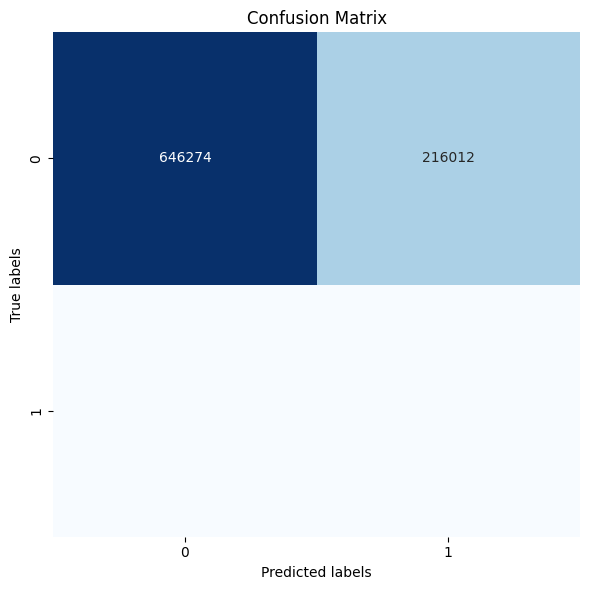

Running SVM 10to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.92      0.96    862286
           1       0.01      0.56      0.02      1603

    accuracy                           0.92    863889
   macro avg       0.51      0.74      0.49    863889
weighted avg       1.00      0.92      0.96    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[792487  69799]
 [   713    890]]


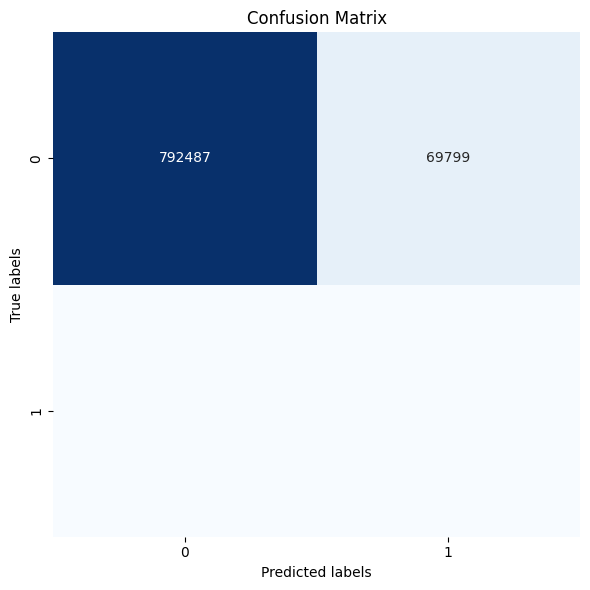

Running SVM 20to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.94      0.97    862286
           1       0.00      0.05      0.00      1603

    accuracy                           0.94    863889
   macro avg       0.50      0.50      0.49    863889
weighted avg       1.00      0.94      0.97    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[813820  48466]
 [  1523     80]]


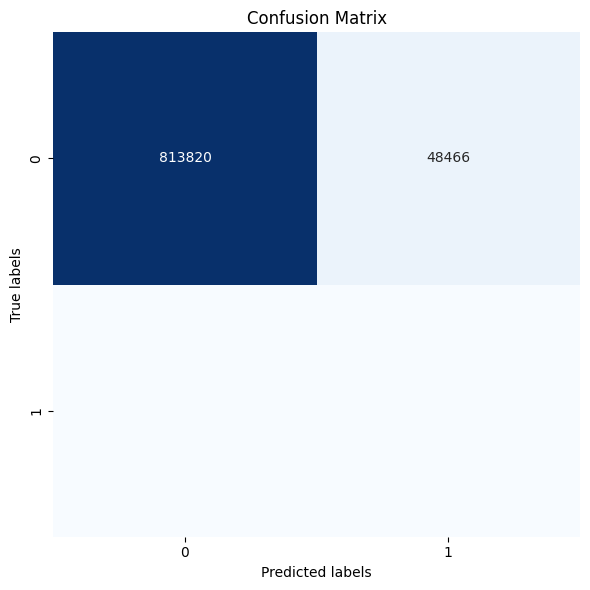

Running SVM 30to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.94      0.97    862286
           1       0.00      0.08      0.00      1603

    accuracy                           0.93    863889
   macro avg       0.50      0.51      0.49    863889
weighted avg       1.00      0.93      0.96    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[807186  55100]
 [  1481    122]]


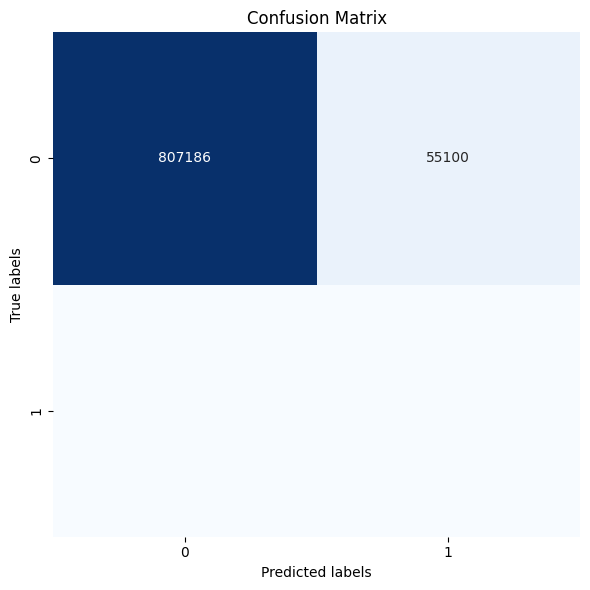

Running SVM 60to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.10      0.01      0.02      1603

    accuracy                           1.00    863889
   macro avg       0.55      0.51      0.51    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862123    163]
 [  1585     18]]


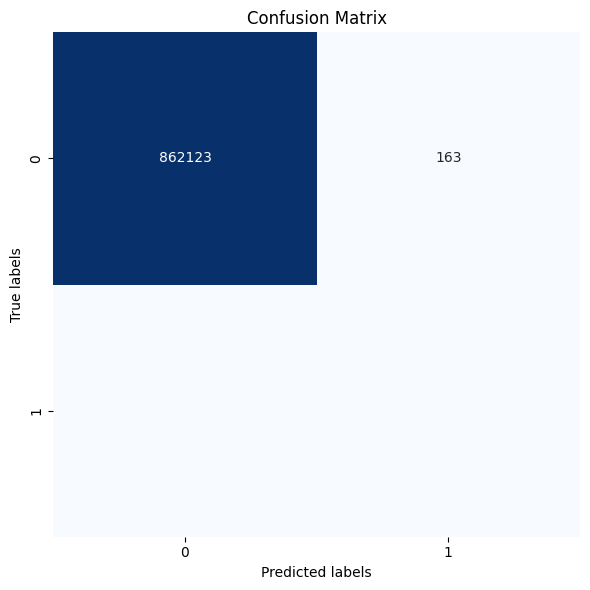

Running SVM 80to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.01      0.03      0.02      1603

    accuracy                           0.99    863889
   macro avg       0.51      0.52      0.51    863889
weighted avg       1.00      0.99      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[858390   3896]
 [  1547     56]]


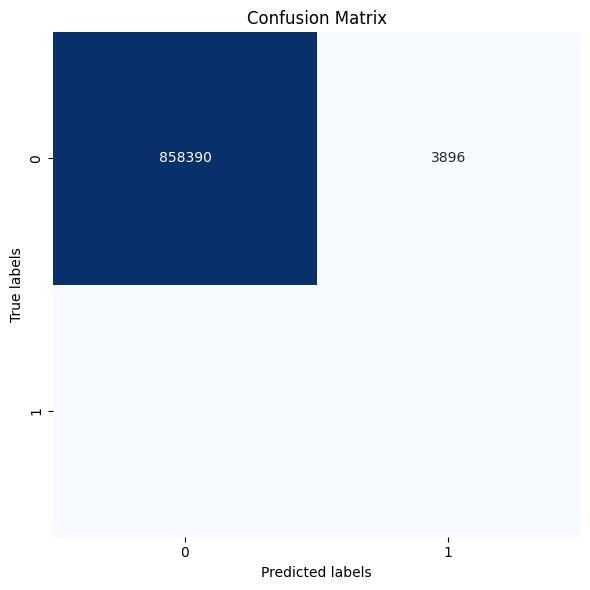

Running SVM 100to1 on the resampled dataset...
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.02      0.00      0.00      1603

    accuracy                           1.00    863889
   macro avg       0.51      0.50      0.50    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862233     53]
 [  1602      1]]


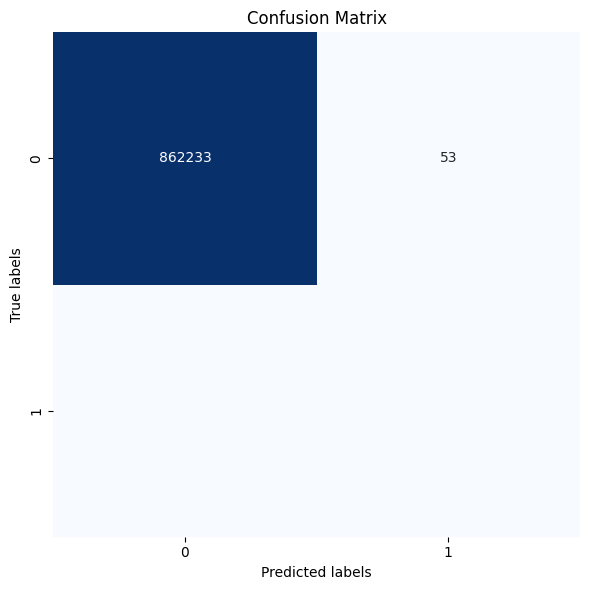

In [312]:
from sklearn.linear_model import SGDClassifier

# List of resampled datasets and their names
datasets = [
    (X_train_1_to_1_scaled, y_train_1_to_1, "SVM 1to1"),
    (X_train_10_to_1_scaled, y_train_10_to_1, "SVM 10to1"),
    (X_train_20_to_1_scaled, y_train_20_to_1, "SVM 20to1"),
    (X_train_30_to_1_scaled, y_train_30_to_1, "SVM 30to1"),
    (X_train_60_to_1_scaled, y_train_60_to_1, "SVM 60to1"),
    (X_train_80_to_1_scaled, y_train_80_to_1, "SVM 80to1"),
    (X_train_100_to_1_scaled, y_train_100_to_1, "SVM 100to1")
]

# Train the SGDClassifier with hinge loss on each dataset, display metrics, and store results
for X_train_resampled, y_train_resampled, model_name in datasets:
    print(f"Running {model_name} on the resampled dataset...")
    
    clf_svm_sgd = SGDClassifier(loss='hinge', max_iter=1000, random_state=42)
    clf_svm_sgd.fit(X_train_resampled, y_train_resampled)
    
    displaymetrics(clf_svm_sgd, X_test_scaled, y_test)
    store_results(clf_svm_sgd, model_name, X_test_scaled, y_test, results)


Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.93      0.96    862286
           1       0.00      0.09      0.00      1603

    accuracy                           0.93    863889
   macro avg       0.50      0.51      0.48    863889
weighted avg       1.00      0.93      0.96    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[801633  60653]
 [  1454    149]]


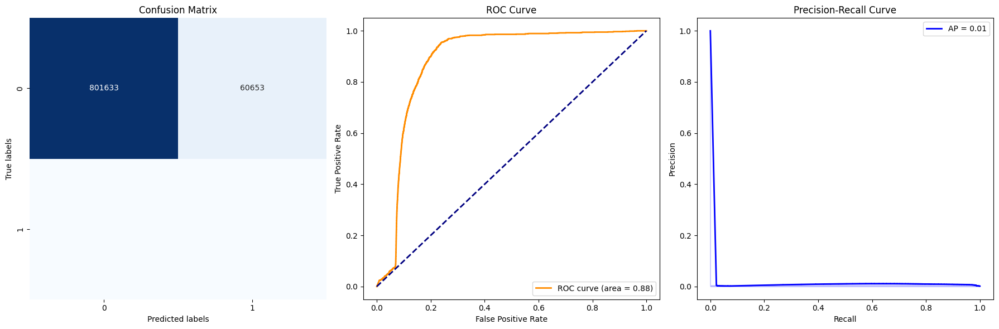

In [315]:
from sklearn.linear_model import LogisticRegression
# Fit the scaler on X_train_100_to_1 and then transform X_test
scaler = StandardScaler().fit(X_train_100_to_1)
X_test_scaled = scaler.transform(X_test)

# Convert the scaled data back to a DataFrame to maintain feature names
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Ensure the columns of X_test_scaled are in the same order as X_train_30_to_1_scaled
X_test_scaled = X_test_scaled[X_train_100_to_1_scaled.columns]

# Initialize the logistic regression model
logreg = LogisticRegression(max_iter=1000, solver='lbfgs', random_state=42)

# Fit the model on the scaled 100_to_1 training set
logreg.fit(X_train_100_to_1_scaled, y_train_100_to_1)

# Predict on the scaled test set
y_pred_logreg = logreg.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
displaymetrics(logreg, X_test_scaled, y_test)
store_results(logreg, "Logistic Regression 100to1", X_test_scaled, y_test, results)

Results for L1 Regularization (Lasso):
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.01      0.04      0.01      1603

    accuracy                           0.98    863889
   macro avg       0.50      0.51      0.50    863889
weighted avg       1.00      0.98      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[849628  12658]
 [  1535     68]]


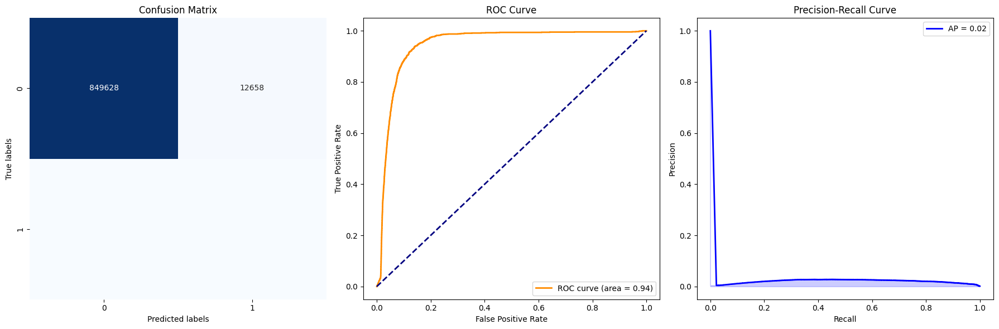


Results for L2 Regularization (Ridge):
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.93      0.96    862286
           1       0.00      0.09      0.00      1603

    accuracy                           0.93    863889
   macro avg       0.50      0.51      0.48    863889
weighted avg       1.00      0.93      0.96    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[801633  60653]
 [  1454    149]]


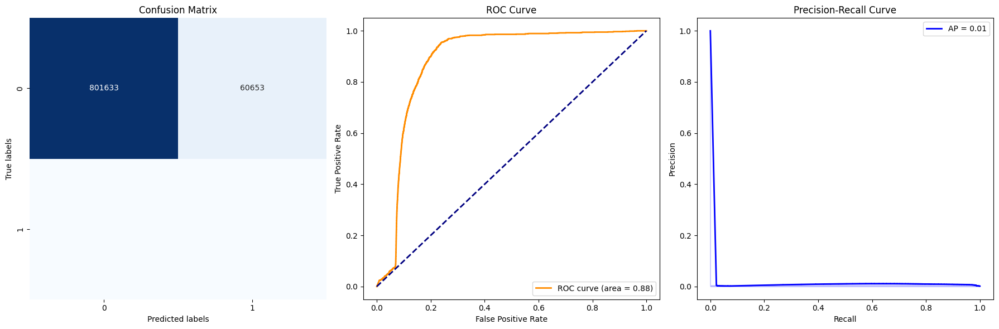

In [317]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression

# Scaling the data
# Fit the scaler on X_train_100_to_1 and then transform X_test
scaler = StandardScaler().fit(X_train_100_to_1)
X_test_scaled = scaler.transform(X_test)

# Convert the scaled data back to a DataFrame to maintain feature names
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

# Ensure the columns of X_test_scaled are in the same order as X_train_100_to_1_scaled
X_test_scaled = X_test_scaled[X_train_100_to_1_scaled.columns]

# L1 Regularisation (Lasso)
# Initialize the logistic regression model with L1 regularisation
logreg_l1 = LogisticRegression(max_iter=5000, solver='saga', penalty='l1', C=1.0, random_state=42)

# Fit the model on the scaled 100_to_1 training set
logreg_l1.fit(X_train_100_to_1_scaled, y_train_100_to_1)

# Predict on the scaled test set
y_pred_logreg_l1 = logreg_l1.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
print("Results for L1 Regularization (Lasso):")
displaymetrics(logreg_l1, X_test_scaled, y_test)
store_results(logreg_l1, "Logistic Regression L1 100to1", X_test_scaled, y_test, results)
# L2 Regularisation (Ridge)
# Initialize the logistic regression model with L2 regularisation
logreg_l2 = LogisticRegression(max_iter=5000, solver='lbfgs', penalty='l2', C=1.0, random_state=42)

# Fit the model on the scaled 100_to_1 training set
logreg_l2.fit(X_train_100_to_1_scaled, y_train_100_to_1)

# Predict on the scaled test set
y_pred_logreg_l2 = logreg_l2.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
print("\nResults for L2 Regularization (Ridge):")
displaymetrics(logreg_l2, X_test_scaled, y_test)
store_results(logreg_l2, "Logistic Regression L2 100to1", X_test_scaled, y_test, results)

Results for L1 Regularization (Lasso):
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.01      0.03      0.01      1603

    accuracy                           0.99    863889
   macro avg       0.50      0.51      0.50    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[852329   9957]
 [  1552     51]]


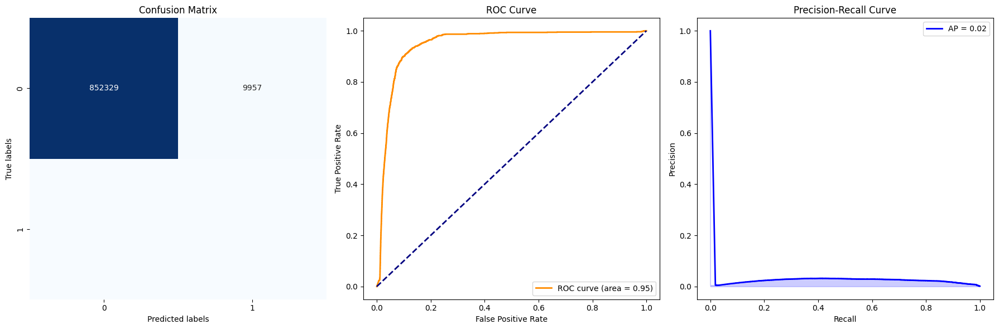


Results for L2 Regularization (Ridge):
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      0.99    862286
           1       0.01      0.04      0.01      1603

    accuracy                           0.98    863889
   macro avg       0.50      0.51      0.50    863889
weighted avg       1.00      0.98      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[850087  12199]
 [  1538     65]]


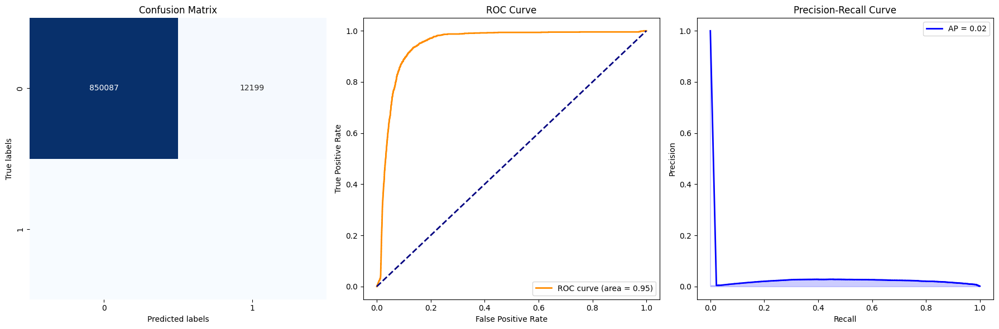

In [359]:

# L1 Regularization (Lasso)
# Initialize the logistic regression model with L1 regularisation
logreg_l1c = LogisticRegression(max_iter=5000, solver='saga', penalty='l1', C=0.01, random_state=42)

# Fit the model on the scaled 100_to_1 training set
logreg_l1c.fit(X_train_100_to_1_scaled, y_train_100_to_1)

# Predict on the scaled test set
y_pred_logreg_l1 = logreg_l1c.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
print("Results for L1 Regularization (Lasso):")
displaymetrics(logreg_l1c, X_test_scaled, y_test)
store_results(logreg_l1c, "Logistic Regression L1c 100to1", X_test_scaled, y_test, results)

# L2 Regularization (Ridge)
# Initialize the logistic regression model with L2 regularisation
logreg_l2c = LogisticRegression(max_iter=5000, solver='lbfgs', penalty='l2', C=0.01, random_state=42)

# Fit the model on the scaled 100_to_1 training set
logreg_l2c.fit(X_train_100_to_1_scaled, y_train_100_to_1)

# Predict on the scaled test set
y_pred_logreg_l2 = logreg_l2c.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
print("\nResults for L2 Regularization (Ridge):")
displaymetrics(logreg_l2c, X_test_scaled, y_test)
store_results(logreg_l2c, "Logistic Regression L2c 100to1", X_test_scaled, y_test, results)

Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.89      0.94    862286
           1       0.01      0.53      0.02      1603

    accuracy                           0.89    863889
   macro avg       0.50      0.71      0.48    863889
weighted avg       1.00      0.89      0.94    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[770336  91950]
 [   756    847]]


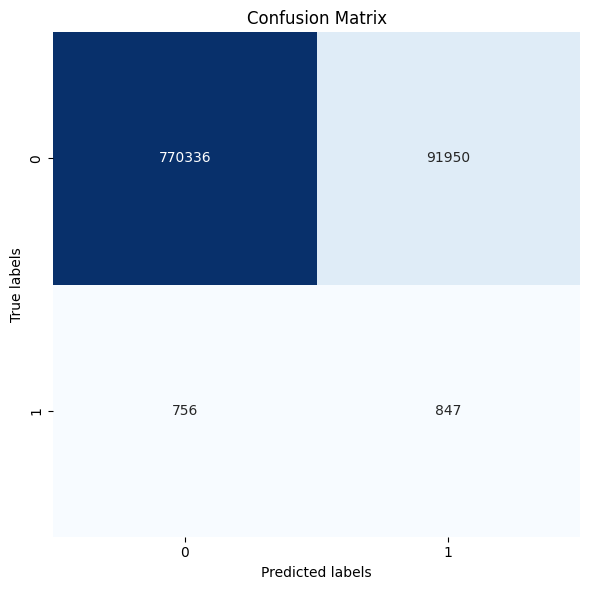

In [246]:
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC

# Exclude the specified features if they exist
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

for feature in exclude_features:
    if feature in X_train_10_to_1.columns:
        X_train_10_to_1 = X_train_10_to_1.drop(columns=[feature])
    if feature in X_test.columns:
        X_test = X_test.drop(columns=[feature])

# If 'IsPotentialSmurfing' is present in the datasets, convert it to int
if 'IsPotentialSmurfing' in X_train_10_to_1.columns:
    X_train_10_to_1['IsPotentialSmurfing'] = X_train_10_to_1['IsPotentialSmurfing'].astype(int)
if 'IsPotentialSmurfing' in X_test.columns:
    X_test['IsPotentialSmurfing'] = X_test['IsPotentialSmurfing'].astype(int)

# Scaling the data
# Fit the scaler on X_train_10_to_1 and then transform X_test
scaler = StandardScaler().fit(X_train_10_to_1)
X_test_scaled = scaler.transform(X_test)
X_train_10_to_1_scaled = scaler.transform(X_train_10_to_1)

# Convert the scaled data back to a DataFrame to maintain feature names
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)
X_train_10_to_1_scaled = pd.DataFrame(X_train_10_to_1_scaled, columns=X_train_10_to_1.columns)

# Initialize the SVM model
svm_clf = SVC(kernel='linear', random_state=42)

# Fit the model on the scaled 10_to_1 training set
svm_clf.fit(X_train_10_to_1_scaled, y_train_10_to_1)

# Predict on the scaled test set
y_pred_svm = svm_clf.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
displaymetrics(svm_clf, X_test_scaled, y_test)



Results for SVM with polynomial kernel:
--------------------------------------------------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.05      0.18      0.08      1603

    accuracy                           0.99    863889
   macro avg       0.53      0.58      0.54    863889
weighted avg       1.00      0.99      0.99    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[857140   5146]
 [  1321    282]]


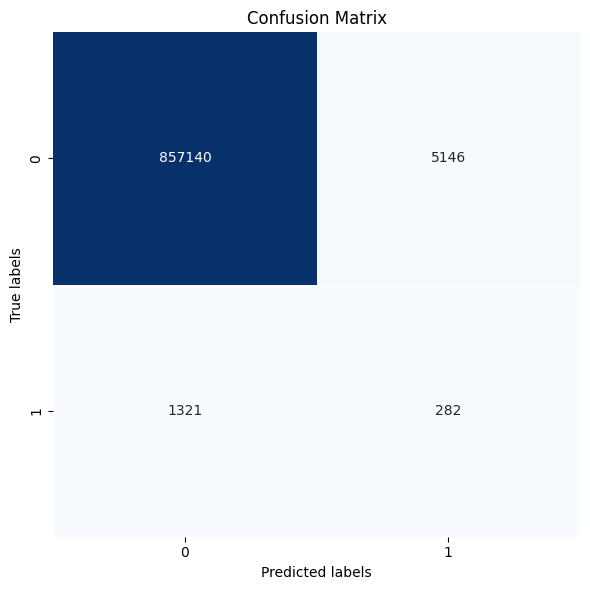

In [247]:
print("\nResults for SVM with polynomial kernel:")
print('-'*80)

# Initialize the SVM model with polynomial kernel and regularization
svm_poly = SVC(kernel='poly', C=0.1, random_state=42)

# Fit the model on the scaled 10_to_1 training set
svm_poly.fit(X_train_10_to_1_scaled, y_train_10_to_1)

# Predict on the scaled test set
y_pred_poly = svm_poly.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
displaymetrics(svm_poly, X_test_scaled, y_test)



Results for SVM with RBF kernel:
--------------------------------------------------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.99      1.00    862286
           1       0.08      0.22      0.11      1603

    accuracy                           0.99    863889
   macro avg       0.54      0.61      0.56    863889
weighted avg       1.00      0.99      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[857941   4345]
 [  1244    359]]


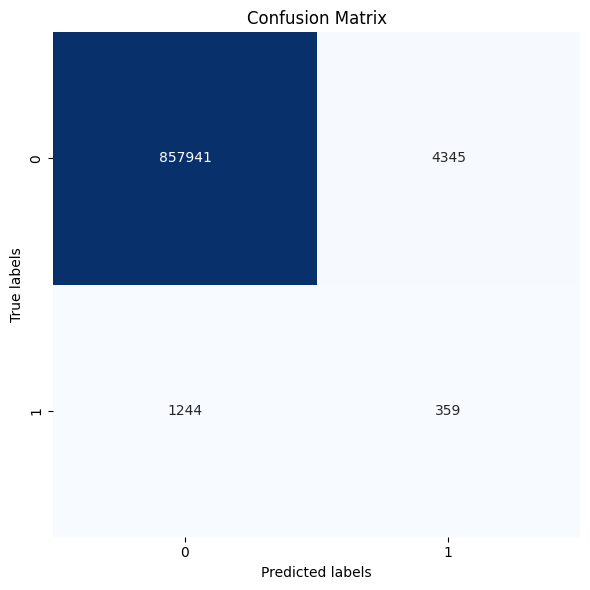

In [248]:
print("\nResults for SVM with RBF kernel:")
print('-'*80)

# Initialize the SVM model with RBF kernel and regularization
svm_rbf = SVC(kernel='rbf', C=0.1, random_state=42)

# Fit the model on the scaled 10_to_1 training set
svm_rbf.fit(X_train_10_to_1_scaled, y_train_10_to_1)

# Predict on the scaled test set
y_pred_rbf = svm_rbf.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
displaymetrics(svm_rbf, X_test_scaled, y_test)



Results for SVM with sigmoid kernel:
--------------------------------------------------------------------------------
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      0.94      0.97    862286
           1       0.01      0.37      0.02      1603

    accuracy                           0.93    863889
   macro avg       0.50      0.65      0.49    863889
weighted avg       1.00      0.93      0.96    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[806828  55458]
 [  1005    598]]


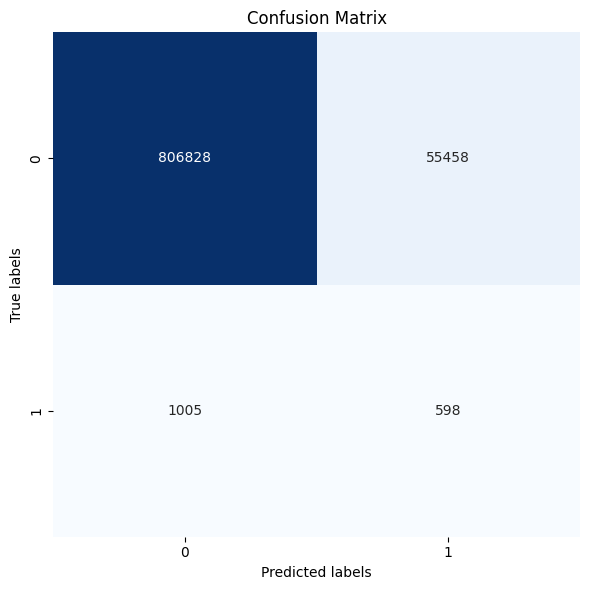

In [249]:
print("\nResults for SVM with sigmoid kernel:")
print('-'*80)

# Initialize the SVM model with sigmoid kernel and regularization
svm_sigmoid = SVC(kernel='sigmoid', C=0.1, random_state=42)

# Fit the model on the scaled 10_to_1 training set
svm_sigmoid.fit(X_train_10_to_1_scaled, y_train_10_to_1)

# Predict on the scaled test set
y_pred_sigmoid = svm_sigmoid.predict(X_test_scaled)

# Use the existing displaymetrics function to show the results
displaymetrics(svm_sigmoid, X_test_scaled, y_test)


[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=  34.8s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=  53.7s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=  34.1s
[CV] END bootstrap=True, max_depth=10, min_samples_leaf=1, min_samples_split=10, n_estimators=100; total time=  54.8s
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.33      0.57      0.42      1603

    accuracy                           1.00    863889
   macro avg       0.66      0.79      0.71    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confus

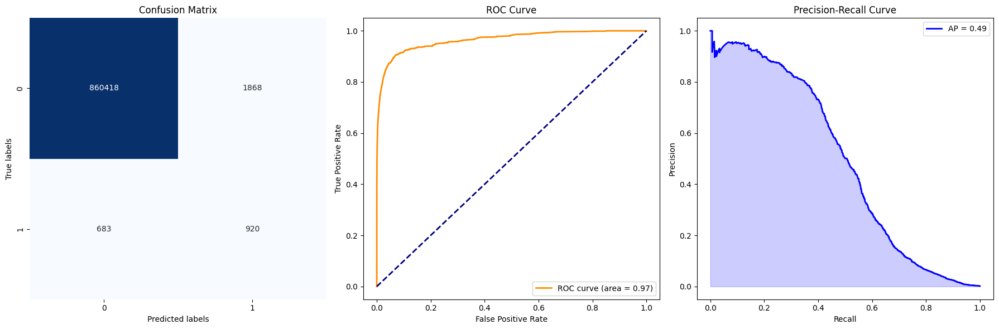

[CV] END bootstrap=False, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=  11.5s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=  41.0s
[CV] END bootstrap=False, max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time= 2.2min
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=  39.5s
[CV] END bootstrap=False, max_depth=None, min_samples_leaf=4, min_samples_split=5, n_estimators=10; total time=  12.0s
[CV] END bootstrap=False, max_depth=10, min_samples_leaf=2, min_samples_split=2, n_estimators=200; total time= 2.3min
[CV] END bootstrap=False, max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=10; total time=  11.1s
[CV] END bootstrap=True, max_depth=None, min_samples_leaf=1, min_samples_split=10, n_estimators=50; total time=  40.3s
[CV] END bootstrap=False, max_depth=10, min_samples_le

In [172]:
from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest classifier with the best parameters
rf_best = RandomForestClassifier(
    n_estimators=50,
    min_samples_split=2,
    min_samples_leaf=2,
    max_depth=None,
    bootstrap=False,
    random_state=42
)

# Train the model on the 100_to_1 dataset
rf_best.fit(X_train_100_to_1, y_train_100_to_1)

# Predict on the test set
y_pred_rf_best = rf_best.predict(X_test)

# Display metrics using your function
displaymetrics(rf_best, X_test, y_test)


Fitting 3 folds for each of 10 candidates, totalling 30 fits
Best Parameters: {'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 30, 'bootstrap': False}
Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.31      0.59      0.40      1603

    accuracy                           1.00    863889
   macro avg       0.65      0.79      0.70    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[860149   2137]
 [   663    940]]


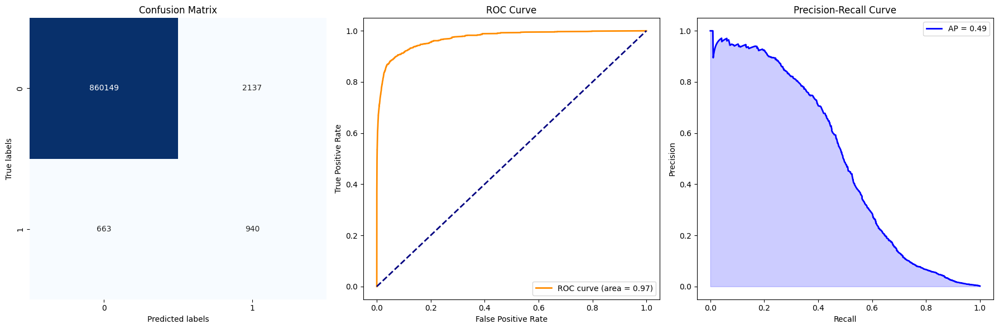

[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time= 2.0min
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150; total time= 2.9min
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=  36.1s
[CV] END bootstrap=True, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=  40.1s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=150; total time= 3.0min
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=50; total time=  53.8s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=50; total time=  39.3s
[CV] END bootstrap=False, max_depth=30, max_featu

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import make_scorer, f1_score

# Define the parameter grid
param_dist = {
    'n_estimators': [50, 100, 150],
    'max_features': ['sqrt'], 
    'max_depth': [10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

# Initialize the Random Forest classifier
rf = RandomForestClassifier()

# Define the scoring metric
f1_scorer = make_scorer(f1_score, average='macro')

# Initialize the RandomizedSearchCV
random_search = RandomizedSearchCV(rf, param_distributions=param_dist, 
                                   n_iter=10, scoring=f1_scorer, 
                                   cv=3, verbose=2, random_state=42, n_jobs=-1)

# Fit the model
random_search.fit(X_train_100_to_1, y_train_100_to_1)

# Print the best parameters
print("Best Parameters:", random_search.best_params_)

# Use the best estimator from the RandomizedSearchCV to make predictions on the test set
best_rf = random_search.best_estimator_

y_pred_best_rf = best_rf.predict(X_test)

# Display metrics using your function
displaymetrics(best_rf, X_test, y_test)


Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.85      0.37      0.52      1603

    accuracy                           1.00    863889
   macro avg       0.92      0.69      0.76    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[862180    106]
 [  1009    594]]


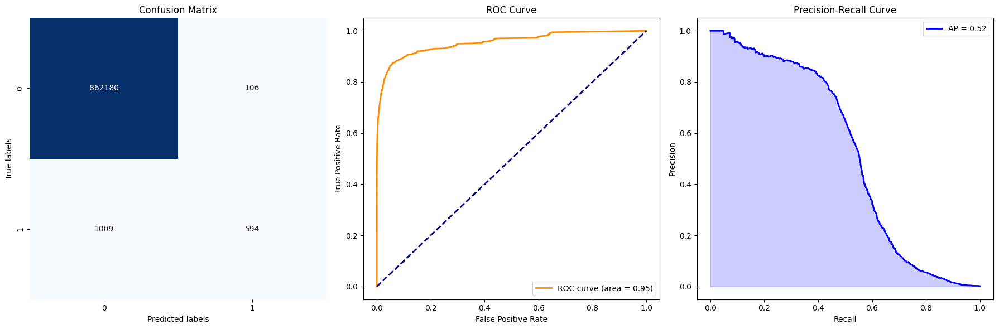

In [177]:
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

# Drop the specified features from the datasets if they exist
X_train = X_train.drop(columns=[col for col in exclude_features if col in X_train.columns])

from sklearn.ensemble import RandomForestClassifier

# Initialize the Random Forest classifier with the best parameters
rf_best = RandomForestClassifier(
    n_estimators=50,
    min_samples_split=2,
    min_samples_leaf=2,
    max_features='sqrt',
    max_depth=30,
    bootstrap=False
)

# Fit the model on the training data
rf_best.fit(X_train, y_train)

# Display metrics using the displaymetrics function
displaymetrics(rf_best, X_test, y_test)


Feature: unique_banks_24h, Importance: 0.06196760048871326
Feature: log Amount Received, Importance: 0.04124665498970671
Feature: log Amount Paid, Importance: 0.040744519306905834
Feature: AmountReceivedDeviation, Importance: 0.039407857052743675
Feature: AvgTimeDifference, Importance: 0.03917427120335681
Feature: RelativeAmountReceived, Importance: 0.038637487539175695
Feature: TotalLogAmountPaid, Importance: 0.03838652712809508
Feature: StructuringScore, Importance: 0.03792275035831196
Feature: TimeSinceFirstTransaction, Importance: 0.03760399279669876
Feature: Amount Received_monthly_avg, Importance: 0.03691892156318939
Feature: TotalLogAmountReceived, Importance: 0.03686243827017184
Feature: AvgAmountReceived_7days, Importance: 0.036650146833833566
Feature: TimeSinceLastTransaction, Importance: 0.031494377950011226
Feature: ReceivedAmountMean, Importance: 0.031398124551675066
Feature: ReceivedAmountStdDev, Importance: 0.02826092667796067
Feature: AvgNeighborDegree, Importance: 0.02

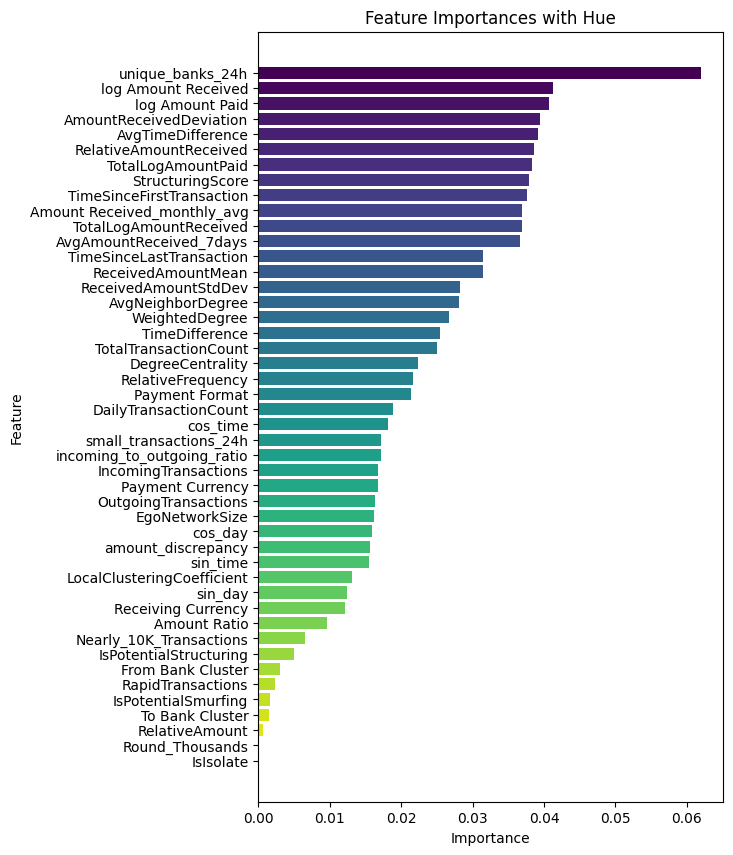

In [190]:
# Get feature importances
importances = rf_best.feature_importances_

# Pair each feature with its importance
feature_importance_pairs = list(zip(X_train.columns, importances))

# Sort the features based on importance
sorted_feature_importance_pairs = sorted(feature_importance_pairs, key=lambda x: x[1], reverse=True)

# Display the sorted features and their importances
for feature, importance in sorted_feature_importance_pairs:
    print(f"Feature: {feature}, Importance: {importance}")

# Plotting with hue
features, importances = zip(*sorted_feature_importance_pairs)
plt.figure(figsize=(6, 10))

# Using a colormap to get a range of colors
colors = plt.cm.viridis(np.linspace(0, 1, len(features)))

# Plotting the bar chart with the colors
plt.barh(features, importances, color=colors)

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances with Hue')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


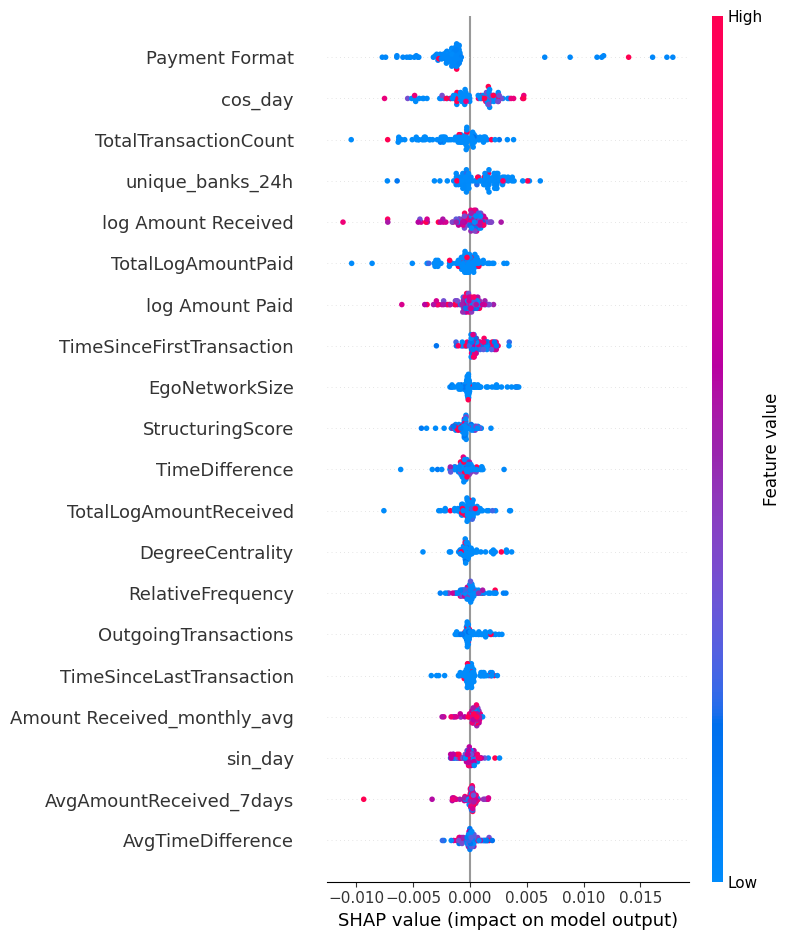

In [204]:
import shap

# Initialize the explainer
explainer = shap.TreeExplainer(rf_best)

# Compute SHAP values for a sample of the data (for performance reasons)
shap_values = explainer.shap_values(X_train.sample(100))

# Plot the SHAP values for a single prediction
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1][0], X_train.sample(100).iloc[0])

# Plot the summary of SHAP values (average impact on model output magnitude)
shap.summary_plot(shap_values[1], X_train.sample(100))


In [205]:
import lime
from lime.lime_tabular import LimeTabularExplainer

# Convert the DataFrame to a numpy array
X_train_np = X_train.values

# Initialize the explainer
explainer = LimeTabularExplainer(X_train_np, 
                                 feature_names=X_train.columns.tolist(), 
                                 class_names=['Negative', 'Positive'], 
                                 verbose=True, 
                                 mode='classification')

# Explain a single prediction
i = 10  # index of the instance to be explained
exp = explainer.explain_instance(X_train_np[i], rf_best.predict_proba)
exp.show_in_notebook(show_table=True, show_all=False)


Intercept 0.05981379280502936
Prediction_local [0.0676899]
Right: 0.0006111684915773914


X does not have valid feature names, but RandomForestClassifier was fitted with feature names


In [217]:
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.metrics import classification_report

# Define the parameter grid
param_dist = {
    'n_estimators': [50, 100, 200],  
    'learning_rate': [0.01, 0.05, 0.1],  
    'max_depth': [3, 4, 5, 6],  
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'gamma': [0, 0.1],  
    'alpha': [0, 0.1, 0.5],  # L1 regularization
    'lambda': [1, 1.5, 2],  # L2 regularization
}

# Initialize the classifier
xgb_clf = XGBClassifier()

# Stratified K-Fold for cross-validation
stratified_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

# Use RandomizedSearchCV
random_search = RandomizedSearchCV(
    xgb_clf, 
    param_distributions=param_dist, 
    n_iter=10, 
    scoring='f1_macro',  # Using macro F1 score as the scoring metric
    cv=stratified_kfold, 
    verbose=1, 
    n_jobs=-1, 
    random_state=42
)

# Fit the model
random_search.fit(X_train, y_train)

# Evaluate the best model
best_xgb = random_search.best_estimator_
y_pred = best_xgb.predict(X_test)
print(classification_report(y_test, y_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits


A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.


              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.58      0.50      0.54      1603

    accuracy                           1.00    863889
   macro avg       0.79      0.75      0.77    863889
weighted avg       1.00      1.00      1.00    863889



Classification Report (Test Set):
--------------------------------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.58      0.50      0.54      1603

    accuracy                           1.00    863889
   macro avg       0.79      0.75      0.77    863889
weighted avg       1.00      1.00      1.00    863889

--------------------------------------------------------------------------------

Confusion Matrix (Text Format):
[[861717    569]
 [   807    796]]


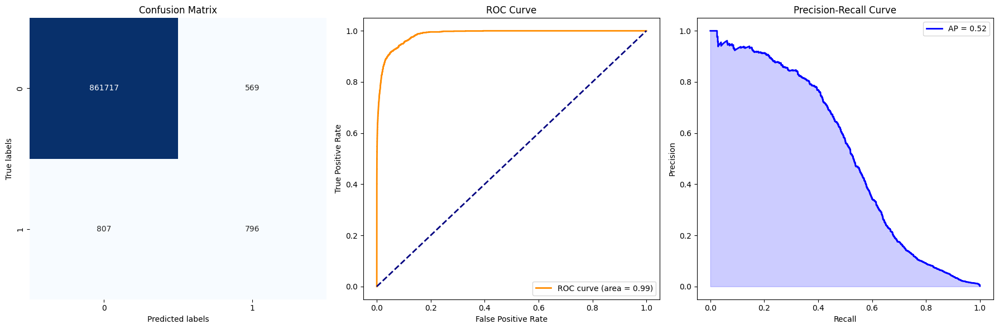

In [219]:
# Display metrics
displaymetrics(best_xgb, X_test, y_test)

Best Parameters from Randomized Search:
{'subsample': 0.9, 'n_estimators': 200, 'max_depth': 6, 'learning_rate': 0.1, 'lambda': 1.5, 'gamma': 0.1, 'colsample_bytree': 0.8, 'alpha': 0.5}
Feature: Payment Format, Importance: 0.17270253598690033
Feature: IsPotentialSmurfing, Importance: 0.13633036613464355
Feature: unique_banks_24h, Importance: 0.046870388090610504
Feature: RapidTransactions, Importance: 0.039811648428440094
Feature: Amount Ratio, Importance: 0.03900595009326935
Feature: cos_day, Importance: 0.03701798990368843
Feature: incoming_to_outgoing_ratio, Importance: 0.03549017384648323
Feature: DailyTransactionCount, Importance: 0.03397934138774872
Feature: amount_discrepancy, Importance: 0.033865537494421005
Feature: TimeSinceLastTransaction, Importance: 0.03114793635904789
Feature: StructuringScore, Importance: 0.02984188124537468
Feature: RelativeAmount, Importance: 0.028318867087364197
Feature: TotalTransactionCount, Importance: 0.02737971767783165
Feature: OutgoingTransacti

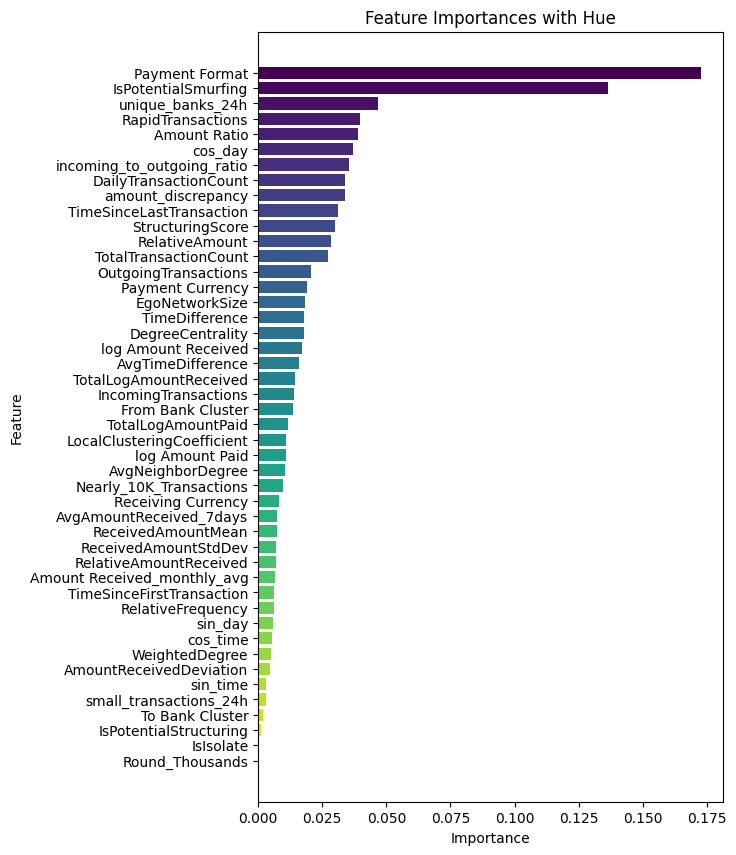

In [222]:
# Get feature importances from XGBoost
importances = best_xgb.feature_importances_


# Print the best parameters
print("Best Parameters from Randomized Search:")
print(random_search.best_params_)


# Pair each feature with its importance
feature_importance_pairs = list(zip(X_train.columns, importances))

# Sort the features based on importance
sorted_feature_importance_pairs = sorted(feature_importance_pairs, key=lambda x: x[1], reverse=True)

# Display the sorted features and their importances
for feature, importance in sorted_feature_importance_pairs:
    print(f"Feature: {feature}, Importance: {importance}")

# Plotting with hue
import matplotlib.pyplot as plt

features, importances = zip(*sorted_feature_importance_pairs)
plt.figure(figsize=(6, 10))

# Using a colormap to get a range of colors
colors = plt.cm.viridis(np.linspace(0, 1, len(features)))

# Plotting the bar chart with the colors
plt.barh(features, importances, color=colors)

plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importances with Hue')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()


In [408]:
# Create copies of train_df and test_df
train_df_copy = train_df.copy()
test_df_copy = test_df.copy()

In [409]:
train_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3732489 entries, 0 to 3732488
Data columns (total 55 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    category
 1   Account                      category
 2   To Bank                      category
 3   To_Account                   category
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   Is Laundering                int64   
 10  log Amount Received          float64 
 11  log Amount Paid              float64 
 12  DayOfWeek                    int32   
 13  IncomingTransactions         int64   
 14  OutgoingTransactions         int64   
 15  DegreeCentrality             float64 
 16  TimeSinceFirstTransaction    float64 
 17  Nearly_10K_Transactions      int64   
 18  LocalClusteringCoefficient 

In [410]:
test_df_copy = test_df_copy[train_df_copy.columns]


In [411]:
test_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 863889 entries, 0 to 517833
Data columns (total 55 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   From Bank                    863889 non-null  category
 1   Account                      863889 non-null  category
 2   To Bank                      863889 non-null  category
 3   To_Account                   863889 non-null  category
 4   Amount Received              863889 non-null  float64 
 5   Receiving Currency           863889 non-null  float64 
 6   Amount Paid                  863889 non-null  float64 
 7   Payment Currency             863889 non-null  float64 
 8   Payment Format               863889 non-null  float64 
 9   Is Laundering                863889 non-null  category
 10  log Amount Received          863889 non-null  float64 
 11  log Amount Paid              863889 non-null  float64 
 12  DayOfWeek                    863889 non-null  int

In [412]:
launderingpatterns = launderingpatterns.rename(columns={'Account_1': 'To_Account'})


In [413]:
launderingpatterns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3209 entries, 0 to 3208
Data columns (total 12 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Timestamp           3209 non-null   object 
 1   From Bank           3209 non-null   int64  
 2   Account             3209 non-null   object 
 3   To Bank             3209 non-null   int64  
 4   To_Account          3209 non-null   object 
 5   Amount Received     3209 non-null   float64
 6   Receiving Currency  3209 non-null   object 
 7   Amount Paid         3209 non-null   float64
 8   Payment Currency    3209 non-null   object 
 9   Payment Format      3209 non-null   object 
 10  Is Laundering       3209 non-null   int64  
 11  Laundering Type     3209 non-null   object 
dtypes: float64(2), int64(3), object(7)
memory usage: 301.0+ KB


In [414]:
print('LaunderingType' in launderingpatterns.columns)


False


In [415]:
# Define the columns to merge on
merge_cols = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 'Amount Paid']

# Merge only the 'Laundering Type' column from launderingpatterns with train_df_copy and test_df_copy
train_df_copy = train_df_copy.merge(launderingpatterns[merge_cols + ['Laundering Type']], on=merge_cols, how='left')
test_df_copy = test_df_copy.merge(launderingpatterns[merge_cols + ['Laundering Type']], on=merge_cols, how='left')

# Fill NaN values in the 'Laundering Type' column with 'NaN' string for non-laundering transactions
train_df_copy['Laundering Type'].fillna('NaN', inplace=True)
test_df_copy['Laundering Type'].fillna('NaN', inplace=True)


In [416]:
train_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3732489 entries, 0 to 3732488
Data columns (total 56 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    int64   
 1   Account                      string  
 2   To Bank                      int64   
 3   To_Account                   string  
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   Is Laundering                int64   
 10  log Amount Received          float64 
 11  log Amount Paid              float64 
 12  DayOfWeek                    int32   
 13  IncomingTransactions         int64   
 14  OutgoingTransactions         int64   
 15  DegreeCentrality             float64 
 16  TimeSinceFirstTransaction    float64 
 17  Nearly_10K_Transactions      int64   
 18  LocalClusteringCoeffic

In [417]:
test_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 863889 entries, 0 to 863888
Data columns (total 56 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   From Bank                    863889 non-null  int64   
 1   Account                      863889 non-null  string  
 2   To Bank                      863889 non-null  int64   
 3   To_Account                   863889 non-null  string  
 4   Amount Received              863889 non-null  float64 
 5   Receiving Currency           863889 non-null  float64 
 6   Amount Paid                  863889 non-null  float64 
 7   Payment Currency             863889 non-null  float64 
 8   Payment Format               863889 non-null  float64 
 9   Is Laundering                863889 non-null  category
 10  log Amount Received          863889 non-null  float64 
 11  log Amount Paid              863889 non-null  float64 
 12  DayOfWeek                    863889 non-null

In [419]:
# Count where 'Is Laundering' is 1 in train_df_copy
train_is_laundering_count = train_df_copy[train_df_copy['Is Laundering'] == 1].shape[0]
print(f"Count of 'Is Laundering' = 1 in train_df_copy: {train_is_laundering_count}")

# Count where 'Is Laundering' is 1 in test_df_copy
test_is_laundering_count = test_df_copy[test_df_copy['Is Laundering'] == 1].shape[0]
print(f"Count of 'Is Laundering' = 1 in test_df_copy: {test_is_laundering_count}")

# Count of each laundering pattern in train_df_copy excluding 'NaN'
train_laundering_pattern_counts = train_df_copy[train_df_copy['Laundering Type'] != 'NaN']['Laundering Type'].value_counts()
print(f"\nCount of each laundering pattern in train_df_copy (excluding 'NaN'):\n{train_laundering_pattern_counts}")

# Count of each laundering pattern in test_df_copy excluding 'NaN'
test_laundering_pattern_counts = test_df_copy[test_df_copy['Laundering Type'] != 'NaN']['Laundering Type'].value_counts()
print(f"\nCount of each laundering pattern in test_df_copy (excluding 'NaN'):\n{test_laundering_pattern_counts}")


Count of 'Is Laundering' = 1 in train_df_copy: 3027
Count of 'Is Laundering' = 1 in test_df_copy: 1603

Count of each laundering pattern in train_df_copy (excluding 'NaN'):
Laundering Type
SCATTER-GATHER    327
GATHER-SCATTER    281
STACK             272
FAN-OUT           182
BIPARTITE         173
FAN-IN            161
CYCLE             151
RANDOM             94
Name: count, dtype: int64

Count of each laundering pattern in test_df_copy (excluding 'NaN'):
Laundering Type
GATHER-SCATTER    373
SCATTER-GATHER    239
FAN-OUT           131
FAN-IN            123
STACK             117
CYCLE              99
RANDOM             84
BIPARTITE          66
Name: count, dtype: int64


In [420]:
# Count of each laundering pattern in launderingpatterns
laundering_patterns_count = launderingpatterns['Laundering Type'].value_counts()

print("Count of each laundering pattern in launderingpatterns:")
print(laundering_patterns_count)


Count of each laundering pattern in launderingpatterns:
Laundering Type
GATHER-SCATTER    716
SCATTER-GATHER    626
STACK             466
FAN-OUT           342
FAN-IN            318
CYCLE             287
BIPARTITE         263
RANDOM            191
Name: count, dtype: int64


In [423]:
train_df_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3732489 entries, 0 to 3732488
Data columns (total 56 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    int64   
 1   Account                      string  
 2   To Bank                      int64   
 3   To_Account                   string  
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   Is Laundering                int64   
 10  log Amount Received          float64 
 11  log Amount Paid              float64 
 12  DayOfWeek                    int32   
 13  IncomingTransactions         int64   
 14  OutgoingTransactions         int64   
 15  DegreeCentrality             float64 
 16  TimeSinceFirstTransaction    float64 
 17  Nearly_10K_Transactions      int64   
 18  LocalClusteringCoeffic

In [428]:
# For train_df_copy
X_train = train_df_copy.drop(columns=['Is Laundering'])
y_train = train_df_copy['Is Laundering']

# For test_df_copy
X_test = test_df_copy.drop(columns=['Is Laundering'])
y_test = test_df_copy['Is Laundering']


In [429]:
X_test_with_labels = X_test.copy()


X_train = X_train.drop(columns=['Laundering Type'])
X_test = X_test.drop(columns=['Laundering Type'])

# # ... Train and evaluate your model ...

# # Step 3: Post-Prediction Analysis
# X_test_with_labels['Predictions'] = predictions  # Assuming 'predictions' contains the model's predictions


In [430]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3732489 entries, 0 to 3732488
Data columns (total 54 columns):
 #   Column                       Dtype   
---  ------                       -----   
 0   From Bank                    int64   
 1   Account                      string  
 2   To Bank                      int64   
 3   To_Account                   string  
 4   Amount Received              float64 
 5   Receiving Currency           float64 
 6   Amount Paid                  float64 
 7   Payment Currency             float64 
 8   Payment Format               float64 
 9   log Amount Received          float64 
 10  log Amount Paid              float64 
 11  DayOfWeek                    int32   
 12  IncomingTransactions         int64   
 13  OutgoingTransactions         int64   
 14  DegreeCentrality             float64 
 15  TimeSinceFirstTransaction    float64 
 16  Nearly_10K_Transactions      int64   
 17  LocalClusteringCoefficient   float64 
 18  WeightedDegree        

In [431]:
X_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 863889 entries, 0 to 863888
Data columns (total 54 columns):
 #   Column                       Non-Null Count   Dtype   
---  ------                       --------------   -----   
 0   From Bank                    863889 non-null  int64   
 1   Account                      863889 non-null  string  
 2   To Bank                      863889 non-null  int64   
 3   To_Account                   863889 non-null  string  
 4   Amount Received              863889 non-null  float64 
 5   Receiving Currency           863889 non-null  float64 
 6   Amount Paid                  863889 non-null  float64 
 7   Payment Currency             863889 non-null  float64 
 8   Payment Format               863889 non-null  float64 
 9   log Amount Received          863889 non-null  float64 
 10  log Amount Paid              863889 non-null  float64 
 11  DayOfWeek                    863889 non-null  int32   
 12  IncomingTransactions         863889 non-null

In [432]:
datasets = {'X_train': X_train, 'X_test': X_test}

for name, dataset in datasets.items():
    print(f"Dataset: {name}")
    
    # Check for NaN values
    nan_cols = dataset.columns[dataset.isna().any()].tolist()
    if nan_cols:
        print(f"Columns with NaN values in {name}: {nan_cols}")
    else:
        print(f"No NaN values in {name}.")
    
    # Check for infinite values in numerical columns
    numerical_cols = dataset.select_dtypes(include=[np.number])
    inf_cols = numerical_cols.columns[np.isinf(numerical_cols).any()].tolist()
    if inf_cols:
        print(f"Columns with infinite values in {name} (numerical columns only): {inf_cols}")
    else:
        print(f"No infinite values in {name} (numerical columns only).")
    
    print("------")


Dataset: X_train
No NaN values in X_train.
No infinite values in X_train (numerical columns only).
------
Dataset: X_test
No NaN values in X_test.
Columns with infinite values in X_test (numerical columns only): ['RelativeFrequency']
------


In [433]:
datasets = {'X_train': X_train, 'X_test': X_test}

all_match = True
for name, dataset in datasets.items():
    if not X_train.dtypes.equals(dataset.dtypes):
        print(f"There are discrepancies in data types between X_train and {name}.")
        all_match = False

if all_match:
    print("Data types of all columns in all datasets match!")


Data types of all columns in all datasets match!


In [434]:
# Replacing infinite values with NaN in the RelativeFrequency column for each dataset
for dataset in [X_train, X_test]:
    dataset['RelativeFrequency'].replace([np.inf, -np.inf], np.nan, inplace=True)

# Imputing NaN values with the mean of the non-infinite values in the RelativeFrequency column
mean_relative_frequency = X_train['RelativeFrequency'].mean()

for dataset in [X_train, X_test]:
    dataset['RelativeFrequency'].fillna(mean_relative_frequency, inplace=True)


In [435]:
datasets = {'X_train': X_train, 'X_test': X_test}

for name, dataset in datasets.items():
    print(f"Dataset: {name}")
    
    # Check for NaN values
    nan_cols = dataset.columns[dataset.isna().any()].tolist()
    if nan_cols:
        print(f"Columns with NaN values in {name}: {nan_cols}")
    else:
        print(f"No NaN values in {name}.")
    
    # Check for infinite values in numerical columns
    numerical_cols = dataset.select_dtypes(include=[np.number])
    inf_cols = numerical_cols.columns[np.isinf(numerical_cols).any()].tolist()
    if inf_cols:
        print(f"Columns with infinite values in {name} (numerical columns only): {inf_cols}")
    else:
        print(f"No infinite values in {name} (numerical columns only).")
    
    print("------")


Dataset: X_train
No NaN values in X_train.
No infinite values in X_train (numerical columns only).
------
Dataset: X_test
No NaN values in X_test.
No infinite values in X_test (numerical columns only).
------


In [437]:
# Exclude the specified features if they exist
exclude_features = ['From Bank', 'Account', 'To Bank', 'To_Account', 'Amount Received', 
                    'ReceivedAmountMedian','Amount Paid', 'DayOfWeek']

for feature in exclude_features:
    if feature in X_train.columns:
        X_train = X_train.drop(columns=[feature])
    if feature in X_test.columns:
        X_test = X_test.drop(columns=[feature])

# Initialise the Random Forest classifier with the best parameters
rf = RandomForestClassifier(
    n_estimators=50,
    min_samples_split=2,
    min_samples_leaf=2,
    max_features='sqrt',
    max_depth=30,
    bootstrap=False,
    random_state=42  # for reproducibility
)

# Training the model on the training data
rf.fit(X_train, y_train)

# Predicting on the test set
y_pred = rf.predict(X_test)

# Printing the classification report and confusion matrix
print("Classification Report:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

# Map the predictions to the copy of X_test with laundering labels
X_test_with_labels['Predictions'] = y_pred

# Count the number of each laundering pattern correctly identified
correctly_identified = X_test_with_labels[
    (X_test_with_labels['Laundering Type'] != 'NaN') & 
    (X_test_with_labels['Predictions'] == 1)
]['Laundering Type'].value_counts()

print("\nCounts of each laundering pattern correctly identified:")
print(correctly_identified)

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.84      0.35      0.49      1603

    accuracy                           1.00    863889
   macro avg       0.92      0.67      0.75    863889
weighted avg       1.00      1.00      1.00    863889


Confusion Matrix:
[[862183    103]
 [  1047    556]]

Counts of each laundering pattern correctly identified:
Laundering Type
GATHER-SCATTER    197
SCATTER-GATHER    117
FAN-OUT            78
FAN-IN             47
STACK              46
CYCLE              28
RANDOM             22
BIPARTITE          21
Name: count, dtype: int64


In [440]:
# Convert 'IsPotentialSmurfing' to integer type for both X_train and X_test
X_train['IsPotentialSmurfing'] = X_train['IsPotentialSmurfing'].astype(int)
X_test['IsPotentialSmurfing'] = X_test['IsPotentialSmurfing'].astype(int)

# Initialise the XGBoost classifier with the provided parameters
xgb_model = xgb.XGBClassifier(
    subsample=0.9,
    n_estimators=200,
    max_depth=6,
    learning_rate=0.1,
    reg_lambda=1.5,
    gamma=0.1,
    colsample_bytree=0.8,
    reg_alpha=0.5,
    objective='binary:logistic',
    random_state=42  # for reproducibility
)

# Train the model on the training data
xgb_model.fit(X_train, y_train)

# Predict on the test set
y_pred_xgb = xgb_model.predict(X_test)

# Print the classification report and confusion matrix
print("Classification Report for XGBoost:")
print(classification_report(y_test, y_pred_xgb))

print("\nConfusion Matrix for XGBoost:")
print(confusion_matrix(y_test, y_pred_xgb))

# Map the predictions to the copy of X_test with laundering labels
X_test_with_labels['Predictions_XGB'] = y_pred_xgb

# Count the number of each laundering pattern correctly identified by XGBoost
correctly_identified_xgb = X_test_with_labels[
    (X_test_with_labels['Laundering Type'] != 'NaN') & 
    (X_test_with_labels['Predictions_XGB'] == 1)
]['Laundering Type'].value_counts()

print("\nCounts of each laundering pattern correctly identified by XGBoost:")
print(correctly_identified_xgb)


Classification Report for XGBoost:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    862286
           1       0.66      0.51      0.57      1603

    accuracy                           1.00    863889
   macro avg       0.83      0.75      0.79    863889
weighted avg       1.00      1.00      1.00    863889


Confusion Matrix for XGBoost:
[[861876    410]
 [   793    810]]

Counts of each laundering pattern correctly identified by XGBoost:
Laundering Type
GATHER-SCATTER    282
SCATTER-GATHER    155
FAN-OUT           125
FAN-IN             71
STACK              56
RANDOM             47
CYCLE              45
BIPARTITE          27
Name: count, dtype: int64


## Results

XGBoost with hyperparameter tuning came out on top — F1 of 0.57, ROC-AUC of 0.99 on 
normal data. Random Forest was close behind.

The key finding was that graph-based features drove most of the improvement. Models trained 
without them struggled significantly. Downsampling at 100:1 consistently outperformed 
upsampling for precision, important in production where false positives have real 
operational cost.

## Conclusion

Ensemble methods with graph-based features are the right approach for this problem. 
Linear models and SVMs don't handle the non-linear relationships in transaction networks well enough.

For a production deployment, I'd go with tuned XGBoost at a downsampling ratio that keeps 
false positives manageable for the operations team reviewing flagged transactions. SHAP values 
make the model explainable enough to present to compliance and risk stakeholders, which in 
a regulated environment is just as important as model performance.